# Unsupervised Learning Capstone

This is my unsupervised learning project for my third capstone.

This project takes a dataset found on Kaggle that shows characteristics of songs on Spotify based on measures such as "danceability", "energy", "key", "speechiness", etc., and attempts to cluster the songs together based on similar characteristics. 

These clusters can be used to recommend songs to users of the app based on their interests. 

The Kaggle dataset can be found [here.](https://www.kaggle.com/mrmorj/dataset-of-songs-in-spotify)

## Exploratory Data Analysis

### Data Loading & Initial Inspection

Importing all necessary items

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import statistics
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn import metrics
from sklearn.model_selection import train_test_split
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN 
from sklearn.mixture import GaussianMixture
from mpl_toolkits.mplot3d import Axes3D

In [ ]:
music_df = pd.read_csv('https://raw.githubusercontent.com/meeshmg/DataSets/main/genres_v2.csv')

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (19) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [ ]:
music_df

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature,genre,song_name,Unnamed: 0,title
0,0.831,0.814,2,-7.364,1,0.4200,0.059800,0.013400,0.0556,0.3890,156.985,audio_features,2Vc6NJ9PW9gD9q343XFRKx,spotify:track:2Vc6NJ9PW9gD9q343XFRKx,https://api.spotify.com/v1/tracks/2Vc6NJ9PW9gD...,https://api.spotify.com/v1/audio-analysis/2Vc6...,124539,4,Dark Trap,Mercury: Retrograde,NaN,NaN
1,0.719,0.493,8,-7.230,1,0.0794,0.401000,0.000000,0.1180,0.1240,115.080,audio_features,7pgJBLVz5VmnL7uGHmRj6p,spotify:track:7pgJBLVz5VmnL7uGHmRj6p,https://api.spotify.com/v1/tracks/7pgJBLVz5Vmn...,https://api.spotify.com/v1/audio-analysis/7pgJ...,224427,4,Dark Trap,Pathology,NaN,NaN
2,0.850,0.893,5,-4.783,1,0.0623,0.013800,0.000004,0.3720,0.0391,218.050,audio_features,0vSWgAlfpye0WCGeNmuNhy,spotify:track:0vSWgAlfpye0WCGeNmuNhy,https://api.spotify.com/v1/tracks/0vSWgAlfpye0...,https://api.spotify.com/v1/audio-analysis/0vSW...,98821,4,Dark Trap,Symbiote,NaN,NaN
3,0.476,0.781,0,-4.710,1,0.1030,0.023700,0.000000,0.1140,0.1750,186.948,audio_features,0VSXnJqQkwuH2ei1nOQ1nu,spotify:track:0VSXnJqQkwuH2ei1nOQ1nu,https://api.spotify.com/v1/tracks/0VSXnJqQkwuH...,https://api.spotify.com/v1/audio-analysis/0VSX...,123661,3,Dark Trap,ProductOfDrugs (Prod. The Virus and Antidote),NaN,NaN
4,0.798,0.624,2,-7.668,1,0.2930,0.217000,0.000000,0.1660,0.5910,147.988,audio_features,4jCeguq9rMTlbMmPHuO7S3,spotify:track:4jCeguq9rMTlbMmPHuO7S3,https://api.spotify.com/v1/tracks/4jCeguq9rMTl...,https://api.spotify.com/v1/audio-analysis/4jCe...,123298,4,Dark Trap,Venom,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42300,0.528,0.693,4,-5.148,1,0.0304,0.031500,0.000345,0.1210,0.3940,150.013,audio_features,46bXU7Sgj7104ZoXxzz9tM,spotify:track:46bXU7Sgj7104ZoXxzz9tM,https://api.spotify.com/v1/tracks/46bXU7Sgj710...,https://api.spotify.com/v1/audio-analysis/46bX...,269208,4,hardstyle,NaN,20995.0,Euphoric Hardstyle
42301,0.517,0.768,0,-7.922,0,0.0479,0.022500,0.000018,0.2050,0.3830,149.928,audio_features,0he2ViGMUO3ajKTxLOfWVT,spotify:track:0he2ViGMUO3ajKTxLOfWVT,https://api.spotify.com/v1/tracks/0he2ViGMUO3a...,https://api.spotify.com/v1/audio-analysis/0he2...,210112,4,hardstyle,NaN,20996.0,Greatest Hardstyle Playlist
42302,0.361,0.821,8,-3.102,1,0.0505,0.026000,0.000242,0.3850,0.1240,154.935,audio_features,72DAt9Lbpy9EUS29OzQLob,spotify:track:72DAt9Lbpy9EUS29OzQLob,https://api.spotify.com/v1/tracks/72DAt9Lbpy9E...,https://api.spotify.com/v1/audio-analysis/72DA...,234823,4,hardstyle,NaN,20997.0,Best of Hardstyle 2020
42303,0.477,0.921,6,-4.777,0,0.0392,0.000551,0.029600,0.0575,0.4880,150.042,audio_features,6HXgExFVuE1c3cq9QjFCcU,spotify:track:6HXgExFVuE1c3cq9QjFCcU,https://api.spotify.com/v1/tracks/6HXgExFVuE1c...,https://api.spotify.com/v1/audio-analysis/6HXg...,323200,4,hardstyle,NaN,20998.0,Euphoric Hardstyle


In [ ]:
music_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42305 entries, 0 to 42304
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   danceability      42305 non-null  float64
 1   energy            42305 non-null  float64
 2   key               42305 non-null  int64  
 3   loudness          42305 non-null  float64
 4   mode              42305 non-null  int64  
 5   speechiness       42305 non-null  float64
 6   acousticness      42305 non-null  float64
 7   instrumentalness  42305 non-null  float64
 8   liveness          42305 non-null  float64
 9   valence           42305 non-null  float64
 10  tempo             42305 non-null  float64
 11  type              42305 non-null  object 
 12  id                42305 non-null  object 
 13  uri               42305 non-null  object 
 14  track_href        42305 non-null  object 
 15  analysis_url      42305 non-null  object 
 16  duration_ms       42305 non-null  int64 

Null values are only in the columns we are going to drop because those columns do not actually provide continuous numerical data about that songs, but instead "song_name" and "title"

Let's see some statistics about all of the numerical measures of the songs. 

In [ ]:
music_df.describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed: 0
count,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,20780.000000
mean,0.639364,0.762516,5.370240,-6.465442,0.549462,0.136561,0.096160,0.283048,0.214079,0.357101,147.474056,250865.846685,3.972580,10483.970645
std,0.156617,0.183823,3.666145,2.941165,0.497553,0.126168,0.170827,0.370791,0.175576,0.233200,23.844623,102957.713571,0.268342,6052.359519
min,0.065100,0.000243,0.000000,-33.357000,0.000000,0.022700,0.000001,0.000000,0.010700,0.018700,57.967000,25600.000000,1.000000,0.000000
25%,0.524000,0.632000,1.000000,-8.161000,0.000000,0.049100,0.001730,0.000000,0.099600,0.161000,129.931000,179840.000000,4.000000,5255.750000
50%,0.646000,0.803000,6.000000,-6.234000,1.000000,0.075500,0.016400,0.005940,0.135000,0.322000,144.973000,224760.000000,4.000000,10479.500000
75%,0.766000,0.923000,9.000000,-4.513000,1.000000,0.193000,0.107000,0.722000,0.294000,0.522000,161.464000,301133.000000,4.000000,15709.250000
max,0.988000,1.000000,11.000000,3.148000,1.000000,0.946000,0.988000,0.989000,0.988000,0.988000,220.290000,913052.000000,5.000000,20999.000000


#### Characteristics by Genre

Let's also see how the statistics change by genre

In [ ]:
genre_list = music_df['genre'].value_counts().index.sort_values().tolist()

In [ ]:
print('Statistics for Genre: {}'.format(genre_list[0]))
music_df.loc[music_df.genre == genre_list[0]].describe()

Statistics for Genre: Dark Trap


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed: 0
count,4578.000000,4578.000000,4578.000000,4578.000000,4578.000000,4578.000000,4578.000000,4578.000000,4578.000000,4578.000000,4578.000000,4578.000000,4578.000000,0.0
mean,0.618834,0.646851,5.298384,-7.998401,0.536479,0.123434,0.159493,0.277276,0.185081,0.273663,149.791186,187707.330275,3.961337,NaN
std,0.161002,0.180810,3.638048,3.156933,0.498722,0.123217,0.214746,0.366365,0.144774,0.206191,27.201544,60377.140798,0.368688,NaN
min,0.097900,0.000243,0.000000,-25.222000,0.000000,0.024200,0.000001,0.000000,0.030700,0.023500,75.418000,42133.000000,1.000000,NaN
25%,0.515250,0.520000,1.000000,-9.839500,0.000000,0.041100,0.009265,0.000003,0.101000,0.105000,129.985250,143005.000000,4.000000,NaN
50%,0.624500,0.650000,6.000000,-7.678500,1.000000,0.065250,0.060100,0.010800,0.121000,0.220000,141.996000,181715.000000,4.000000,NaN
75%,0.739000,0.791750,8.000000,-5.842000,1.000000,0.164750,0.229000,0.677750,0.215750,0.393000,162.021500,222903.000000,4.000000,NaN
max,0.985000,0.998000,11.000000,1.646000,1.000000,0.946000,0.984000,0.989000,0.958000,0.968000,220.290000,534857.000000,5.000000,NaN


In [ ]:
print('Statistics for Genre: {}'.format(genre_list[1]))
music_df.loc[music_df.genre == genre_list[1]].describe()

Statistics for Genre: Emo


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed: 0
count,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1680.00000,0.0
mean,0.493699,0.761175,5.052976,-5.433641,0.685714,0.080325,0.143094,0.011402,0.195243,0.444145,153.888640,218317.432143,3.93869,NaN
std,0.126014,0.220404,3.477168,2.598227,0.464369,0.075109,0.260326,0.077927,0.145681,0.202451,27.545931,43426.023963,0.31884,NaN
min,0.111000,0.014800,0.000000,-32.929000,0.000000,0.023200,0.000001,0.000000,0.021000,0.035800,87.018000,50720.000000,1.00000,NaN
25%,0.415000,0.641750,2.000000,-6.192250,0.000000,0.037975,0.000917,0.000000,0.100000,0.285750,130.987000,192787.000000,4.00000,NaN
50%,0.491000,0.854500,5.000000,-4.788500,1.000000,0.053650,0.008620,0.000000,0.138000,0.438000,154.560000,213853.500000,4.00000,NaN
75%,0.572000,0.928250,8.000000,-3.803500,1.000000,0.092675,0.133000,0.000027,0.259250,0.593000,175.858750,238769.750000,4.00000,NaN
max,0.926000,0.995000,11.000000,-0.946000,1.000000,0.729000,0.988000,0.952000,0.943000,0.971000,208.951000,548253.000000,5.00000,NaN


In [ ]:
print('Statistics for Genre: {}'.format(genre_list[2]))
music_df.loc[music_df.genre == genre_list[2]].describe()

Statistics for Genre: Hiphop


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed: 0
count,3028.000000,3028.000000,3028.000000,3028.000000,3028.000000,3028.000000,3028.000000,3028.000000,3028.000000,3028.000000,3028.000000,3028.000000,3028.000000,0.0
mean,0.698982,0.654418,5.553170,-7.014983,0.527741,0.217150,0.195569,0.017154,0.210581,0.523628,162.980479,227954.272787,3.975561,NaN
std,0.142183,0.162416,3.679533,2.827193,0.499312,0.131501,0.219940,0.093075,0.162457,0.222957,28.188804,60884.353006,0.329274,NaN
min,0.197000,0.027900,0.000000,-24.694000,0.000000,0.022700,0.000017,0.000000,0.021900,0.035200,95.622000,38333.000000,1.000000,NaN
25%,0.605750,0.552000,2.000000,-8.404500,0.000000,0.097325,0.031500,0.000000,0.102000,0.359750,140.976250,190174.750000,4.000000,NaN
50%,0.717000,0.665000,6.000000,-6.637000,1.000000,0.220000,0.108000,0.000000,0.144000,0.542000,170.000500,227000.000000,4.000000,NaN
75%,0.805000,0.776000,9.000000,-5.111000,1.000000,0.310000,0.286000,0.000040,0.290250,0.695000,185.843000,263003.250000,4.000000,NaN
max,0.988000,0.978000,11.000000,-0.067000,1.000000,0.944000,0.982000,0.947000,0.973000,0.975000,206.247000,723573.000000,5.000000,NaN


In [ ]:
print('Statistics for Genre: {}'.format(genre_list[3]))
music_df.loc[music_df.genre == genre_list[3]].describe()

Statistics for Genre: Pop


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed: 0
count,461.000000,461.000000,461.000000,461.000000,461.000000,461.000000,461.000000,461.000000,461.000000,461.000000,461.000000,461.000000,461.000000,0.0
mean,0.676807,0.697638,5.399132,-5.632072,0.548807,0.088363,0.149251,0.013831,0.177949,0.550264,152.098937,211392.828633,3.984816,NaN
std,0.119175,0.155379,3.644698,1.947846,0.498153,0.081074,0.198390,0.085986,0.140379,0.215627,32.360009,35368.133282,0.250624,NaN
min,0.209000,0.173000,0.000000,-16.423000,0.000000,0.023200,0.000068,0.000000,0.021500,0.038300,106.960000,121143.000000,1.000000,NaN
25%,0.602000,0.611000,2.000000,-6.664000,0.000000,0.040500,0.017200,0.000000,0.092400,0.402000,124.988000,188948.000000,4.000000,NaN
50%,0.687000,0.719000,6.000000,-5.423000,1.000000,0.055500,0.065400,0.000000,0.118000,0.549000,143.040000,210453.000000,4.000000,NaN
75%,0.757000,0.805000,8.000000,-4.241000,1.000000,0.098800,0.199000,0.000036,0.220000,0.725000,184.086000,229526.000000,4.000000,NaN
max,0.935000,0.977000,11.000000,-2.058000,1.000000,0.463000,0.948000,0.947000,0.790000,0.966000,210.796000,484147.000000,5.000000,NaN


In [ ]:
print('Statistics for Genre: {}'.format(genre_list[4]))
music_df.loc[music_df.genre == genre_list[4]].describe()

Statistics for Genre: Rap


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed: 0
count,1848.000000,1848.000000,1848.000000,1848.000000,1848.000000,1848.000000,1848.000000,1848.000000,1848.000000,1848.000000,1848.000000,1848.000000,1848.000000,0.0
mean,0.742877,0.620083,5.048701,-6.887086,0.522186,0.217862,0.170566,0.006939,0.181320,0.440921,126.006374,203007.674784,3.985931,NaN
std,0.127670,0.137444,3.705862,2.353116,0.499643,0.134830,0.178520,0.058052,0.132247,0.215302,29.106285,59281.310692,0.284631,NaN
min,0.241000,0.144000,0.000000,-19.720000,0.000000,0.027100,0.000151,0.000000,0.022100,0.036200,57.967000,77500.000000,1.000000,NaN
25%,0.671000,0.529000,1.000000,-8.102250,0.000000,0.094250,0.035150,0.000000,0.103000,0.273750,99.990000,164046.250000,4.000000,NaN
50%,0.757000,0.622000,5.000000,-6.636500,1.000000,0.207500,0.109000,0.000000,0.128000,0.423000,130.016500,193278.500000,4.000000,NaN
75%,0.837000,0.717000,8.000000,-5.314500,1.000000,0.311250,0.244000,0.000002,0.211000,0.602250,146.069750,231333.000000,4.000000,NaN
max,0.981000,0.980000,11.000000,-1.181000,1.000000,0.833000,0.883000,0.951000,0.892000,0.970000,205.895000,728413.000000,5.000000,NaN


In [ ]:
print('Statistics for Genre: {}'.format(genre_list[5]))
music_df.loc[music_df.genre == genre_list[5]].describe()

Statistics for Genre: RnB


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed: 0
count,2099.000000,2099.000000,2099.000000,2099.000000,2099.000000,2099.000000,2099.000000,2099.000000,2099.000000,2099.000000,2099.000000,2099.000000,2099.000000,0.0
mean,0.674206,0.598884,5.021915,-6.899896,0.532158,0.143110,0.225276,0.007400,0.178984,0.493974,157.533793,226402.473559,3.960934,NaN
std,0.140207,0.164788,3.638515,2.518220,0.499084,0.112993,0.231904,0.060419,0.133160,0.221235,29.820987,50866.054759,0.361912,NaN
min,0.191000,0.060900,0.000000,-29.478000,0.000000,0.023900,0.000081,0.000000,0.023500,0.033800,91.560000,62213.000000,1.000000,NaN
25%,0.588000,0.486000,1.000000,-8.237000,0.000000,0.051300,0.044350,0.000000,0.097000,0.333500,130.053000,196263.000000,4.000000,NaN
50%,0.688000,0.603000,5.000000,-6.531000,1.000000,0.102000,0.143000,0.000000,0.126000,0.494000,156.954000,223853.000000,4.000000,NaN
75%,0.771000,0.718000,8.000000,-5.144500,1.000000,0.212000,0.339000,0.000013,0.222500,0.655000,183.851000,253940.000000,4.000000,NaN
max,0.978000,0.974000,11.000000,0.175000,1.000000,0.786000,0.986000,0.939000,0.965000,0.979000,215.669000,602297.000000,5.000000,NaN


In [ ]:
print('Statistics for Genre: {}'.format(genre_list[6]))
music_df.loc[music_df.genre == genre_list[6]].describe()

Statistics for Genre: Trap Metal


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed: 0
count,1956.000000,1956.000000,1956.000000,1956.000000,1956.000000,1956.000000,1956.000000,1956.000000,1956.000000,1956.000000,1956.000000,1956.000000,1956.000000,0.0
mean,0.647564,0.749157,4.663088,-5.879087,0.717791,0.209677,0.114926,0.057051,0.243655,0.348786,148.684947,147195.234151,3.953476,NaN
std,0.169564,0.174147,3.748826,3.038965,0.450189,0.159220,0.166583,0.177845,0.186634,0.215788,26.672863,45075.031628,0.343568,NaN
min,0.065100,0.000243,0.000000,-33.357000,0.000000,0.024200,0.000001,0.000000,0.022100,0.020600,74.716000,52963.000000,1.000000,NaN
25%,0.540000,0.624000,1.000000,-7.735000,0.000000,0.075400,0.007707,0.000000,0.108000,0.171750,129.045250,118281.500000,4.000000,NaN
50%,0.670000,0.779000,4.000000,-5.612500,1.000000,0.169000,0.042600,0.000012,0.168000,0.322000,144.014000,140297.500000,4.000000,NaN
75%,0.777000,0.896000,8.000000,-3.839750,1.000000,0.310000,0.146250,0.002270,0.339000,0.495000,164.909750,169053.000000,4.000000,NaN
max,0.985000,0.999000,11.000000,3.148000,1.000000,0.908000,0.986000,0.963000,0.962000,0.976000,214.034000,474157.000000,5.000000,NaN


In [ ]:
print('Statistics for Genre: {}'.format(genre_list[7]))
music_df.loc[music_df.genre == genre_list[7]].describe()

Statistics for Genre: Underground Rap


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed: 0
count,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,0.0
mean,0.744658,0.635776,5.059064,-7.362036,0.613617,0.224992,0.162708,0.025280,0.191116,0.444629,152.914521,176152.595234,3.979915,NaN
std,0.128180,0.155994,3.777848,2.755624,0.486962,0.144794,0.186051,0.116380,0.148016,0.224521,26.671957,54752.469716,0.283957,NaN
min,0.241000,0.134000,0.000000,-21.657000,0.000000,0.025100,0.000018,0.000000,0.022100,0.029400,95.622000,49227.000000,1.000000,NaN
25%,0.672000,0.525000,1.000000,-8.924500,0.000000,0.093500,0.025800,0.000000,0.101000,0.267000,130.308500,137900.000000,4.000000,NaN
50%,0.766000,0.634000,5.000000,-7.101000,1.000000,0.213000,0.090300,0.000000,0.127000,0.434000,150.049000,168447.000000,4.000000,NaN
75%,0.839000,0.746000,8.000000,-5.506500,1.000000,0.324000,0.233000,0.000074,0.238000,0.615000,173.973500,206482.500000,4.000000,NaN
max,0.985000,0.997000,11.000000,2.499000,1.000000,0.914000,0.947000,0.964000,0.962000,0.980000,207.982000,636213.000000,5.000000,NaN


In [ ]:
print('Statistics for Genre: {}'.format(genre_list[8]))
music_df.loc[music_df.genre == genre_list[8]].describe()

Statistics for Genre: dnb


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed: 0
count,2966.000000,2966.000000,2966.000000,2966.000000,2966.000000,2966.000000,2966.000000,2966.000000,2966.000000,2966.000000,2966.000000,2966.000000,2966.000000,2966.000000
mean,0.520944,0.873433,5.619016,-4.063237,0.446055,0.083478,0.019543,0.459998,0.202883,0.253062,173.849166,286548.825017,3.998314,16497.174309
std,0.106605,0.097925,3.589637,1.946063,0.497165,0.076611,0.051514,0.359274,0.167220,0.185296,1.141970,51728.231272,0.066194,866.909577
min,0.138000,0.349000,0.000000,-17.088000,0.000000,0.026500,0.000003,0.000000,0.018900,0.025300,169.857000,35862.000000,1.000000,15000.000000
25%,0.449000,0.824000,2.000000,-5.228000,0.000000,0.043700,0.000565,0.045825,0.093325,0.102000,173.947250,251262.500000,4.000000,15744.250000
50%,0.517000,0.901000,6.000000,-3.972000,0.000000,0.055500,0.002675,0.509500,0.130000,0.208000,174.006000,285257.000000,4.000000,16498.500000
75%,0.592000,0.945000,9.000000,-2.765000,1.000000,0.085600,0.012900,0.823750,0.275000,0.371000,174.087750,319110.750000,4.000000,17246.750000
max,0.855000,0.999000,11.000000,3.108000,1.000000,0.906000,0.783000,0.968000,0.981000,0.970000,177.100000,514629.000000,5.000000,17999.000000


In [ ]:
print('Statistics for Genre: {}'.format(genre_list[9]))
music_df.loc[music_df.genre == genre_list[9]].describe()

Statistics for Genre: hardstyle


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed: 0
count,2936.000000,2936.000000,2936.000000,2936.000000,2936.000000,2936.000000,2936.000000,2936.000000,2936.000000,2936.000000,2936.000000,2936.000000,2936.000000,2936.000000
mean,0.478027,0.896238,5.710831,-4.349444,0.360695,0.094624,0.040841,0.137431,0.273830,0.267171,150.659340,229493.391349,3.964237,19498.729564
std,0.099230,0.082729,3.534666,1.589293,0.480284,0.090424,0.070447,0.253083,0.189537,0.157019,1.917755,58437.289366,0.232932,865.387839
min,0.089100,0.464000,0.000000,-16.475000,0.000000,0.025300,0.000008,0.000000,0.015300,0.031800,143.803000,91617.000000,1.000000,18000.000000
25%,0.425000,0.861750,2.000000,-5.294000,0.000000,0.044300,0.004220,0.000029,0.115000,0.146000,149.953000,190765.750000,4.000000,18748.750000
50%,0.489000,0.919000,6.000000,-4.246000,0.000000,0.060600,0.013300,0.003275,0.251000,0.234000,150.007000,216497.500000,4.000000,19495.500000
75%,0.540000,0.956000,9.000000,-3.306000,1.000000,0.103000,0.042900,0.126000,0.364000,0.359000,150.079000,252800.000000,4.000000,20249.250000
max,0.774000,0.999000,11.000000,0.101000,1.000000,0.774000,0.562000,0.983000,0.976000,0.935000,157.687000,566495.000000,5.000000,20999.000000


In [ ]:
print('Statistics for Genre: {}'.format(genre_list[10]))
music_df.loc[music_df.genre == genre_list[10]].describe()

Statistics for Genre: psytrance


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed: 0
count,2961.000000,2961.000000,2961.000000,2961.000000,2961.000000,2961.000000,2961.000000,2961.000000,2961.000000,2961.000000,2961.000000,2961.000000,2961.000000,2961.000000
mean,0.617462,0.902392,5.989531,-6.703383,0.598446,0.060425,0.006333,0.766458,0.293434,0.259625,142.688529,445575.322864,3.961499,10502.067882
std,0.086189,0.093983,3.502445,1.585368,0.490295,0.027955,0.023667,0.140714,0.234006,0.181496,4.450475,68718.084176,0.197630,865.209350
min,0.290000,0.388000,0.000000,-16.694000,0.000000,0.030000,0.000002,0.000924,0.022800,0.022800,128.008000,108000.000000,3.000000,9000.000000
25%,0.567000,0.871000,2.000000,-7.521000,0.000000,0.044900,0.000077,0.738000,0.112000,0.111000,139.977000,413594.000000,4.000000,9754.000000
50%,0.621000,0.934000,7.000000,-6.475000,1.000000,0.052500,0.000358,0.805000,0.189000,0.222000,143.011000,448333.000000,4.000000,10501.000000
75%,0.672000,0.966000,9.000000,-5.669000,1.000000,0.065900,0.002190,0.849000,0.392000,0.373000,145.025000,483222.000000,4.000000,11253.000000
max,0.925000,0.999000,11.000000,-1.464000,1.000000,0.473000,0.321000,0.964000,0.988000,0.917000,157.033000,913052.000000,5.000000,11999.000000


In [ ]:
print('Statistics for Genre: {}'.format(genre_list[11]))
music_df.loc[music_df.genre == genre_list[11]].describe()

Statistics for Genre: techhouse


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed: 0
count,2975.000000,2975.000000,2975.000000,2975.000000,2975.000000,2975.000000,2975.000000,2975.000000,2975.000000,2975.000000,2975.000000,2975.000000,2975.000000,2975.000000
mean,0.786794,0.834481,5.794622,-7.054302,0.567395,0.072255,0.014223,0.580083,0.141387,0.568175,124.927316,291691.778151,3.993277,1500.772773
std,0.073436,0.131920,3.782393,1.899141,0.495520,0.041437,0.040741,0.326697,0.142550,0.233905,1.655647,91206.405796,0.112837,865.923736
min,0.368000,0.231000,0.000000,-22.714000,0.000000,0.026900,0.000004,0.000000,0.010700,0.024200,119.900000,67431.000000,1.000000,0.000000
25%,0.756000,0.754000,2.000000,-8.239000,0.000000,0.049700,0.000552,0.284500,0.062800,0.391000,123.996000,210547.000000,4.000000,753.500000
50%,0.802000,0.873000,6.000000,-6.848000,1.000000,0.060100,0.002250,0.705000,0.088600,0.591000,124.996000,271216.000000,4.000000,1500.000000
75%,0.820000,0.938000,9.000000,-5.758000,1.000000,0.077350,0.009775,0.866000,0.147000,0.753000,125.998000,371509.500000,4.000000,2250.500000
max,0.988000,0.999000,11.000000,-1.318000,1.000000,0.469000,0.563000,0.967000,0.923000,0.988000,130.044000,596191.000000,5.000000,2999.000000


In [ ]:
print('Statistics for Genre: {}'.format(genre_list[12]))
music_df.loc[music_df.genre == genre_list[12]].describe()

Statistics for Genre: techno


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed: 0
count,2956.000000,2956.000000,2956.000000,2956.000000,2956.000000,2956.000000,2956.000000,2956.000000,2956.000000,2956.000000,2956.000000,2956.000000,2956.000000,2956.000000
mean,0.715742,0.795714,5.698917,-9.290230,0.582544,0.066170,0.039556,0.847089,0.149137,0.192331,128.971052,399263.969553,3.945873,4501.492896
std,0.088053,0.141080,3.570704,2.383438,0.493223,0.036655,0.097297,0.133038,0.128944,0.169857,3.852044,69792.810230,0.309653,866.431855
min,0.254000,0.188000,0.000000,-26.172000,0.000000,0.027600,0.000001,0.000000,0.022200,0.018700,120.001000,119629.000000,1.000000,3000.000000
25%,0.661750,0.708750,2.000000,-10.645250,0.000000,0.045700,0.000634,0.841000,0.096700,0.057000,126.009000,362179.500000,4.000000,3749.750000
50%,0.729000,0.822500,6.000000,-9.043000,1.000000,0.055300,0.004045,0.881000,0.110000,0.138000,128.016000,399900.500000,4.000000,4500.500000
75%,0.784000,0.909000,8.000000,-7.688500,1.000000,0.071625,0.024200,0.909250,0.126250,0.277000,130.991250,438795.750000,4.000000,5252.250000
max,0.978000,1.000000,11.000000,-1.927000,1.000000,0.422000,0.911000,0.972000,0.966000,0.950000,142.031000,894386.000000,5.000000,5999.000000


In [ ]:
print('Statistics for Genre: {}'.format(genre_list[13]))
music_df.loc[music_df.genre == genre_list[13]].describe()

Statistics for Genre: trance


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed: 0
count,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000
mean,0.507724,0.892435,5.389797,-6.907600,0.442814,0.071306,0.012970,0.495374,0.296976,0.220285,134.625598,287512.124708,3.985995,7499.254085
std,0.102201,0.107369,3.486528,2.210131,0.496802,0.052799,0.047673,0.372017,0.209879,0.153906,4.437328,103359.717162,0.120334,866.209424
min,0.121000,0.282000,0.000000,-19.708000,0.000000,0.025900,0.000003,0.000000,0.015900,0.019900,125.000000,48667.000000,3.000000,6000.000000
25%,0.446500,0.842000,2.000000,-8.025000,0.000000,0.043900,0.000278,0.064800,0.120000,0.099700,130.019000,210555.500000,4.000000,6749.500000
50%,0.506000,0.930000,6.000000,-6.543000,0.000000,0.056100,0.001340,0.575000,0.259000,0.184000,136.010000,243435.000000,4.000000,7499.000000
75%,0.568000,0.974000,8.000000,-5.370000,1.000000,0.077150,0.006185,0.863000,0.393000,0.307000,138.004000,368443.500000,4.000000,8249.500000
max,0.887000,1.000000,11.000000,-1.093000,1.000000,0.785000,0.939000,0.985000,0.975000,0.934000,146.009000,705131.000000,5.000000,8999.000000


In [ ]:
print('Statistics for Genre: {}'.format(genre_list[14]))
music_df.loc[music_df.genre == genre_list[14]].describe()

Statistics for Genre: trap


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed: 0
count,2987.000000,2987.000000,2987.000000,2987.000000,2987.000000,2987.000000,2987.000000,2987.000000,2987.000000,2987.000000,2987.000000,2987.000000,2987.000000,2987.000000
mean,0.593180,0.906060,5.024439,-2.725578,0.603616,0.205966,0.024439,0.196289,0.276127,0.301178,147.691379,225174.448945,3.987948,13498.467693
std,0.128669,0.098066,3.801735,1.946665,0.489228,0.146998,0.060583,0.273228,0.201278,0.177189,4.760100,41354.219861,0.186236,866.352975
min,0.150000,0.205000,0.000000,-17.419000,0.000000,0.027200,0.000006,0.000000,0.024100,0.023700,135.019000,25600.000000,1.000000,12000.000000
25%,0.511500,0.873000,1.000000,-3.762000,0.000000,0.078300,0.001075,0.001115,0.117000,0.166000,144.979500,198400.000000,4.000000,12748.500000
50%,0.598000,0.940000,5.000000,-2.535000,1.000000,0.168000,0.005040,0.035700,0.219000,0.279000,149.942000,223448.000000,4.000000,13497.000000
75%,0.680000,0.973000,9.000000,-1.342500,1.000000,0.306000,0.021050,0.323500,0.365000,0.410500,150.039000,250286.000000,4.000000,14247.500000
max,0.935000,1.000000,11.000000,1.851000,1.000000,0.863000,0.985000,0.970000,0.975000,0.970000,162.148000,392683.000000,5.000000,14999.000000


This is nice but looking at a graph is so much nicer. 

In [ ]:
music_df.loc[music_df.genre == genre_list[14]].describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed: 0
count,2987.000000,2987.000000,2987.000000,2987.000000,2987.000000,2987.000000,2987.000000,2987.000000,2987.000000,2987.000000,2987.000000,2987.000000,2987.000000,2987.000000
mean,0.593180,0.906060,5.024439,-2.725578,0.603616,0.205966,0.024439,0.196289,0.276127,0.301178,147.691379,225174.448945,3.987948,13498.467693
std,0.128669,0.098066,3.801735,1.946665,0.489228,0.146998,0.060583,0.273228,0.201278,0.177189,4.760100,41354.219861,0.186236,866.352975
min,0.150000,0.205000,0.000000,-17.419000,0.000000,0.027200,0.000006,0.000000,0.024100,0.023700,135.019000,25600.000000,1.000000,12000.000000
25%,0.511500,0.873000,1.000000,-3.762000,0.000000,0.078300,0.001075,0.001115,0.117000,0.166000,144.979500,198400.000000,4.000000,12748.500000
50%,0.598000,0.940000,5.000000,-2.535000,1.000000,0.168000,0.005040,0.035700,0.219000,0.279000,149.942000,223448.000000,4.000000,13497.000000
75%,0.680000,0.973000,9.000000,-1.342500,1.000000,0.306000,0.021050,0.323500,0.365000,0.410500,150.039000,250286.000000,4.000000,14247.500000
max,0.935000,1.000000,11.000000,1.851000,1.000000,0.863000,0.985000,0.970000,0.975000,0.970000,162.148000,392683.000000,5.000000,14999.000000


##### Visualizations of Characteristics by Genre

In [ ]:
measures = music_df.loc[music_df.genre == genre_list[14]].describe().iloc[:,:12].columns.tolist()
means = []
medians = []
maxes = []
mins = []
stds = []
measures_for_df = []
genres_for_df = []
for i in range(len(genre_list)):
  for j in range(len(measures)):
    measures_for_df.append(measures[j])
    genres_for_df.append(genre_list[i])
    mean = music_df.loc[music_df.genre == genre_list[i]].describe().loc['mean',measures[j]]
    means.append(mean)
    median = music_df.loc[music_df.genre == genre_list[i]].describe().loc['50%',measures[j]]
    medians.append(median)
    max = music_df.loc[music_df.genre == genre_list[i]].describe().loc['max',measures[j]]
    maxes.append(max)
    min = music_df.loc[music_df.genre == genre_list[i]].describe().loc['min',measures[j]]
    mins.append(min)
    std = music_df.loc[music_df.genre == genre_list[i]].describe().loc['std',measures[j]]
    stds.append(std)
genre_stats_df = pd.DataFrame({'genre':genres_for_df,'measure':measures_for_df,'mean':means,'median':medians,'max':maxes,'min':mins,'std':stds})

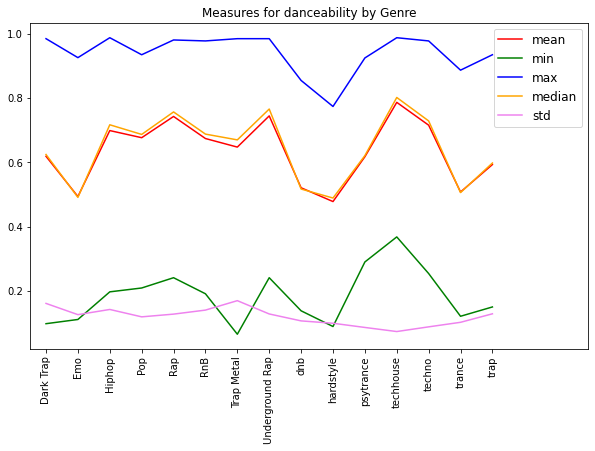

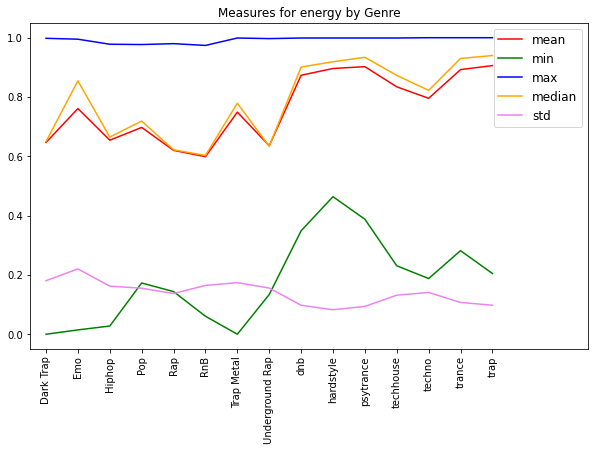

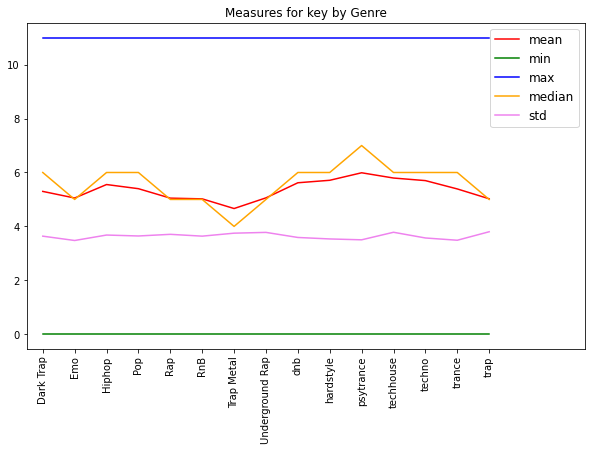

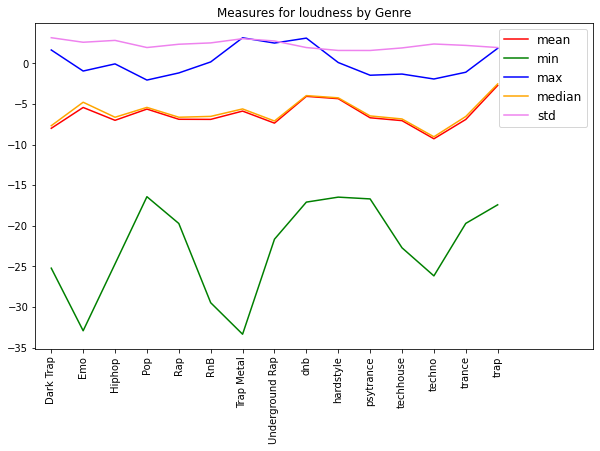

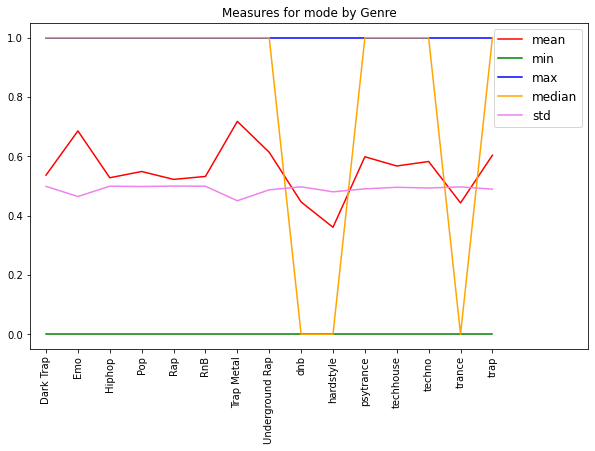

...

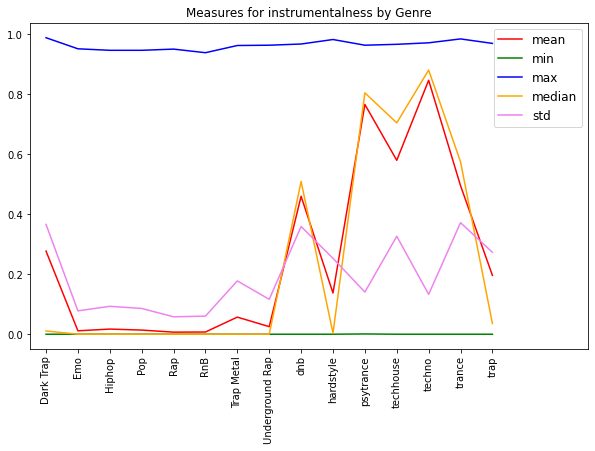

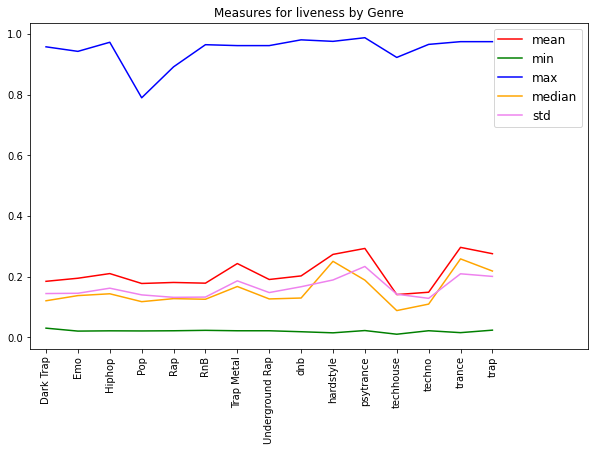

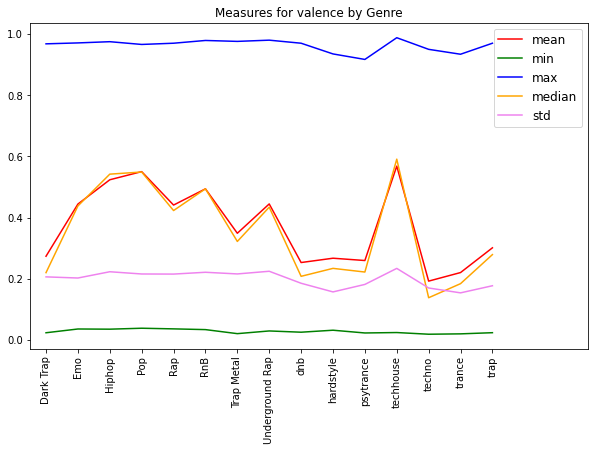

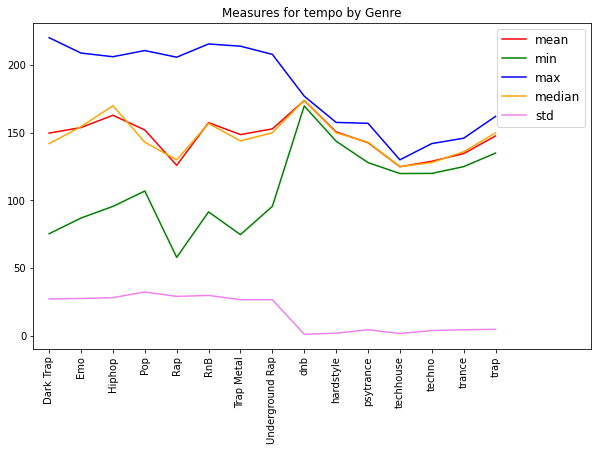

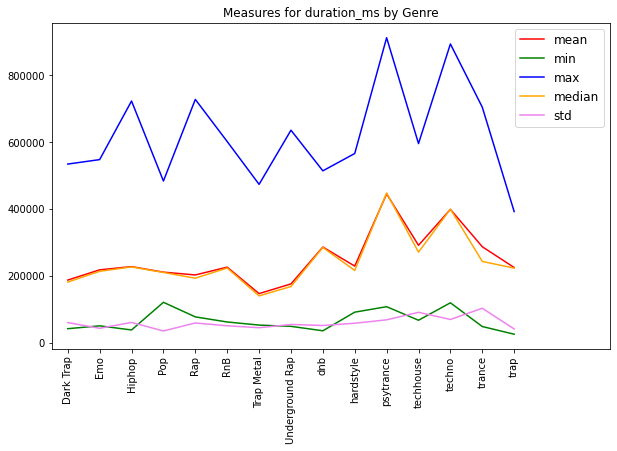

In [ ]:
for i in range(len(measures)):
  fig,ax = plt.subplots(figsize=(10,6))
  ax.plot(genre_list,genre_stats_df.loc[genre_stats_df.measure == measures[i]]['mean'],c='r')
  ax.plot(genre_list,genre_stats_df.loc[genre_stats_df.measure == measures[i]]['min'],c='g')
  ax.plot(genre_list,genre_stats_df.loc[genre_stats_df.measure == measures[i]]['max'],c='b')
  ax.plot(genre_list,genre_stats_df.loc[genre_stats_df.measure == measures[i]]['median'],c='orange')
  ax.plot(genre_list,genre_stats_df.loc[genre_stats_df.measure == measures[i]]['std'],c='violet')
  ax.set_xticklabels(labels,rotation = 90)
  ax.set_xlim(-0.5,17)
  ax.set_title('Measures for {} by Genre'.format(measures[i]))
  plt.legend(['mean','min','max','median','std'],fontsize=12,loc= 'upper right')
  plt.show()

Well it's pretty clear that the different genres have quite a bit of variation in their measurements, with some being MUCH different than others such as 'dnb','hardstyle', and 'psytrance' having typically very different values than others. Also, some genres are very similar. It's also clear given the standard deviations that there is certainly variability within genres. The minimums and the maximums within genre seem to be rather far apart. 

It is also important to consider that people don't always like songs from just one genre. It's more likely that people will like songs that are similar of different genres. 

Throughout this project, the "target" genre will be used to measure the ARI, but more consideration will be given to the silhouettes core in determineing the best models than the ARIs, as the genre does not necessarily provide a definitive catergory for all measures. Using the silhouette score will ensure that we do not lock the listeners of the app into listening to only one genre, but expand their tastes based on characteristics of songs instead, even if it is between genres. 

#### Label Encoding of Genre for Easier Clusering, Calculations, and Visualizations Later On

In [ ]:
for i in range(len(genre_list)):
  music_df.loc[music_df.genre == genre_list[i],'genre'] = i

In [ ]:
music_df['genre'].value_counts()

7     5875
0     4578
2     3028
13    2999
14    2987
11    2975
8     2966
10    2961
12    2956
9     2936
5     2099
6     1956
4     1848
1     1680
3      461
Name: genre, dtype: int64

In [ ]:
genre_list_df = pd.DataFrame({'genre name':genre_list,'genre code':range(len(genre_list))})

In [ ]:
genre_list_df

,genre name,genre code
0,Dark Trap,0
1,Emo,1
2,Hiphop,2
3,Pop,3
4,Rap,4
5,RnB,5
6,Trap Metal,6
7,Underground Rap,7
8,dnb,8
9,hardstyle,9


### Data Visualization for Clusterability

In [ ]:
drop_list = ['type','id','uri','track_href','analysis_url','genre','song_name','title','Unnamed: 0']
X = music_df.drop(drop_list,axis=1)
X = StandardScaler().fit_transform(X)

#### PCA

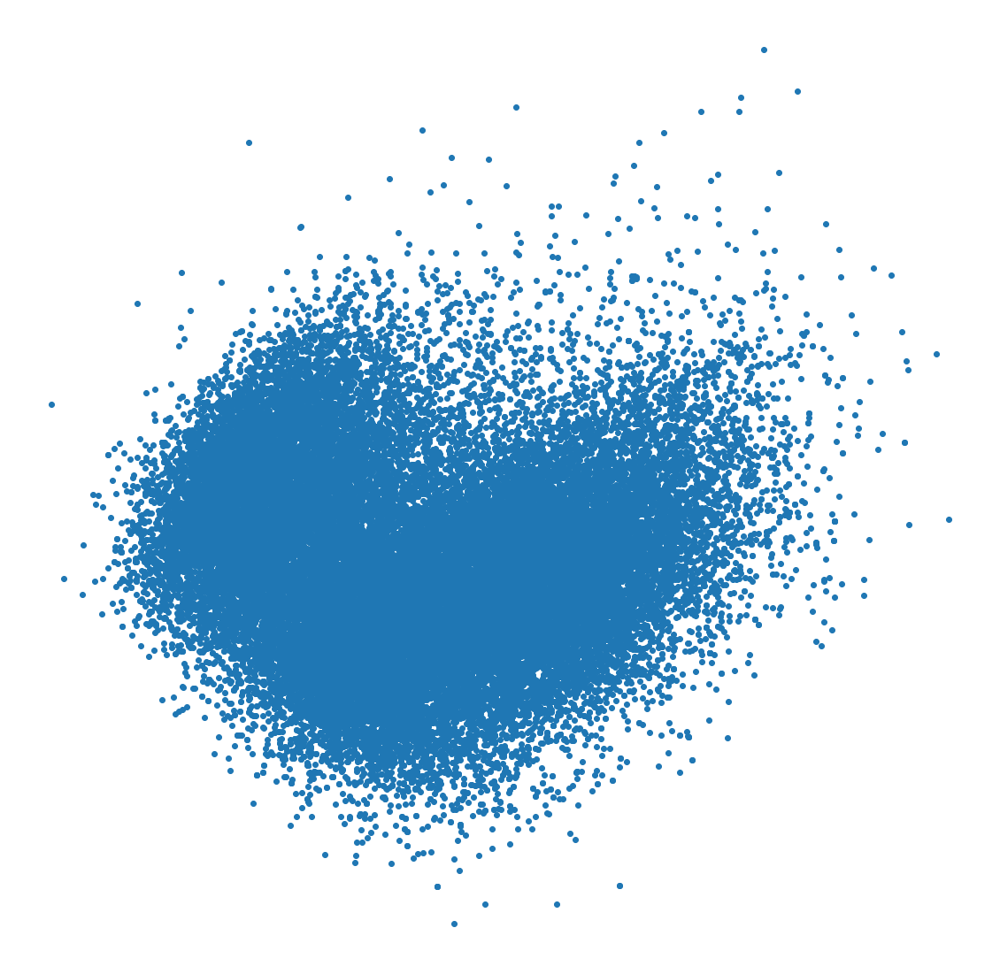

In [ ]:
pca = PCA(2).fit_transform(X)

plt.figure(figsize=(20,20))
plt.scatter(pca[:, 0], pca[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

#### UMAP

/usr/local/lib/python3.6/dist-packages/umap/spectral.py:253: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  "WARNING: spectral initialisation failed! The eigenvector solver\n"


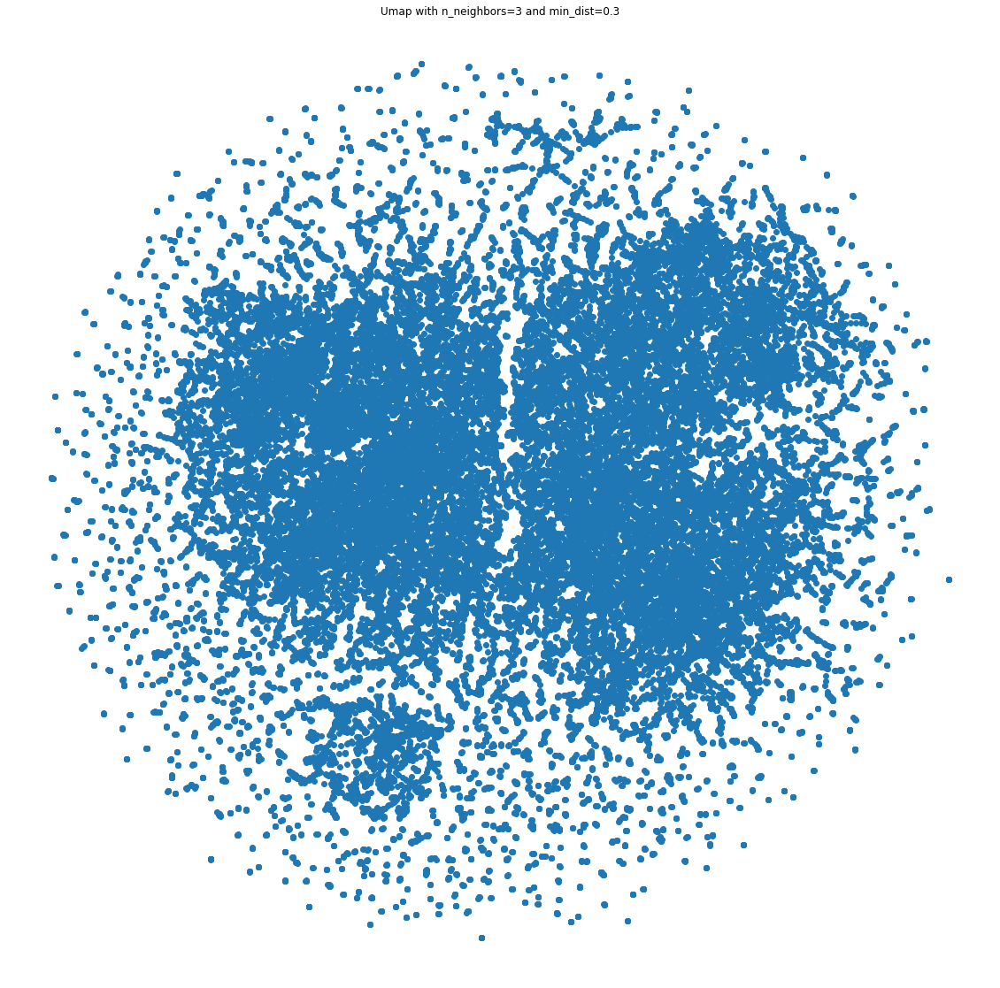

In [ ]:
umap_results = UMAP(n_neighbors=3,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X)

plt.figure(figsize=(20,20))
plt.title("Umap with n_neighbors=3 and min_dist=0.3")
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

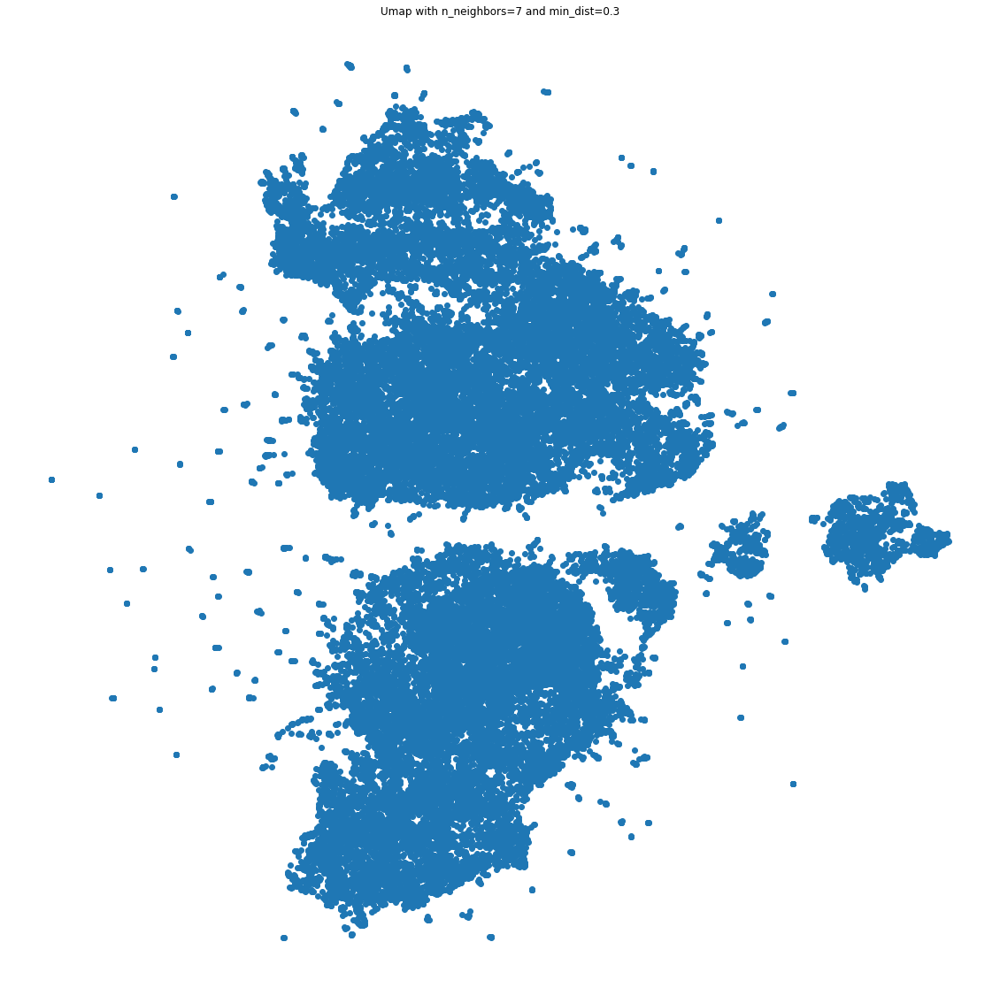

In [ ]:
umap_results = UMAP(n_neighbors=7,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X)

plt.figure(figsize=(20,20))
plt.title("Umap with n_neighbors=7 and min_dist=0.3")
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

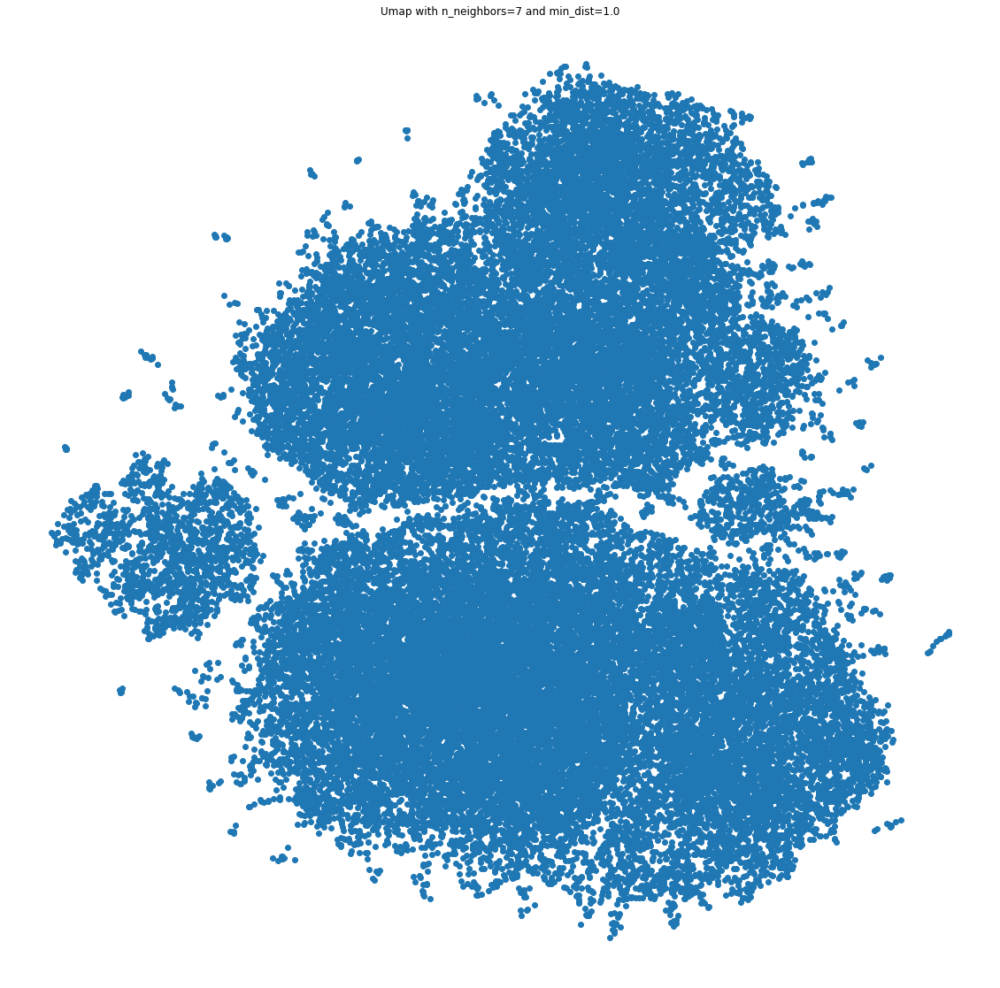

In [ ]:
umap_results = UMAP(n_neighbors=7,
                      min_dist=1.0,
                      metric='correlation').fit_transform(X)

plt.figure(figsize=(20,20))
plt.title("Umap with n_neighbors=7 and min_dist=1.0")
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

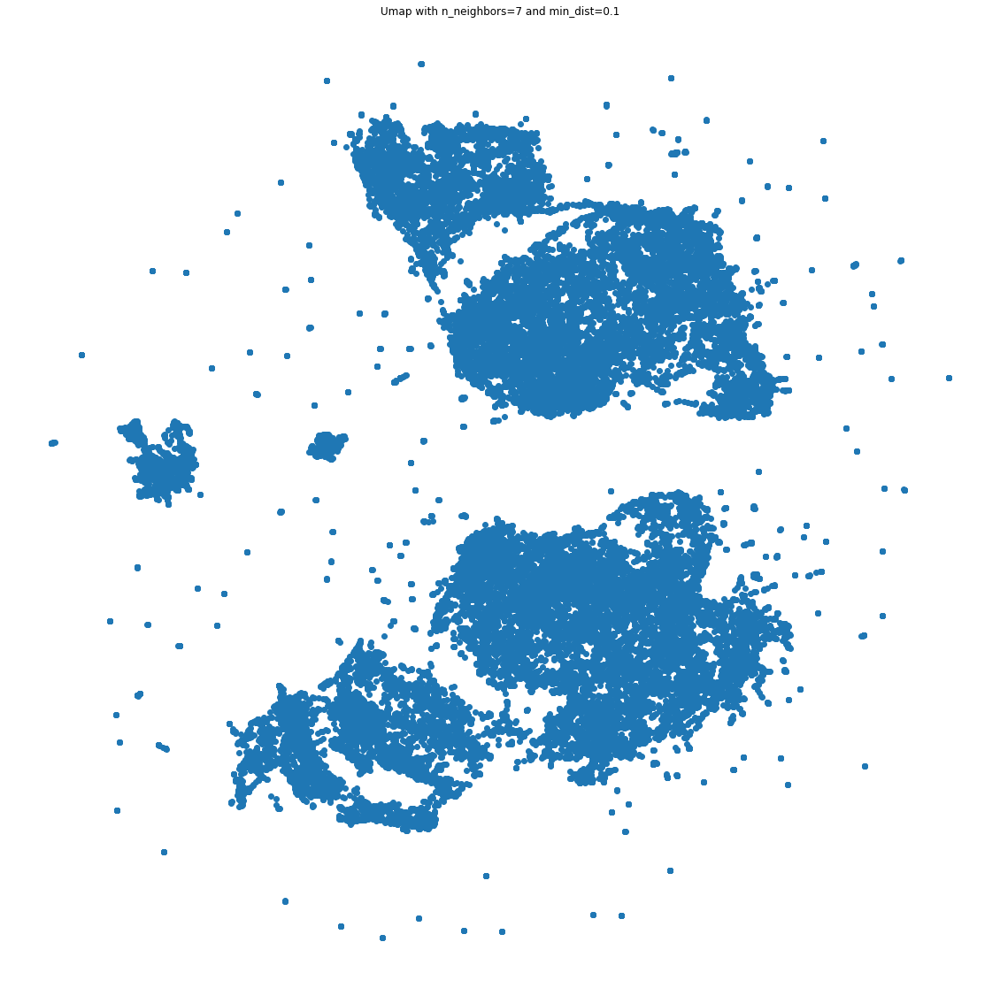

In [ ]:
umap_results = UMAP(n_neighbors=7,
                      min_dist=0.1,
                      metric='correlation').fit_transform(X)

plt.figure(figsize=(20,20))
plt.title("Umap with n_neighbors=7 and min_dist=0.1")
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

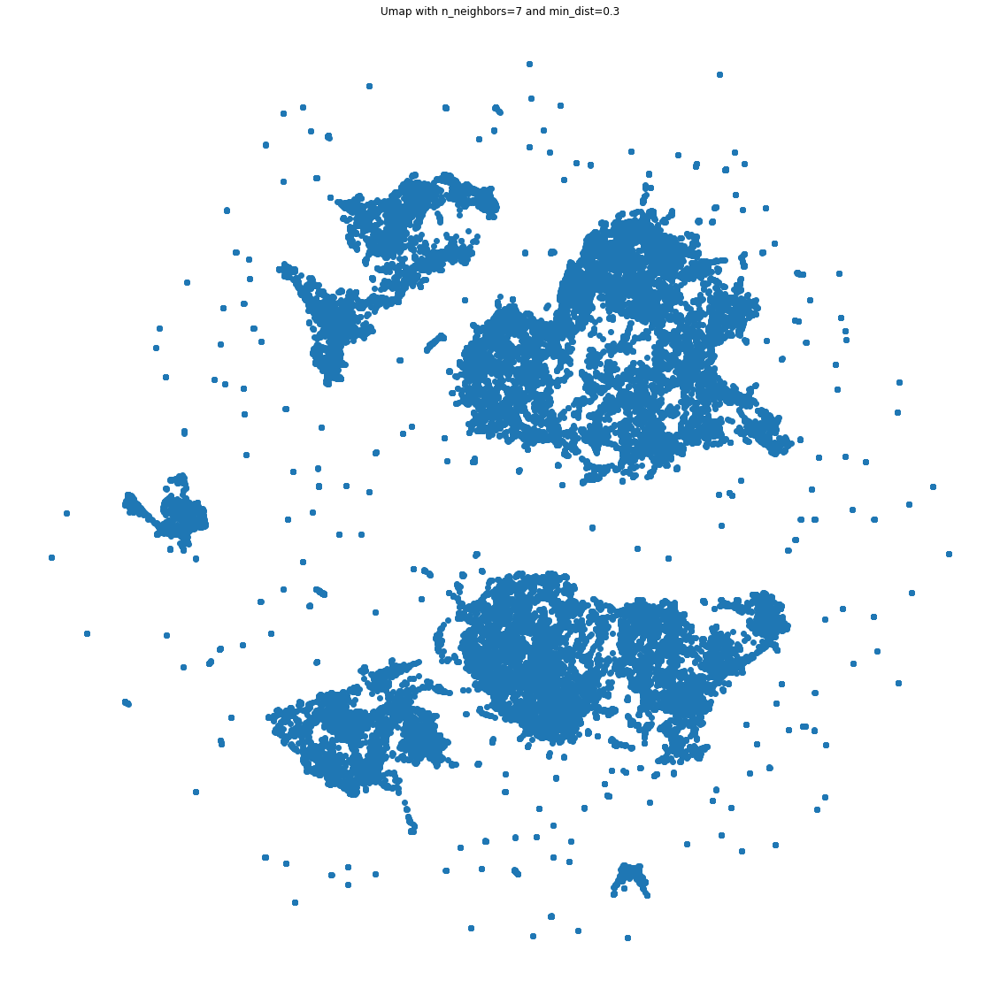

In [ ]:
umap_results = UMAP(n_neighbors=7,
                      min_dist=0.01,
                      metric='correlation').fit_transform(X)

plt.figure(figsize=(20,20))
plt.title("Umap with n_neighbors=7 and min_dist=0.3")
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In general it appears that UMAP may provide better visualizations given unique clusters are visible even in a scatter plot. Even so we will try both methods for visualizations. 

## Models

### Preprocessing

In [ ]:
music_df['genre'].nunique()

15

There are 15 different genres, it's possible that there are that many clusters, or perhaps more or less to account for similarities between genres or differences between songs in the same genre

In [ ]:
def run_model_no_vis(model,features,target):
  y_pred = model.fit_predict(features)

  ari = metrics.adjusted_rand_score(target,y_pred)
  sil = metrics.silhouette_score(features,y_pred,metric='euclidean')
  print('ARI Score: {}\nSilhouette: {}'.format(ari,sil))
  return ari, sil

#### Feature and Target Defining

In [ ]:
drop_list = ['type','id','uri','track_href','analysis_url','genre','song_name','title','Unnamed: 0']
X = music_df.drop(drop_list,axis=1)
X = StandardScaler().fit_transform(X)
y = music_df['genre']

#### Dimensionality Reduction

In [ ]:
pca = PCA(2).fit_transform(X)
umap = UMAP(n_neighbors = 7, 
                    min_dist=.3,
                    metric='correlation').fit_transform(X)

In [ ]:
tsne = TSNE(n_components=2, verbose=1, perplexity=40,n_iter=300)
tsne_results = tsne.fit_transform(X)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 42305 samples in 2.030s...
[t-SNE] Computed neighbors for 42305 samples in 44.856s...
[t-SNE] Computed conditional probabilities for sample 1000 / 42305
[t-SNE] Computed conditional probabilities for sample 2000 / 42305
[t-SNE] Computed conditional probabilities for sample 3000 / 42305
[t-SNE] Computed conditional probabilities for sample 4000 / 42305
[t-SNE] Computed conditional probabilities for sample 5000 / 42305
[t-SNE] Computed conditional probabilities for sample 6000 / 42305
[t-SNE] Computed conditional probabilities for sample 7000 / 42305
[t-SNE] Computed conditional probabilities for sample 8000 / 42305
[t-SNE] Computed conditional probabilities for sample 9000 / 42305
[t-SNE] Computed conditional probabilities for sample 10000 / 42305
[t-SNE] Computed conditional probabilities for sample 11000 / 42305
[t-SNE] Computed conditional probabilities for sample 12000 / 42305
[t-SNE] Computed conditional probabilities for s

In [ ]:
pca3 = PCA(3).fit_transform(X)

### K-means

In [ ]:
kmeans_results_df = pd.DataFrame({})

In [ ]:
kmeans_results_df['pca1'] = pca[:,0]
kmeans_results_df['pca2'] = pca[:,1]
kmeans_results_df['umap1'] = umap[:,0]
kmeans_results_df['umap2'] = umap[:,1]
kmeans_results_df['tsne1'] = tsne_results[:,0]
kmeans_results_df['tsne2'] = tsne_results[:,1]
kmeans_results_df['pca3_1'] = pca3[:,0]
kmeans_results_df['pca3_2'] = pca3[:,1]
kmeans_results_df['pca3_3'] = pca3[:,2]

#### Elbow Method

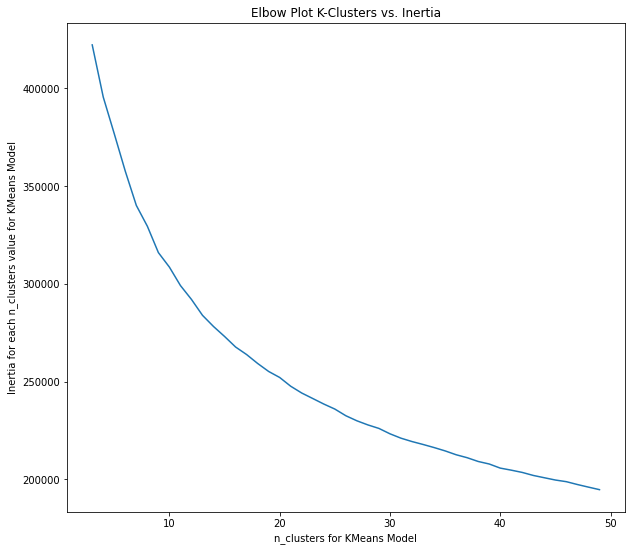

In [ ]:
inertia = []
k_vals = range(3,50)
for k in k_vals:
  kmean_clusters = KMeans(n_clusters=k,random_state=123)
  kmean_clusters.fit(X)
  inertia.append(kmean_clusters.inertia_)

inertia = pd.DataFrame({'inertia':inertia,'k_vals':k_vals})

plt.figure(figsize=(10,9))
plt.plot(inertia['k_vals'],inertia['inertia'])
plt.xlabel('n_clusters for KMeans Model')
plt.ylabel('Inertia for each n_clusters value for KMeans Model')
plt.title('Elbow Plot K-Clusters vs. Inertia')
plt.show()

##### Saving Results to Local Variables

In [ ]:
inertia_list = [422195.545830343,
 395509.9009950537,
 376721.03706651827,
 357561.83988155884,
 340075.31725756126,
 329430.4613895449,
 315942.9878684007,
 308510.57802455133,
 299093.71708130575,
 291988.9061226804,
 283857.9331053731,
 278138.8095230065,
 273047.5585029779,
 267655.4566902027,
 263796.69713546825,
 259239.6954321396,
 255137.07749095684,
 252064.13893201097,
 247581.4463889319,
 244109.66699392113,
 241302.96834170952,
 238476.54910263667,
 235909.45102689907,
 232491.30223595578,
 229907.11952380164,
 227796.34437601746,
 226003.54356696244,
 223254.13462677796,
 221008.49484505283,
 219287.988656294,
 217800.10355399534,
 216220.69617077598,
 214515.0177245724,
 212540.65253481743,
 211025.59181777356,
 209100.00240258855,
 207806.93142183832,
 205705.42609991017,
 204653.43150538948,
 203489.8843234674,
 201948.45446390996,
 200772.9405044038,
 199610.55197599006,
 198755.0866141139,
 197304.01096906062,
 195976.04909585405,
 194683.28251572614]

#### Examining ARI score and Silhouette Score per Cluster Number

In [ ]:
aris = []
sils = []
k_vals = range(2,50)
for i in range(len(k_vals)):
  kmeans_model = KMeans(n_clusters=k_vals[i],random_state =123)
  print('k_val: {}'.format(k_vals[i]))
  print('-'*40)
  ari,sil = run_model_no_vis(kmeans_model,X,y)
  aris.append(ari)
  sils.append(sil)

k_val: 2
----------------------------------------
ARI Score: 0.0963809315176683
Silhouette: 0.14871559372293505
k_val: 3
----------------------------------------
ARI Score: 0.14088253749987378
Silhouette: 0.13627767285748024
k_val: 4
----------------------------------------
ARI Score: 0.14934752956583663
Silhouette: 0.13466221280479235
k_val: 5
----------------------------------------
ARI Score: 0.15394774654152676
Silhouette: 0.12444909628034119
k_val: 6
----------------------------------------
ARI Score: 0.14247326821011297
Silhouette: 0.13432828419332155
k_val: 7
----------------------------------------
ARI Score: 0.1433371036046605
Silhouette: 0.13006108838864439
k_val: 8
----------------------------------------
ARI Score: 0.16085702761650186
Silhouette: 0.12035154384783105
k_val: 9
----------------------------------------
ARI Score: 0.15091893559332334
Silhouette: 0.12131164163178197
k_val: 10
----------------------------------------
ARI Score: 0.1234229299455528
Silhouette: 0.112

##### Saving Results to Local Variables

In [ ]:
aris = [0.0963809315176683,
 0.14088253749987378,
 0.14934752956583663,
 0.15394774654152676,
 0.14247326821011297,
 0.1433371036046605,
 0.16085702761650186,
 0.15091893559332334,
 0.1234229299455528,
 0.12529090641265908,
 0.15404278941807475,
 0.12699674540576197,
 0.12457111629123012,
 0.13304716430373847,
 0.13622549361244027,
 0.13463414989035738,
 0.13086323594234658,
 0.12943735266286674,
 0.12724612947974592,
 0.12357871443695616,
 0.12142753732981827,
 0.11980997382930543,
 0.11497239485601679,
 0.11719844910904387,
 0.11486969426889453,
 0.11188443519944977,
 0.11074797770872542,
 0.10969780011748678,
 0.10770048361490299,
 0.10420240016716062,
 0.10358649364117188,
 0.10218037033290207,
 0.0976374825860759,
 0.08978945018802144,
 0.08896527530356019,
 0.09273425264611716,
 0.10753032409969016,
 0.0933797043132811,
 0.09281770255634396,
 0.0939995860288248,
 0.09197378462900514,
 0.09161408473985756,
 0.0891727458118683,
 0.08876133318984865,
 0.08856899687363992,
 0.09236202604750364,
 0.08565066053769335,
 0.08521457897732888]

In [ ]:
sils = [0.14871559372293505,
 0.13627767285748024,
 0.13466221280479235,
 0.12444909628034119,
 0.13432828419332155,
 0.13006108838864439,
 0.12035154384783105,
 0.12131164163178197,
 0.11236531586241431,
 0.11292803224802217,
 0.1233537117003901,
 0.11666189143217837,
 0.11648364502238191,
 0.11435669356200612,
 0.11346325622878328,
 0.11330605067961155,
 0.11271346374172551,
 0.1157926936423429,
 0.11220396112897284,
 0.11650244488537143,
 0.11080997850146339,
 0.11066036661031799,
 0.10939641870257234,
 0.10796615635622184,
 0.10970663183625058,
 0.1098500235292775,
 0.11173159577499918,
 0.11144449478390715,
 0.1108446706392094,
 0.10984542677725015,
 0.10980958779853646,
 0.10939363672284724,
 0.10877289412390928,
 0.10860121037281065,
 0.1083937319509687,
 0.10934188122019799,
 0.108858968294476,
 0.11250445510883522,
 0.11256285396050367,
 0.11135477273811359,
 0.11152472009714735,
 0.11224149271076103,
 0.11328100511553853,
 0.11297880749219652,
 0.11229943317449272,
 0.11238062193368004,
 0.11171183648569728,
 0.1123482939760985]

In [ ]:
k_vals = range(2,50)

In [ ]:
k_means_metrics = pd.DataFrame({'k_vals':k_vals,'aris':aris,'sils':sils})

##### Visualizing ARI and Silhouette Score per Cluster Number

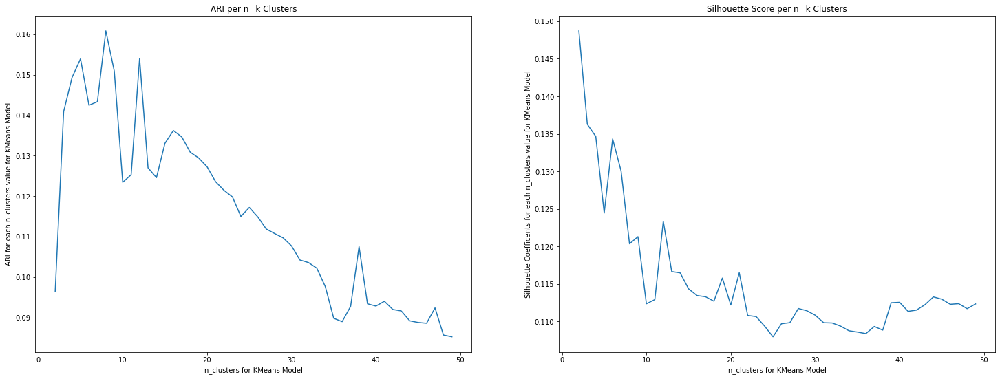

In [ ]:
plt.figure(figsize=(25,9))
plt.subplot(1,2,1)
plt.plot(k_means_metrics['k_vals'],k_means_metrics['aris'])
plt.xlabel('n_clusters for KMeans Model')
plt.ylabel('ARI for each n_clusters value for KMeans Model')
plt.title('ARI per n=k Clusters')
plt.subplot(1,2,2)
plt.plot(k_means_metrics['k_vals'],k_means_metrics['sils'])
plt.xlabel('n_clusters for KMeans Model')
plt.ylabel('Silhouette Coefficents for each n_clusters value for KMeans Model')
plt.title('Silhouette Score per n=k Clusters')
plt.show()

In [ ]:
max(sils)

0.14871559372293505

The maximum silhouette score is okay, let's see where it is. 

In [ ]:
for i in range(len(sils)):
  if sils[i] == max(sils):
    print(i)

0


It's at index 0, which we know is 3 clusters. 

In [ ]:
max(aris)

0.16085702761650186

In [ ]:
for i in range(len(aris)):
  if aris[i] == max(aris):
    print(i)

6


Maximum ARI is at index 6, which is 8 clusters.

In [ ]:
k_vals[6]

8

In [ ]:
sils[6]

0.12035154384783105

The silhouette score here is not too bad either. Better than the ARI. 

In [ ]:
k_vals[3]

5

In [ ]:
aris[3]

0.15394774654152676

In [ ]:
sils[3]

0.12444909628034119

5 clusters could also be a good value to try out and visualize. 

There is also a distinct spike of Silhouette score and ARI at index 10. 

In [ ]:
sils[10]

0.1233537117003901

In [ ]:
aris[10]

0.15404278941807475

In [ ]:
k_vals[10]

11

We will also try k=11

#### Elbow Method Using Lower Value than 3

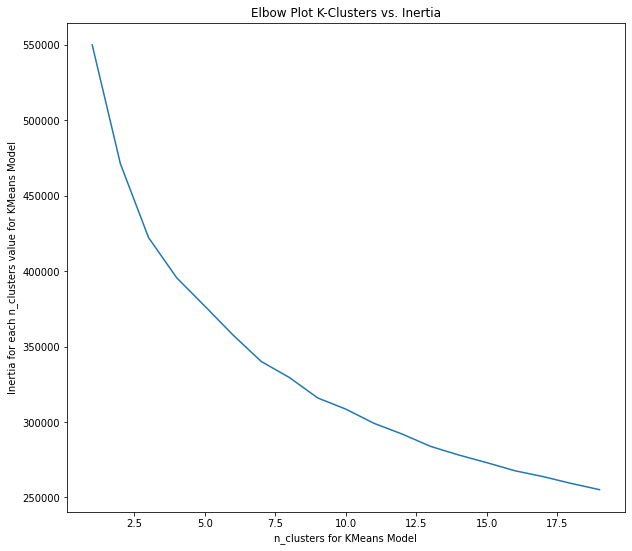

In [ ]:
inertia = []
k_vals = range(1,20)
for k in k_vals:
  kmean_clusters = KMeans(n_clusters=k,random_state=123)
  kmean_clusters.fit(X)
  inertia.append(kmean_clusters.inertia_)

inertia = pd.DataFrame({'inertia':inertia,'k_vals':k_vals})

plt.figure(figsize=(10,9))
plt.plot(inertia['k_vals'],inertia['inertia'])
plt.xlabel('n_clusters for KMeans Model')
plt.ylabel('Inertia for each n_clusters value for KMeans Model')
plt.title('Elbow Plot K-Clusters vs. Inertia')
plt.show()

While the inertia continually goes down as the cluster number increases, there is a distinct change at 3 clusters and 8. These are a likely possibilities of procuding the best results.

Based on the above results of the Silhouette score and the second attempt at Elbow Method, it also might be interesting to use 

#### Visualizing Results for Different Values of n_clusters 

Here we will run the models with the best possible k-values and visualize the results with PCA and UMAP. For cluster numbers we will try k=3, k=5, and k=8

##### k = 3

###### Running the Model

In [ ]:
kmeans3 = KMeans(n_clusters=3)
kmeans_clusters3 = kmeans3.fit_predict(X)
kmeans_results_df['clusters3'] = kmeans_clusters3
kmeans_results_df['clusters3'].value_counts()

0    15313
1    15039
2    11953
Name: clusters3, dtype: int64

In [ ]:
kmean3_ari = metrics.adjusted_rand_score(y,kmeans_clusters3)
kmean3_sil = metrics.silhouette_score(X,kmeans_clusters3,metric='euclidean')
print('ARI Score: {}\nSilhouette: {}'.format(kmean3_ari,kmean3_sil))

ARI Score: 0.14085722192320924
Silhouette: 0.13628551776382347


###### Visualization with PCA

Let's look at PCA with 2 principle components

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """


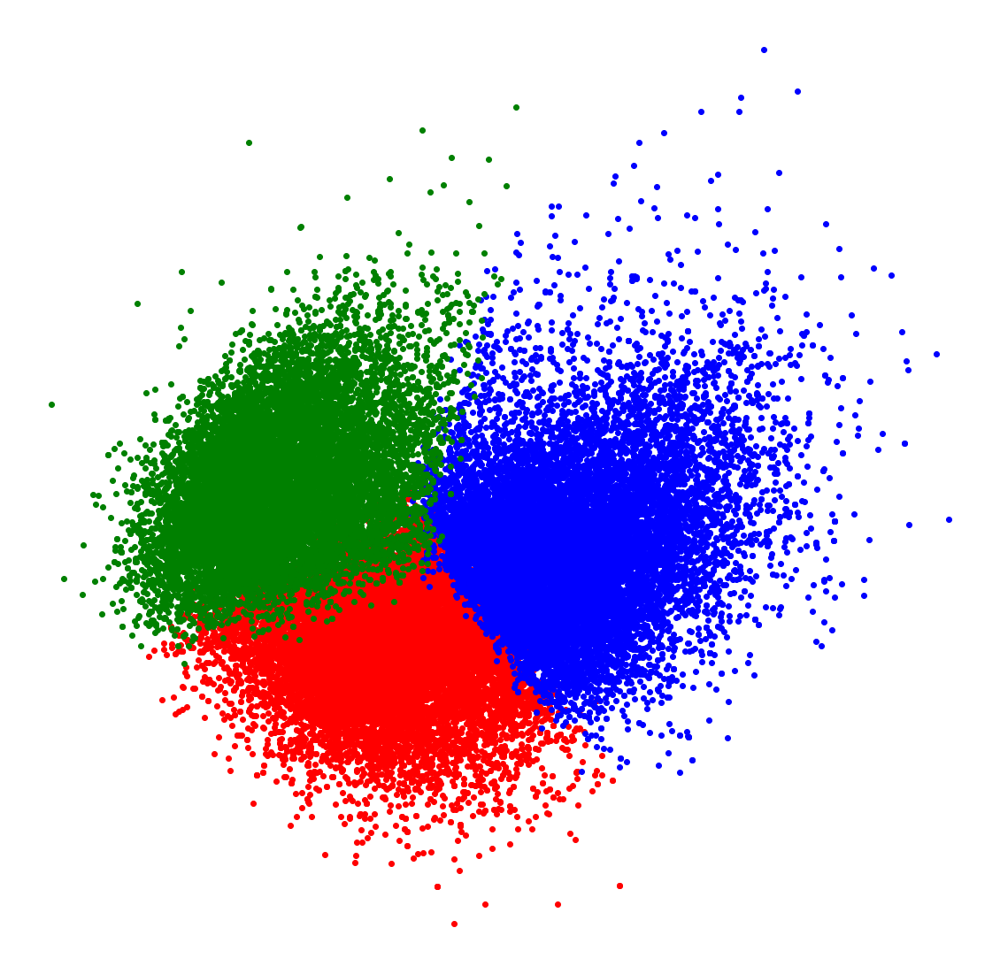

In [ ]:
plt.figure(figsize=(20,20))
colours = ["r","b","g","y","m","k","c","orange"]
cluster_labels = kmeans_results_df['clusters3'].value_counts().index.tolist()
for i in range(len(cluster_labels)):
  plt.subplot(1,1,1)
  plt.scatter(
      kmeans_results_df.loc[kmeans_results_df.clusters3 == cluster_labels[i]]['pca1'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters3 == cluster_labels[i]]['pca2'].values.tolist(),
      c = colours[i]
      )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

This is interesting and loks pretty good, but it would also be valuable to examine the clusters in 3-D, and perhaps more useful.

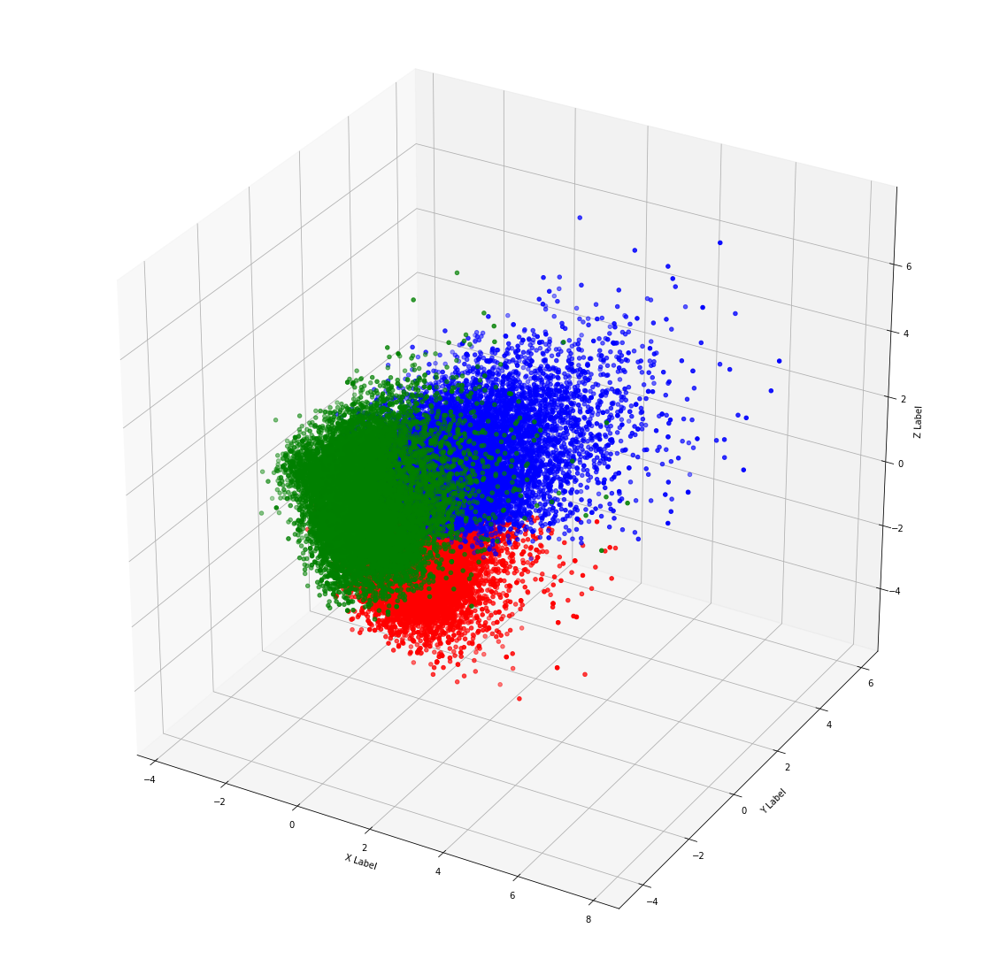

In [ ]:
colours = ["r","b","g","y","m","k","c","orange"]
cluster_labels = kmeans_results_df['clusters3'].value_counts().index.tolist()

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')

for i in range(len(cluster_labels)):
  ax.scatter(
      kmeans_results_df.loc[kmeans_results_df.clusters3 == cluster_labels[i]]['pca3_3'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters3 == cluster_labels[i]]['pca3_1'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters3 == cluster_labels[i]]['pca3_2'].values.tolist(),
      c = colours[i]
  )
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
plt.show()

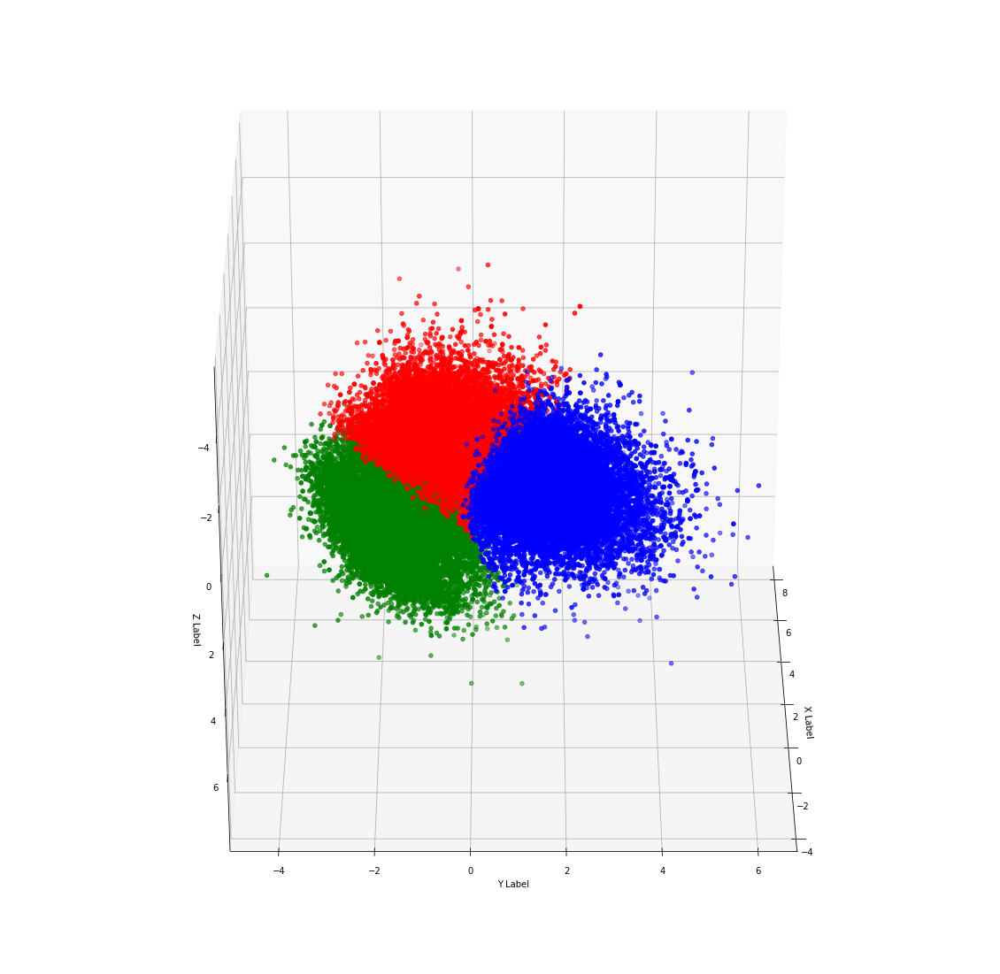

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [ ]:
colours = ["r","b","g","y","m","k","c","orange"]
cluster_labels = kmeans_results_df['clusters3'].value_counts().index.tolist()

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')

for i in range(len(cluster_labels)):
  ax.scatter(
      kmeans_results_df.loc[kmeans_results_df.clusters3 == cluster_labels[i]]['pca3_3'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters3 == cluster_labels[i]]['pca3_1'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters3 == cluster_labels[i]]['pca3_2'].values.tolist(),
      c = colours[i]
  )
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

# rotate the axes and update
for angle in range(0, 360):
    ax.view_init(210, angle)
    plt.draw()
    plt.pause(.001)

plt.show()

With rotations in 3-D we can see much more of all 3 clusters, and although they are intermeshed with one another, it's clear that there are certainly defined clusters. 

###### Visualization with UMAP

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """


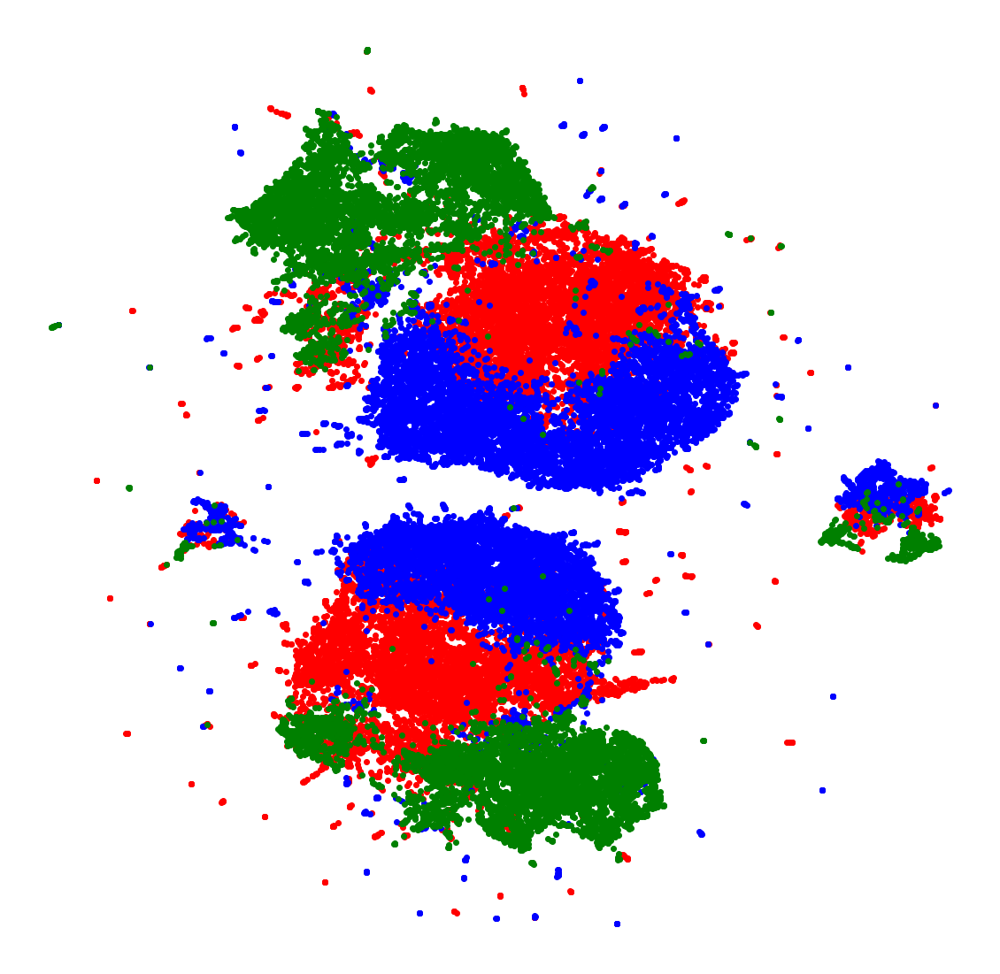

In [ ]:
plt.figure(figsize=(20,20))
colours = ["r","b","g","y","m","k","c","orange"]
cluster_labels = kmeans_results_df['clusters3'].value_counts().index.tolist()
for i in range(len(cluster_labels)):
  plt.subplot(1,1,1)
  plt.scatter(
      kmeans_results_df.loc[kmeans_results_df.clusters3 == cluster_labels[i]]['umap1'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters3 == cluster_labels[i]]['umap2'].values.tolist(),
      c = colours[i]
      )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Well that just does NOT look that great!

###### Visualization with t-SNE

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """


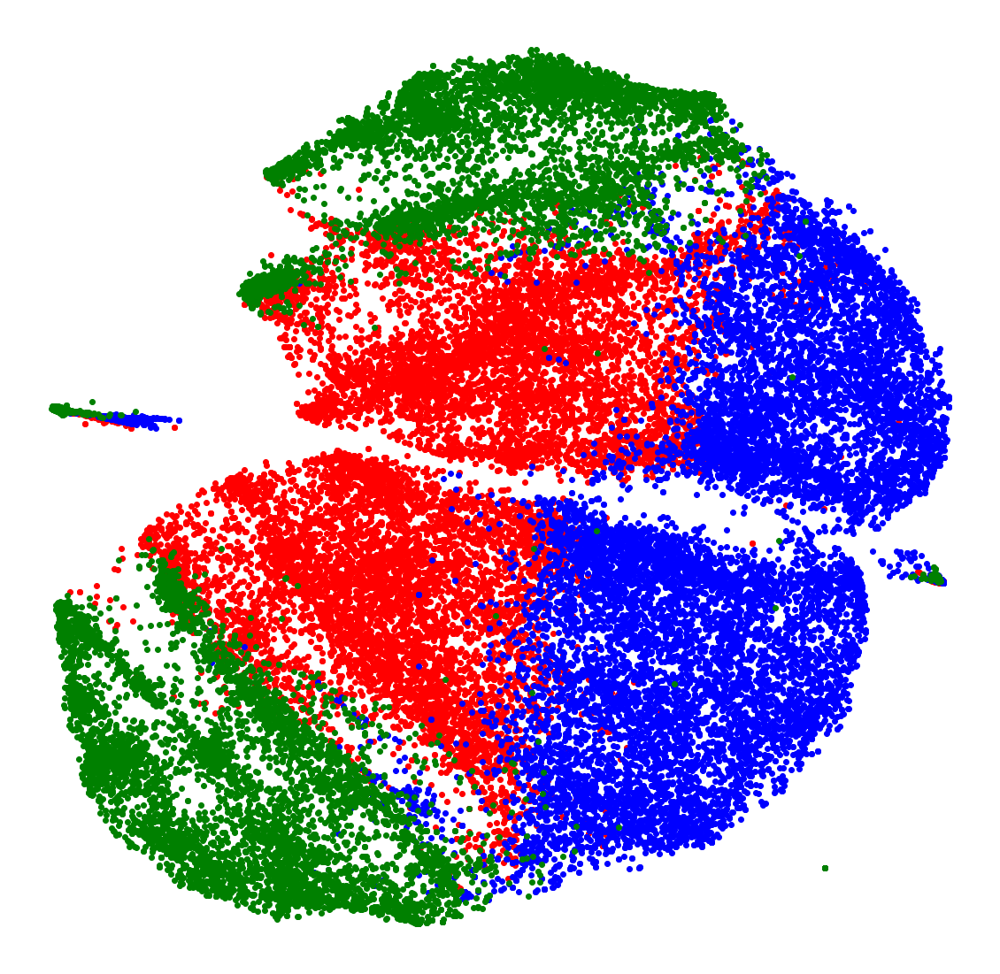

In [ ]:
plt.figure(figsize=(20,20))
colours = ["r","b","g","y","m","k","c","orange"]
cluster_labels = kmeans_results_df['clusters3'].value_counts().index.tolist()
for i in range(len(cluster_labels)):
  plt.subplot(1,1,1)
  plt.scatter(
      kmeans_results_df.loc[kmeans_results_df.clusters3 == cluster_labels[i]]['tsne1'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters3 == cluster_labels[i]]['tsne2'].values.tolist(),
      c = colours[i]
      )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Also the same issue as with UMAP. Everything distinct cluster has a bit of every color. 

##### k = 5

###### Running the Model

In [ ]:
kmeans5 = KMeans(n_clusters=5)
kmeans_clusters5 = kmeans5.fit_predict(X)

In [ ]:
kmeans_results_df['clusters5'] = kmeans_clusters5

In [ ]:
kmeans_results_df['clusters5'].value_counts()

0    12283
4    10162
2     8513
3     7580
1     3767
Name: clusters5, dtype: int64

In [ ]:
kmean5_ari = metrics.adjusted_rand_score(y,kmeans_clusters5)
kmean5_sil = metrics.silhouette_score(X,kmeans_clusters5,metric='euclidean')
print('ARI Score: {}\nSilhouette: {}'.format(kmean5_ari,kmean5_sil))

ARI Score: 0.15402784648903284
Silhouette: 0.12442605009308694


###### Visualization with PCA

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future

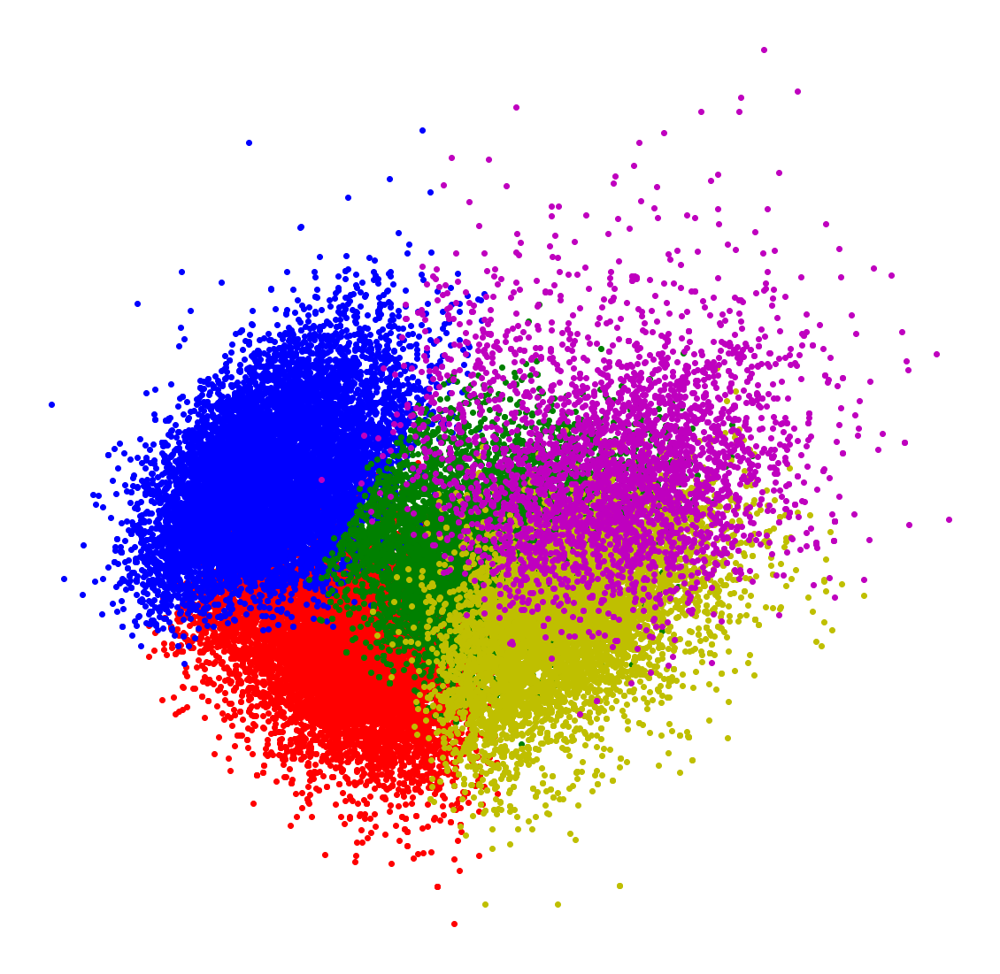

In [ ]:
plt.figure(figsize=(20,20))
colours = ["r","b","g","y","m","k","c","orange"]
cluster_labels = kmeans_results_df['clusters5'].value_counts().index.tolist()
for i in range(len(cluster_labels)):
  plt.subplot(1,1,1)
  plt.scatter(
      kmeans_results_df.loc[kmeans_results_df.clusters5 == cluster_labels[i]]['pca1'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters5 == cluster_labels[i]]['pca2'].values.tolist(),
      c = colours[i]
      )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

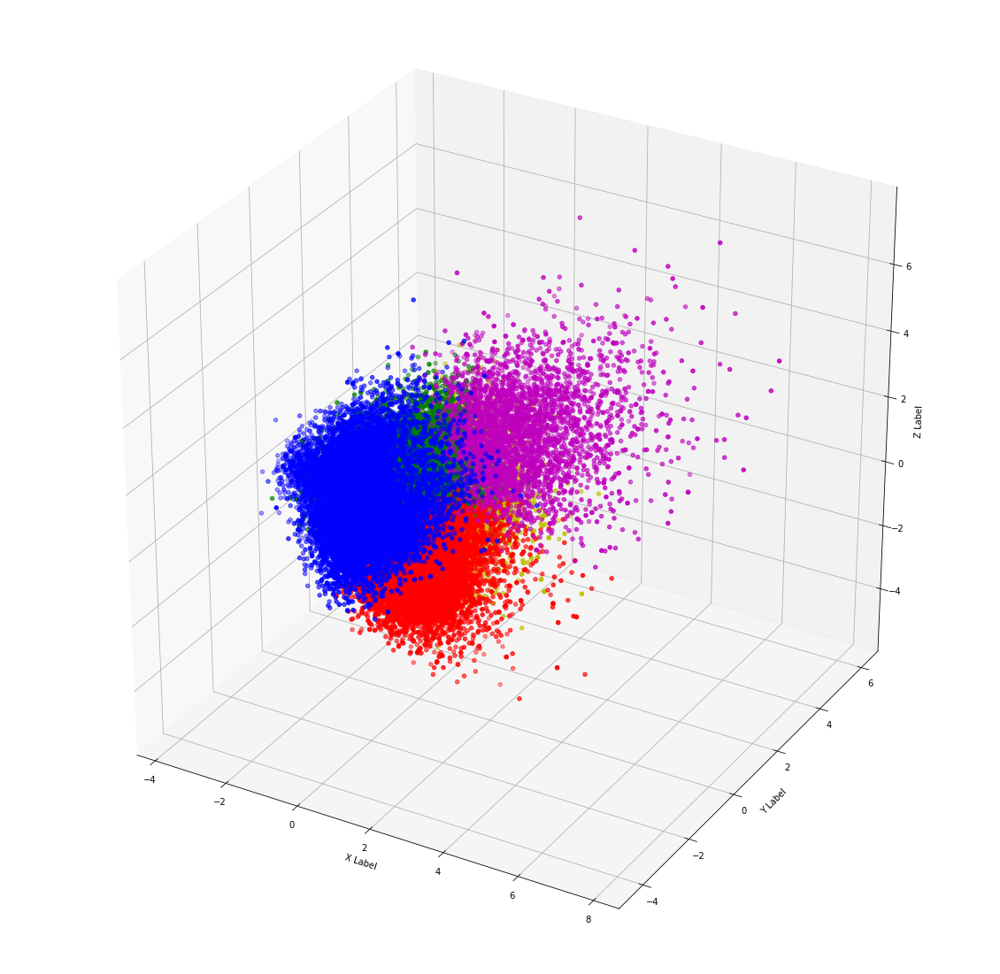

In [ ]:
colours = ["r","b","g","y","m","k","c","orange"]
cluster_labels = kmeans_results_df['clusters5'].value_counts().index.tolist()

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')

for i in range(len(cluster_labels)):
  ax.scatter(
      kmeans_results_df.loc[kmeans_results_df.clusters5 == cluster_labels[i]]['pca3_3'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters5 == cluster_labels[i]]['pca3_1'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters5 == cluster_labels[i]]['pca3_2'].values.tolist(),
      c = colours[i]
  )
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
plt.show()

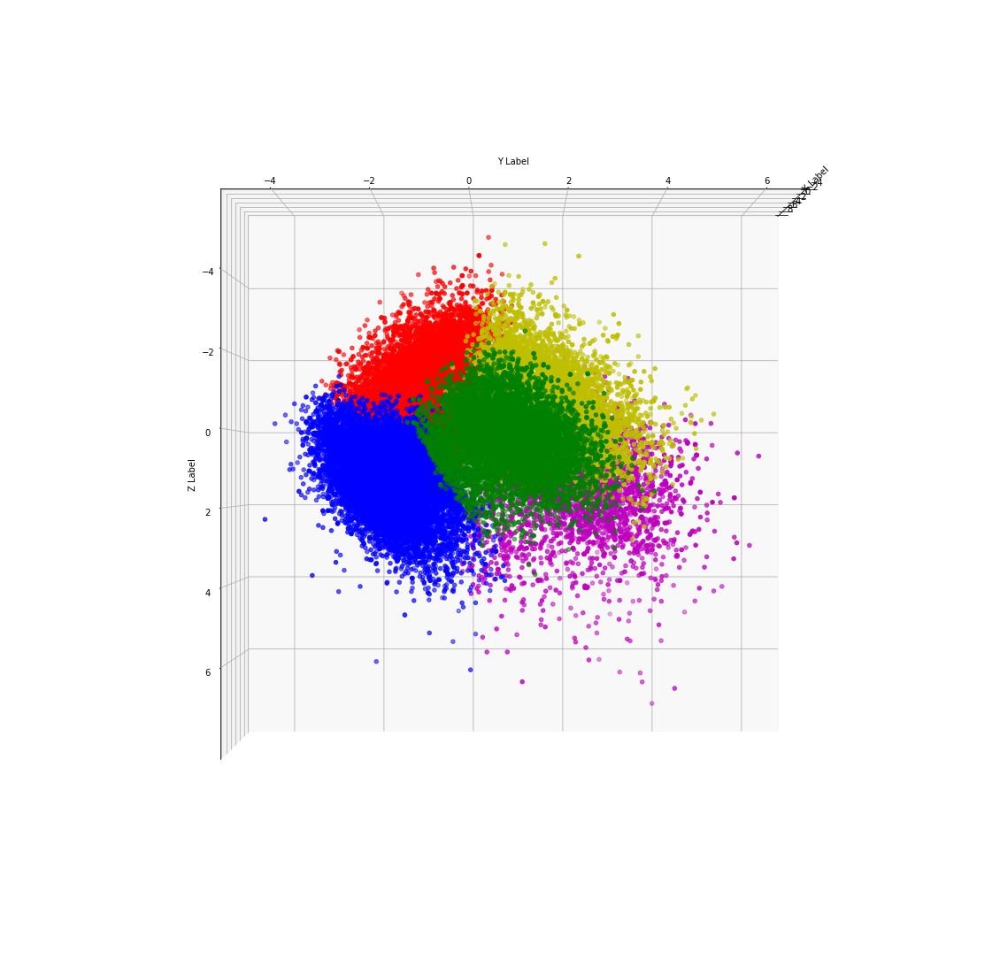

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [ ]:
colours = ["r","b","g","y","m","k","c","orange"]
cluster_labels = kmeans_results_df['clusters5'].value_counts().index.tolist()

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')

for i in range(len(cluster_labels)):
  ax.scatter(
      kmeans_results_df.loc[kmeans_results_df.clusters5 == cluster_labels[i]]['pca3_3'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters5 == cluster_labels[i]]['pca3_1'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters5 == cluster_labels[i]]['pca3_2'].values.tolist(),
      c = colours[i]
  )
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

# rotate the axes and update
for angle in range(0, 360):
    ax.view_init(180, angle)
    plt.draw()
    plt.pause(.001)

plt.show()

###### Visualization with UMAP

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future

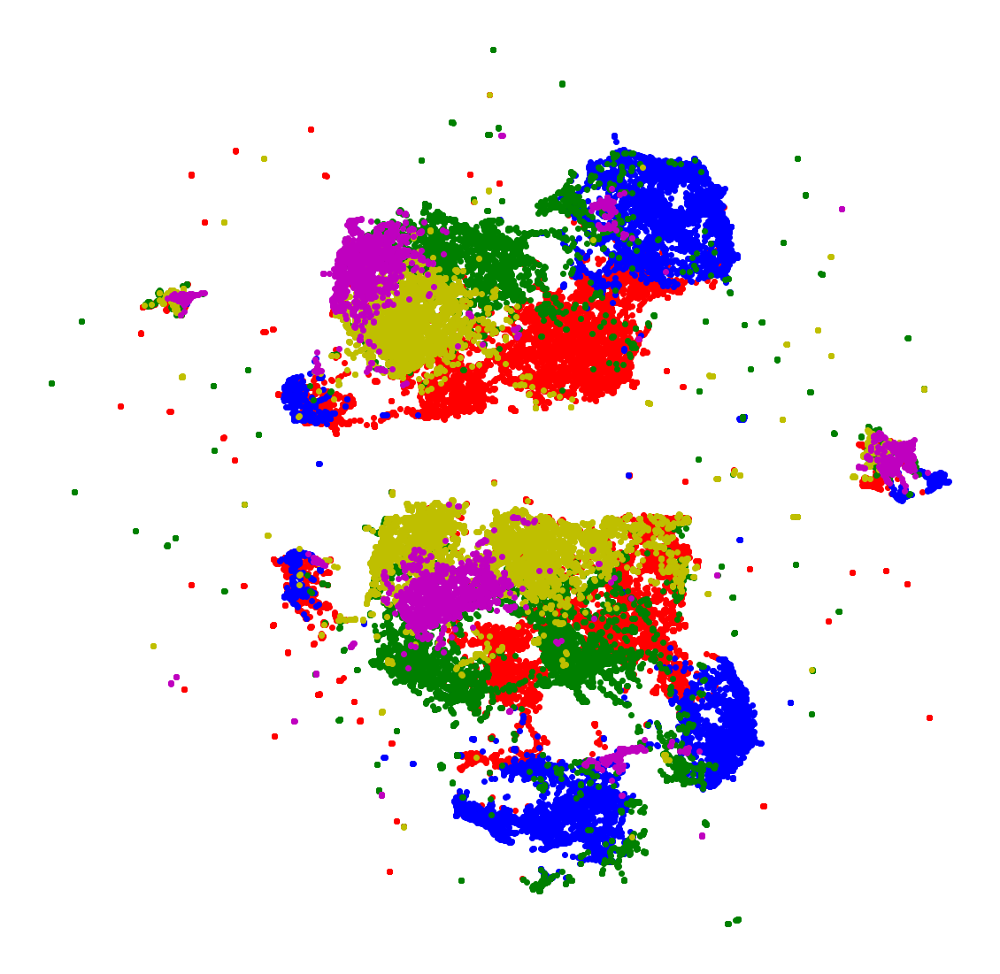

In [ ]:
plt.figure(figsize=(20,20))
colours = ["r","b","g","y","m","k","c","orange"]
cluster_labels = kmeans_results_df['clusters5'].value_counts().index.tolist()
for i in range(len(cluster_labels)):
  plt.subplot(1,1,1)
  plt.scatter(
      kmeans_results_df.loc[kmeans_results_df.clusters5 == cluster_labels[i]]['umap1'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters5 == cluster_labels[i]]['umap2'].values.tolist(),
      c = colours[i]
      )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

###### Visualization with t-SNE

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future

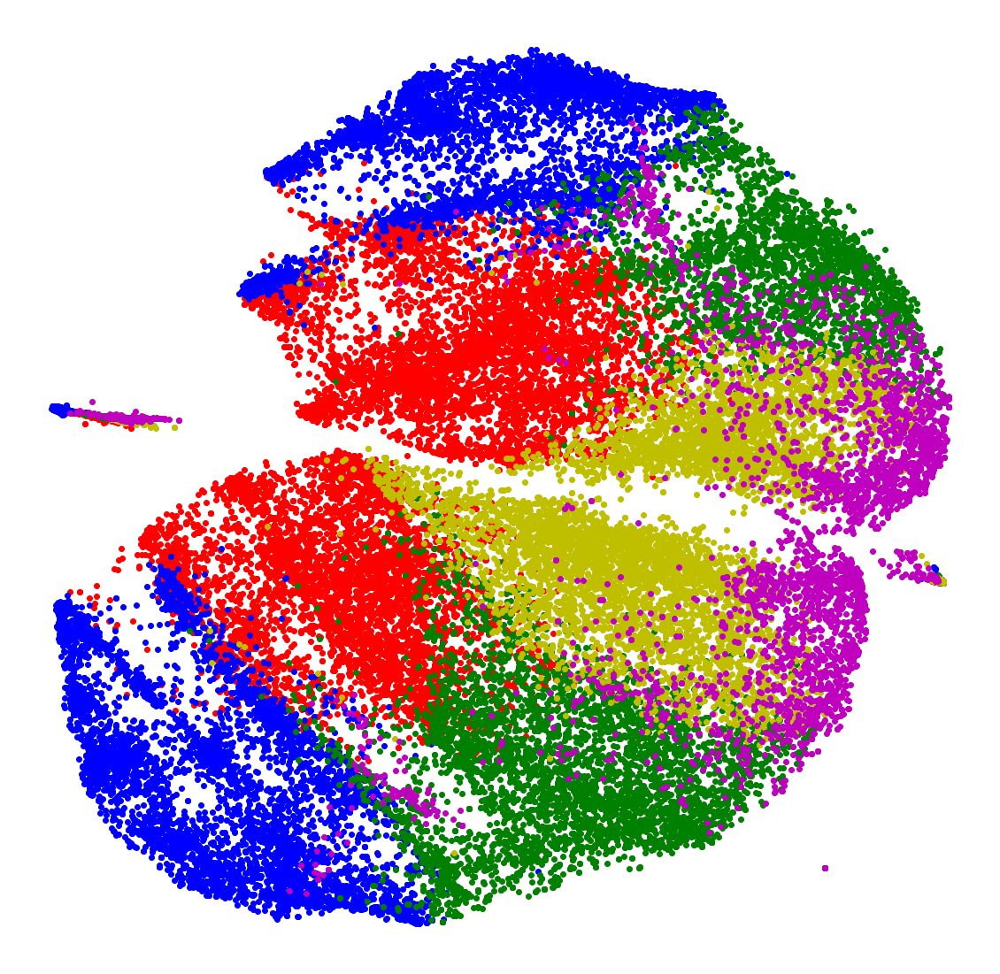

In [ ]:
plt.figure(figsize=(20,20))
colours = ["r","b","g","y","m","k","c","orange"]
cluster_labels = kmeans_results_df['clusters5'].value_counts().index.tolist()
for i in range(len(cluster_labels)):
  plt.subplot(1,1,1)
  plt.scatter(
      kmeans_results_df.loc[kmeans_results_df.clusters5 == cluster_labels[i]]['tsne1'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters5 == cluster_labels[i]]['tsne2'].values.tolist(),
      c = colours[i]
      )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Once again, PCA is the best in 3-D, with UMAP and t-SNE showing all clusters on each of its distinct clusters.

##### k = 8

###### Running the Model

In [ ]:
kmeans8 = KMeans(n_clusters=8)
kmeans_clusters8 = kmeans8.fit_predict(X)
kmeans_results_df['clusters8'] = kmeans_clusters8
kmeans_results_df['clusters8'].value_counts().sort_index()

0    6676
1    6670
2    8224
3    2886
4    3379
5    6943
6    7377
7     150
Name: clusters8, dtype: int64

In [ ]:
kmean8_ari = metrics.adjusted_rand_score(y,kmeans_clusters8)
kmean8_sil = metrics.silhouette_score(X,kmeans_clusters8,metric='euclidean')
print('ARI Score: {}\nSilhouette: {}'.format(kmean8_ari,kmean8_sil))

ARI Score: 0.14773175251133025
Silhouette: 0.12183872793540652


###### Visualization with PCA

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future

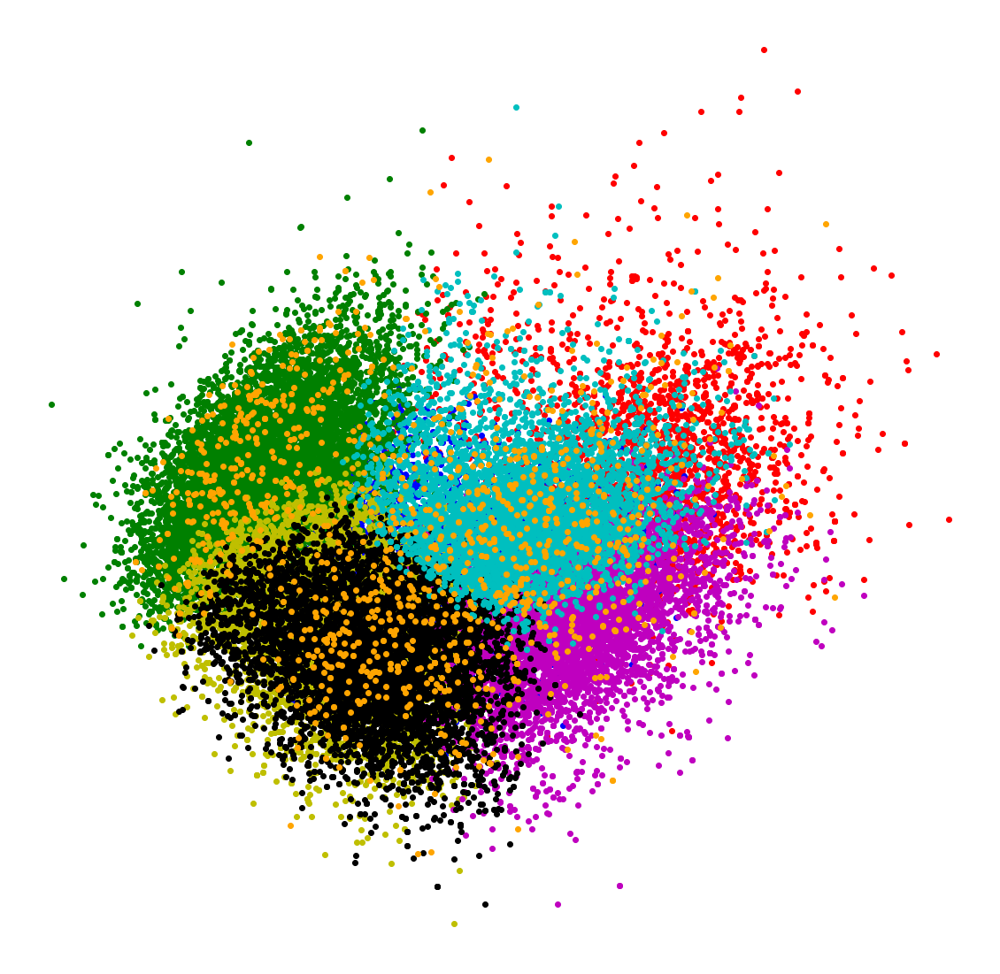

In [ ]:
plt.figure(figsize=(20,20))
colours = ["r","b","g","y","m","k","c","orange"]
cluster_labels = kmeans_results_df['clusters8'].value_counts().sort_index().index.tolist()
for i in range(len(cluster_labels)):
  plt.subplot(1,1,1)
  plt.scatter(
      kmeans_results_df.loc[kmeans_results_df.clusters8 == cluster_labels[i]]['pca1'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters8 == cluster_labels[i]]['pca2'].values.tolist(),
      c = colours[i]
      )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

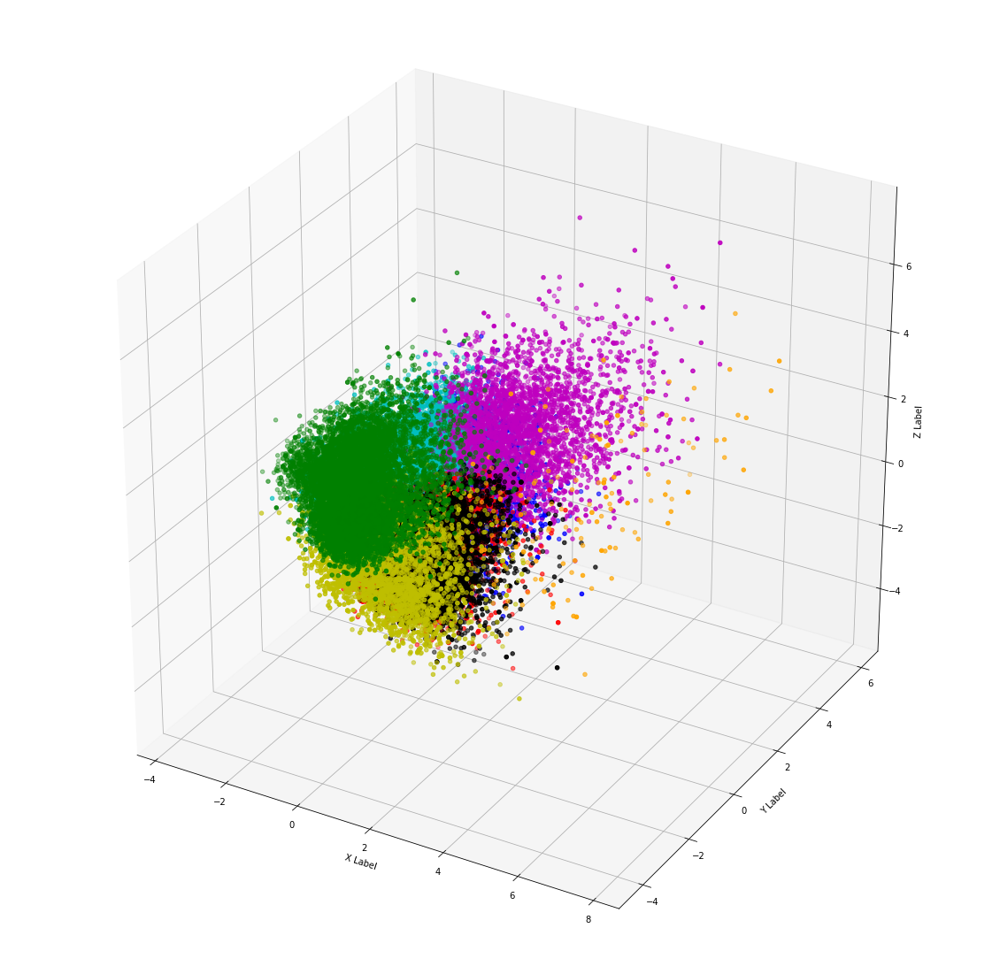

In [ ]:
colours = ["r","b","g","y","m","k","c","orange"]
cluster_labels = kmeans_results_df['clusters8'].value_counts().sort_index().index.tolist()

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')

for i in range(len(cluster_labels)):
  ax.scatter(
      kmeans_results_df.loc[kmeans_results_df.clusters8 == cluster_labels[i]]['pca3_3'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters8 == cluster_labels[i]]['pca3_1'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters8 == cluster_labels[i]]['pca3_2'].values.tolist(),
      c = colours[i]
  )
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
plt.show()

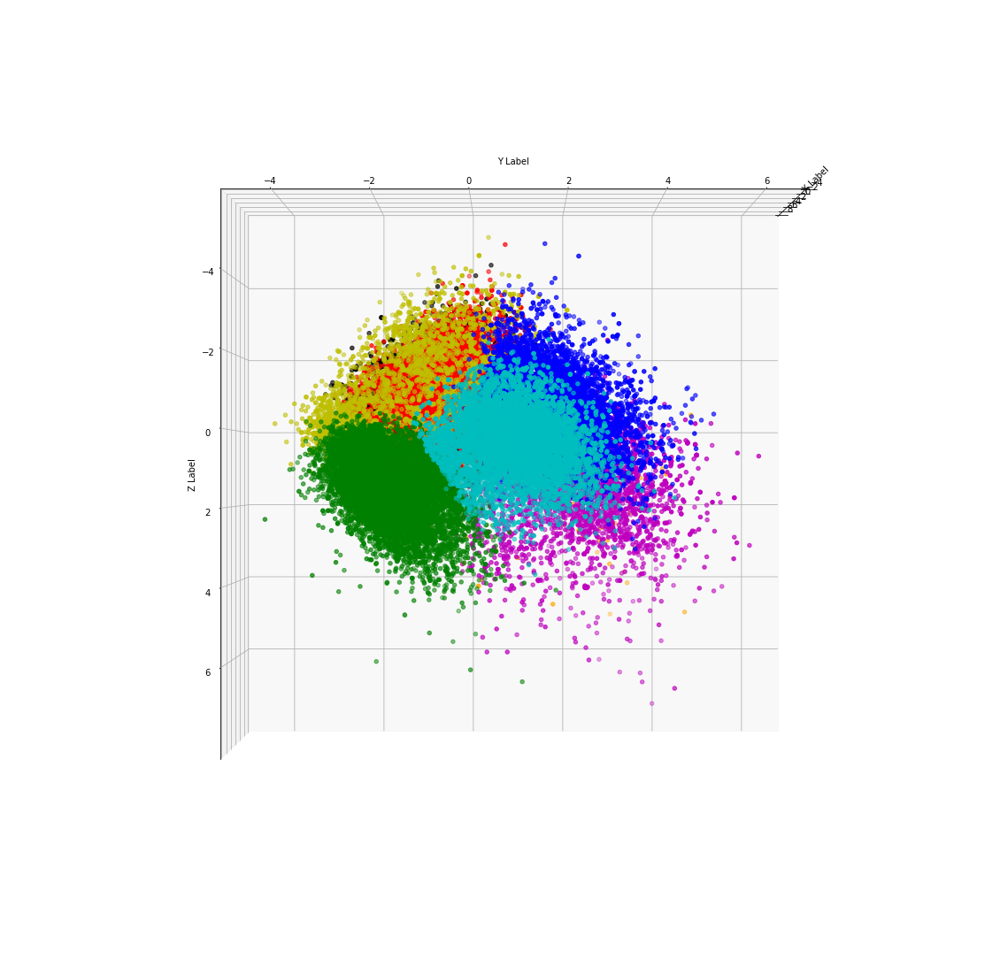

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [ ]:
colours = ["r","b","g","y","m","k","c","orange"]
cluster_labels = kmeans_results_df['clusters8'].value_counts().sort_index().index.tolist()

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')

for i in range(len(cluster_labels)):
  ax.scatter(
      kmeans_results_df.loc[kmeans_results_df.clusters8 == cluster_labels[i]]['pca3_3'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters8 == cluster_labels[i]]['pca3_1'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters8 == cluster_labels[i]]['pca3_2'].values.tolist(),
      c = colours[i]
  )
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

# rotate the axes and update
for angle in range(0, 360):
    ax.view_init(180, angle)
    plt.draw()
    plt.pause(.001)

plt.show()

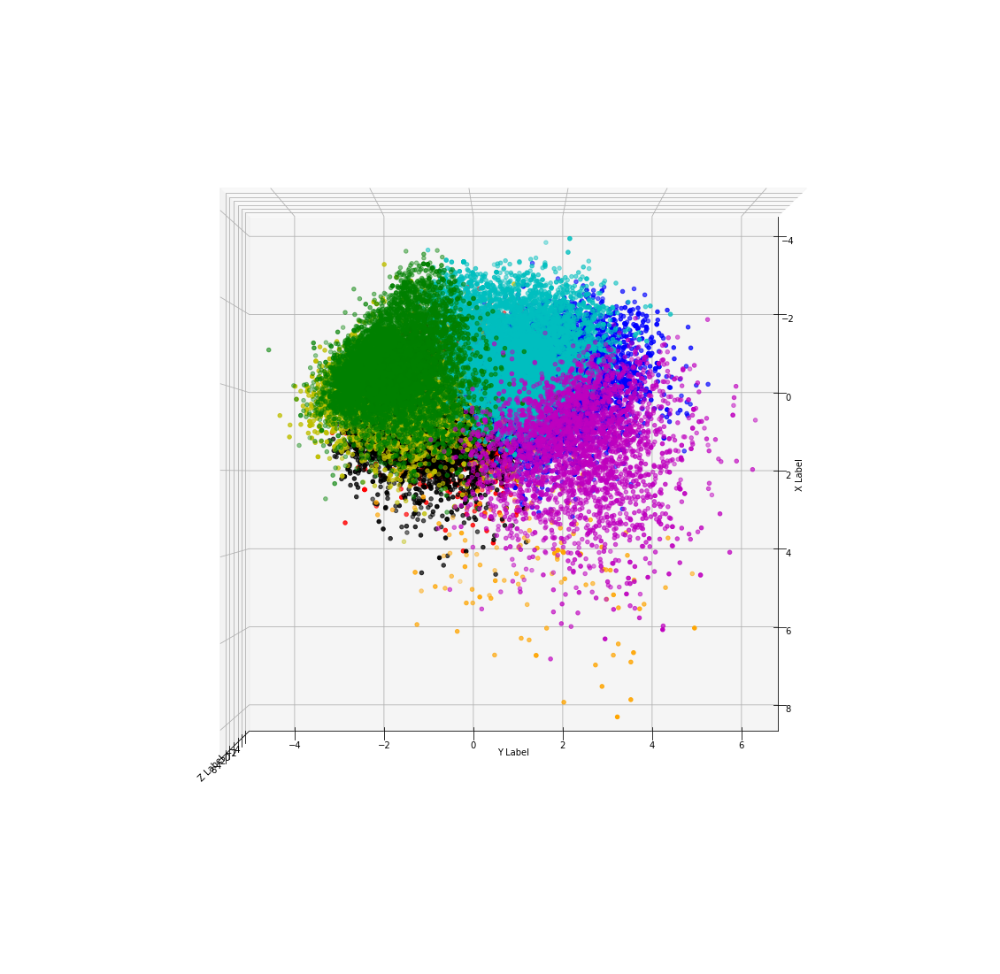

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [ ]:
colours = ["r","b","g","y","m","k","c","orange"]
cluster_labels = kmeans_results_df['clusters8'].value_counts().sort_index().index.tolist()

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')

for i in range(len(cluster_labels)):
  ax.scatter(
      kmeans_results_df.loc[kmeans_results_df.clusters8 == cluster_labels[i]]['pca3_3'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters8 == cluster_labels[i]]['pca3_1'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters8 == cluster_labels[i]]['pca3_2'].values.tolist(),
      c = colours[i]
  )
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

# rotate the axes and update
for angle in range(0, 360):
    ax.view_init(90, angle)
    plt.draw()
    plt.pause(.001)

plt.show()

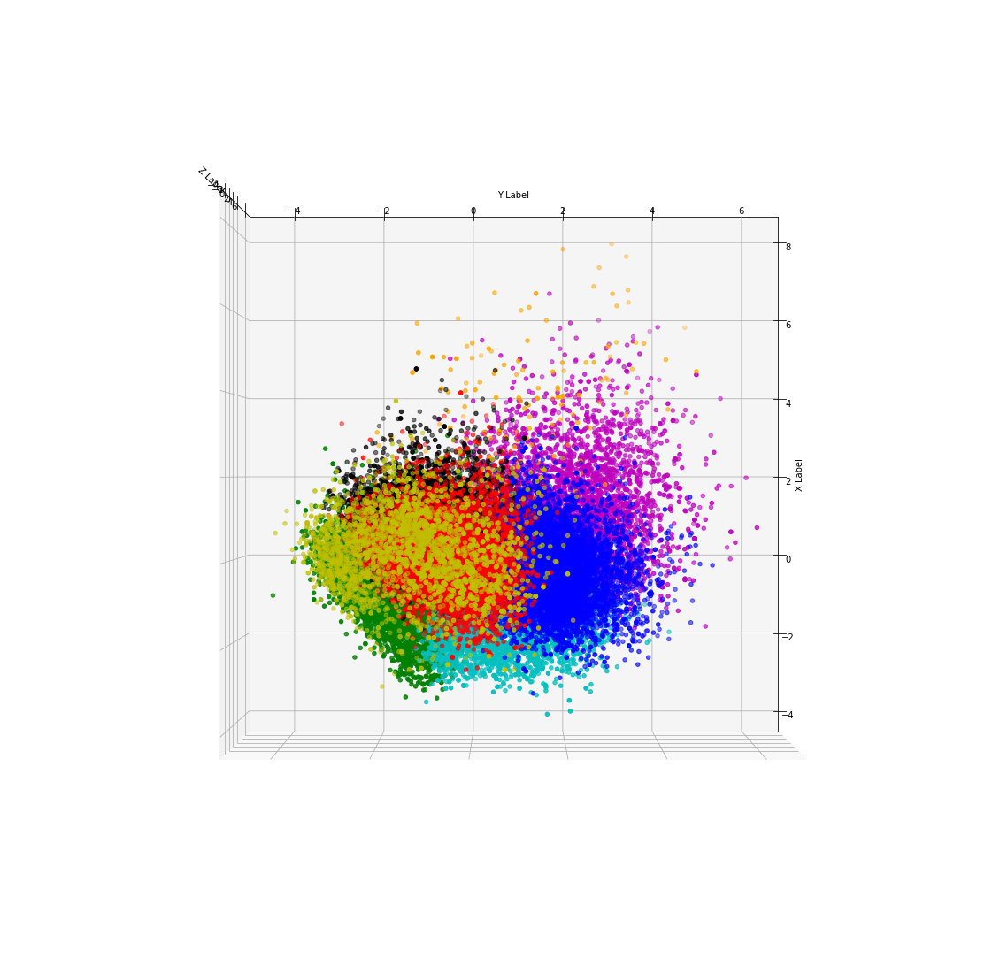

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [ ]:
colours = ["r","b","g","y","m","k","c","orange"]
cluster_labels = kmeans_results_df['clusters8'].value_counts().sort_index().index.tolist()

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')

for i in range(len(cluster_labels)):
  ax.scatter(
      kmeans_results_df.loc[kmeans_results_df.clusters8 == cluster_labels[i]]['pca3_3'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters8 == cluster_labels[i]]['pca3_1'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters8 == cluster_labels[i]]['pca3_2'].values.tolist(),
      c = colours[i]
  )
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

# rotate the axes and update
for angle in range(0, 360):
    ax.view_init(270, angle)
    plt.draw()
    plt.pause(.001)

plt.show()

###### Visualization with UMAP

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future

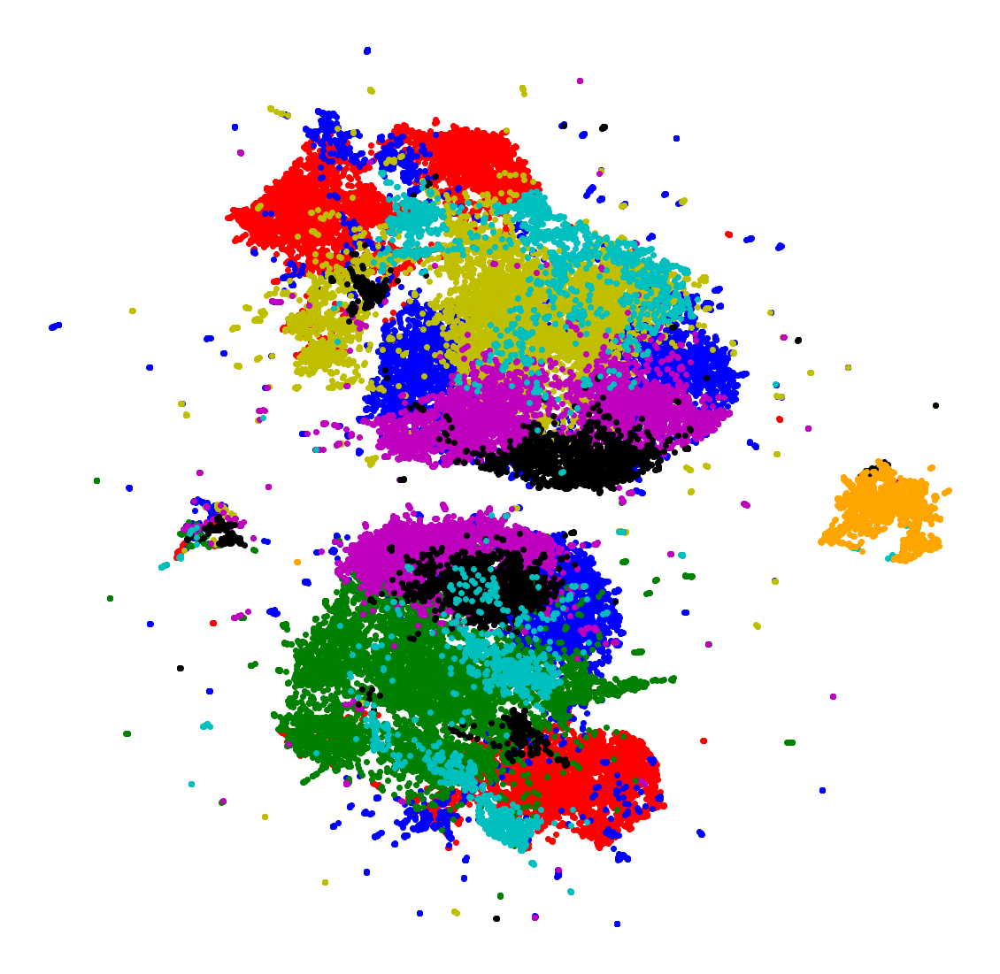

In [ ]:
plt.figure(figsize=(20,20))
colours = ["r","b","g","y","m","k","c","orange"]
cluster_labels = kmeans_results_df['clusters8'].value_counts().index.tolist()
for i in range(len(cluster_labels)):
  plt.subplot(1,1,1)
  plt.scatter(
      kmeans_results_df.loc[kmeans_results_df.clusters8 == cluster_labels[i]]['umap1'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters8 == cluster_labels[i]]['umap2'].values.tolist(),
      c = colours[i]
      )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

###### Visualization with t-SNE

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future

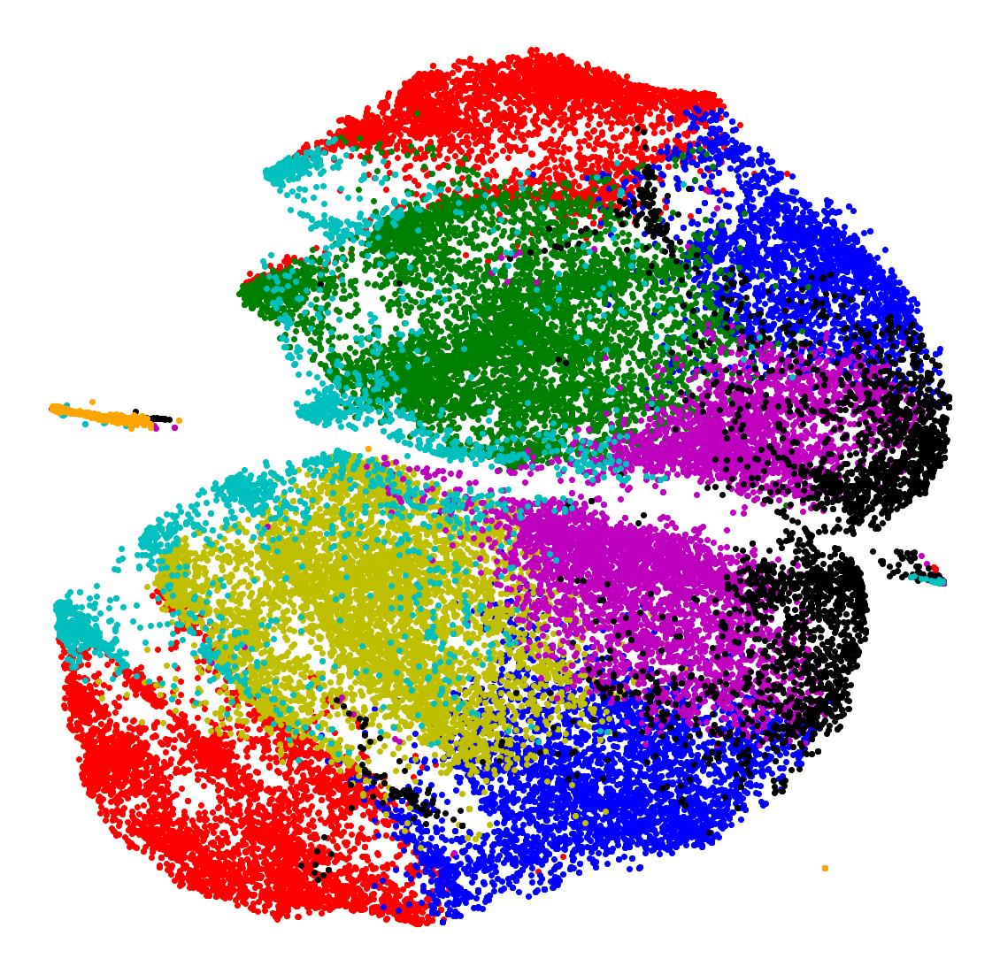

In [ ]:
plt.figure(figsize=(20,20))
colours = ["r","b","g","y","m","k","c","orange"]
cluster_labels = kmeans_results_df['clusters8'].value_counts().index.tolist()
for i in range(len(cluster_labels)):
  plt.subplot(1,1,1)
  plt.scatter(
      kmeans_results_df.loc[kmeans_results_df.clusters8 == cluster_labels[i]]['tsne1'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters8 == cluster_labels[i]]['tsne2'].values.tolist(),
      c = colours[i]
      )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

##### k = 11

###### Running the Model

In [ ]:
kmeans11 = KMeans(n_clusters=11)
kmeans_clusters11 = kmeans11.fit_predict(X)
kmeans_results_df['clusters11'] = kmeans_clusters11
kmeans_results_df['clusters11'].value_counts().sort_index()

0     4750
1     5289
2     5581
3     4216
4     2557
5     2755
6     4901
7     4545
8     1249
9     4003
10    2459
Name: clusters11, dtype: int64

In [ ]:
kmean11_ari = metrics.adjusted_rand_score(y,kmeans_clusters11)
kmean11_sil = metrics.silhouette_score(X,kmeans_clusters11,metric='euclidean')
print('ARI Score: {}\nSilhouette: {}'.format(kmean11_ari,kmean11_sil))

ARI Score: 0.12712383778824207
Silhouette: 0.11308284023004583


###### Visualization with PCA

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future

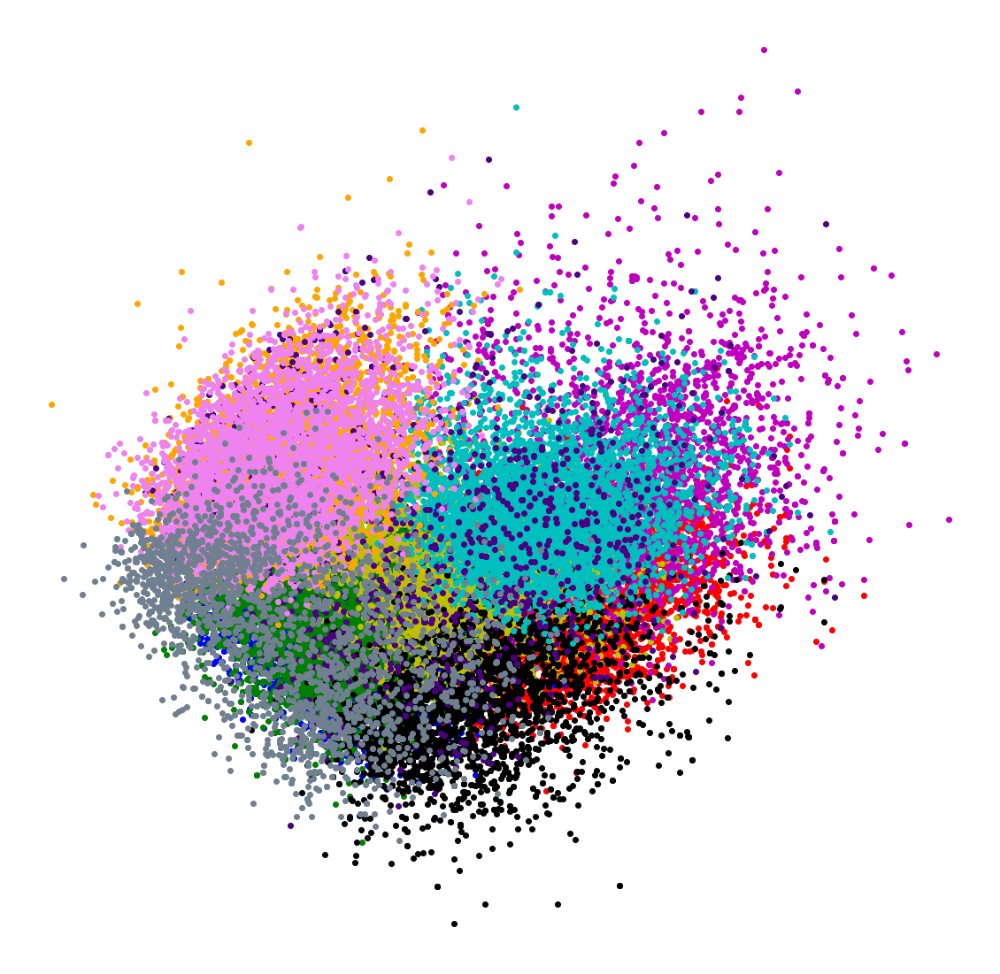

In [ ]:
plt.figure(figsize=(20,20))
colours = ["r","b","g","y","m","k","c","orange",'indigo','violet','slategray']
cluster_labels = kmeans_results_df['clusters11'].value_counts().sort_index().index.tolist()
for i in range(len(cluster_labels)):
  plt.subplot(1,1,1)
  plt.scatter(
      kmeans_results_df.loc[kmeans_results_df.clusters11 == cluster_labels[i]]['pca1'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters11 == cluster_labels[i]]['pca2'].values.tolist(),
      c = colours[i]
      )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

A little messy in 2-D, but let's look at it in 3-D

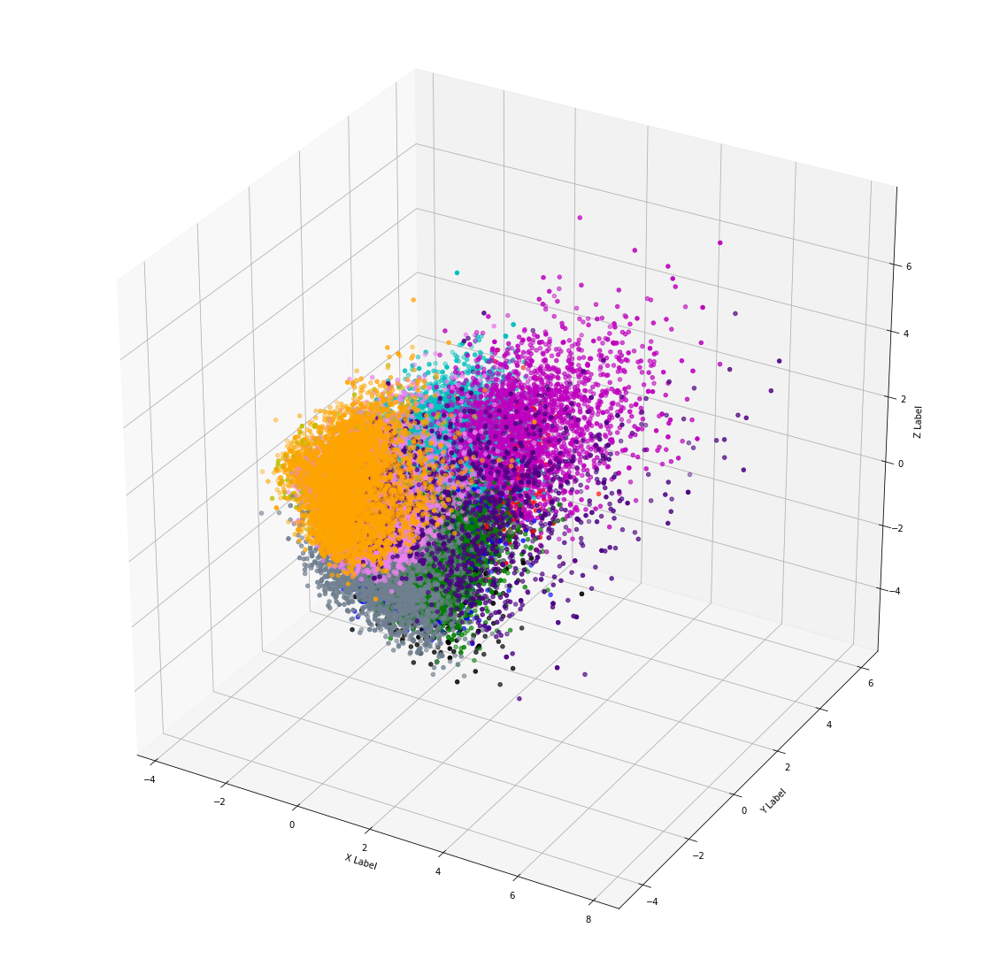

In [ ]:
colours = ["r","b","g","y","m","k","c","orange",'indigo','violet','slategray']
cluster_labels = kmeans_results_df['clusters11'].value_counts().sort_index().index.tolist()

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')

for i in range(len(cluster_labels)):
  ax.scatter(
      kmeans_results_df.loc[kmeans_results_df.clusters11 == cluster_labels[i]]['pca3_3'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters11 == cluster_labels[i]]['pca3_1'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters11 == cluster_labels[i]]['pca3_2'].values.tolist(),
      c = colours[i]
  )
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
plt.show()

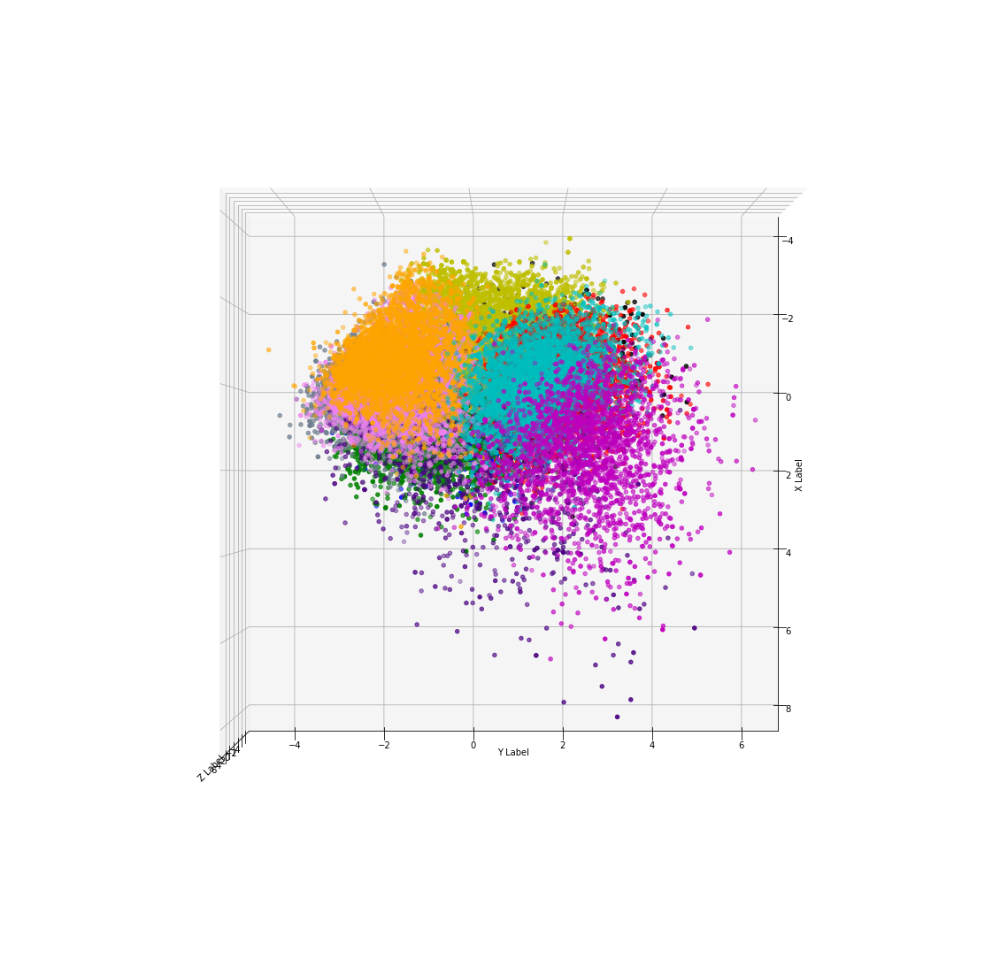

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [ ]:
colours = ["r","b","g","y","m","k","c","orange",'indigo','violet','slategray']
cluster_labels = kmeans_results_df['clusters11'].value_counts().sort_index().index.tolist()

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')

for i in range(len(cluster_labels)):
  ax.scatter(
      kmeans_results_df.loc[kmeans_results_df.clusters11 == cluster_labels[i]]['pca3_3'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters11 == cluster_labels[i]]['pca3_1'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters11 == cluster_labels[i]]['pca3_2'].values.tolist(),
      c = colours[i]
  )
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

# rotate the axes and update
for angle in range(0, 360):
    ax.view_init(90, angle)
    plt.draw()
    plt.pause(.001)

plt.show()

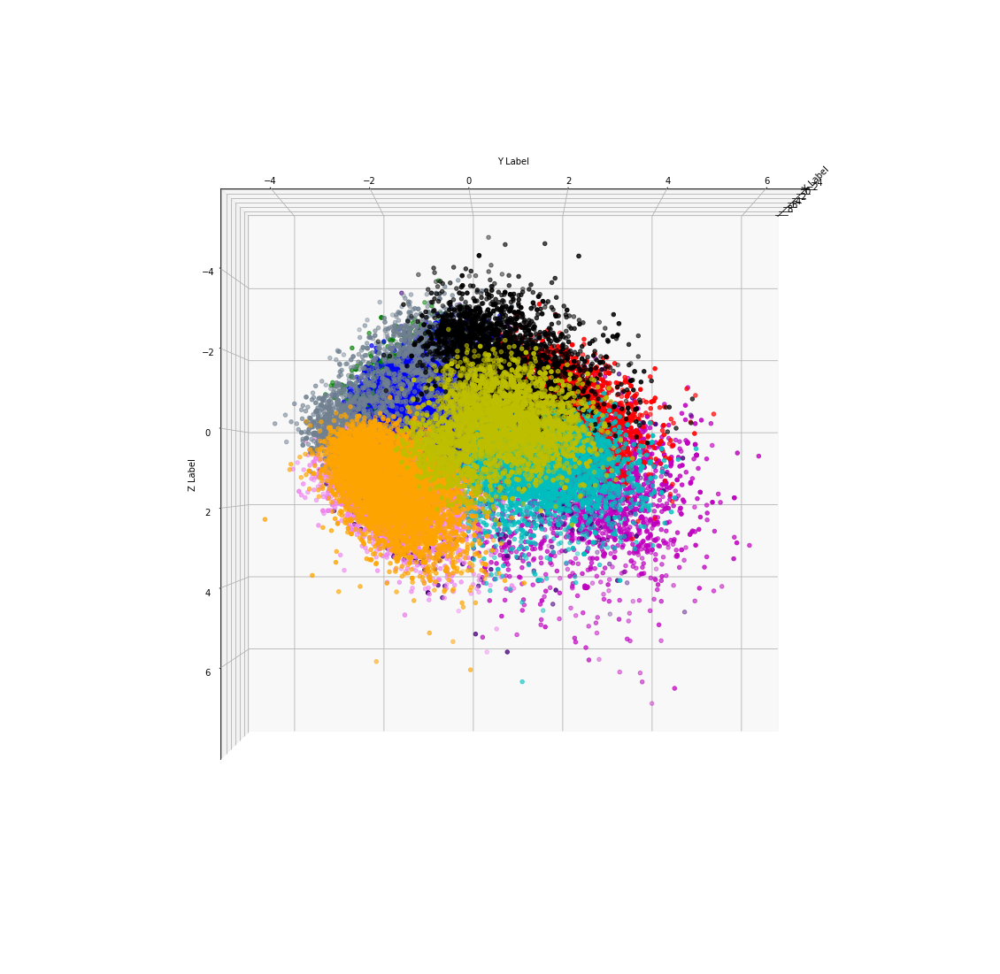

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [ ]:
colours = ["r","b","g","y","m","k","c","orange",'indigo','violet','slategray']
cluster_labels = kmeans_results_df['clusters11'].value_counts().sort_index().index.tolist()

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')

for i in range(len(cluster_labels)):
  ax.scatter(
      kmeans_results_df.loc[kmeans_results_df.clusters11 == cluster_labels[i]]['pca3_3'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters11 == cluster_labels[i]]['pca3_1'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters11 == cluster_labels[i]]['pca3_2'].values.tolist(),
      c = colours[i]
  )
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

# rotate the axes and update
for angle in range(0, 360):
    ax.view_init(180, angle)
    plt.draw()
    plt.pause(.001)

plt.show()

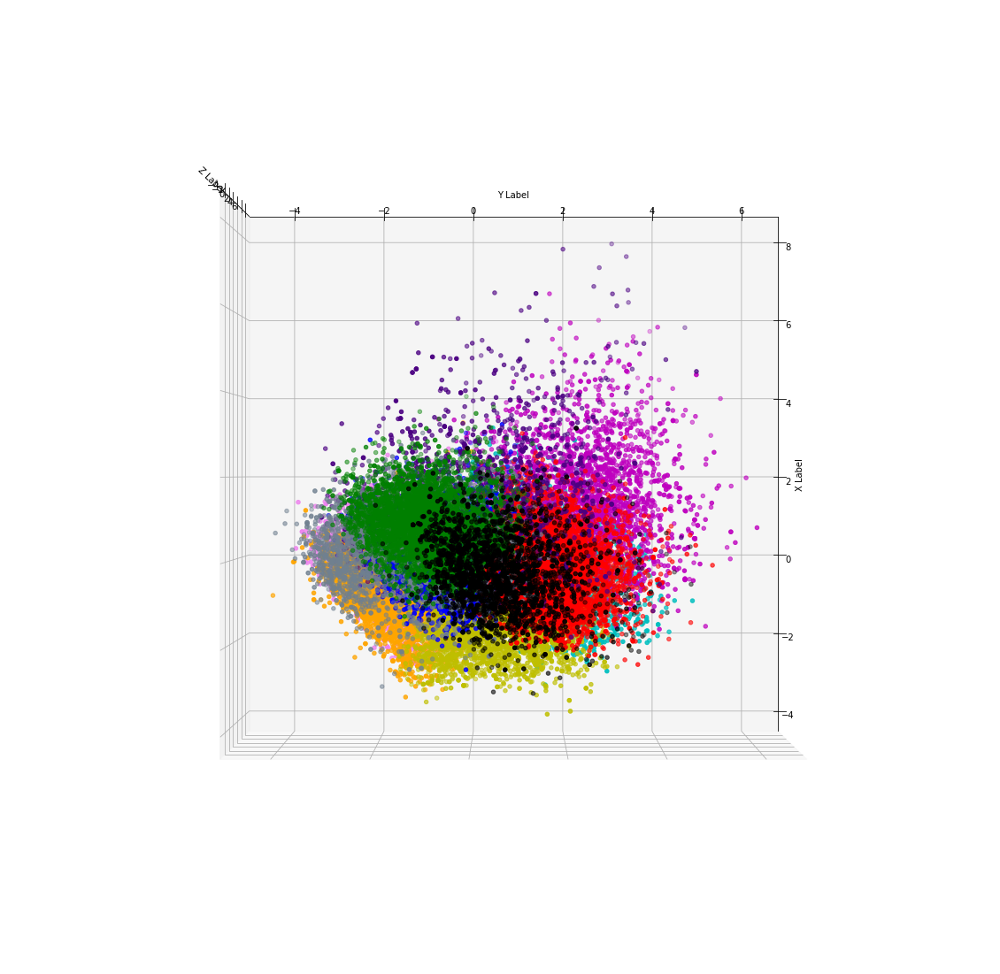

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [ ]:
colours = ["r","b","g","y","m","k","c","orange",'indigo','violet','slategray']
cluster_labels = kmeans_results_df['clusters11'].value_counts().sort_index().index.tolist()

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')

for i in range(len(cluster_labels)):
  ax.scatter(
      kmeans_results_df.loc[kmeans_results_df.clusters11 == cluster_labels[i]]['pca3_3'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters11 == cluster_labels[i]]['pca3_1'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters11 == cluster_labels[i]]['pca3_2'].values.tolist(),
      c = colours[i]
  )
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

# rotate the axes and update
for angle in range(0, 360):
    ax.view_init(270, angle)
    plt.draw()
    plt.pause(.001)

plt.show()

###### Visualization with UMAP

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future

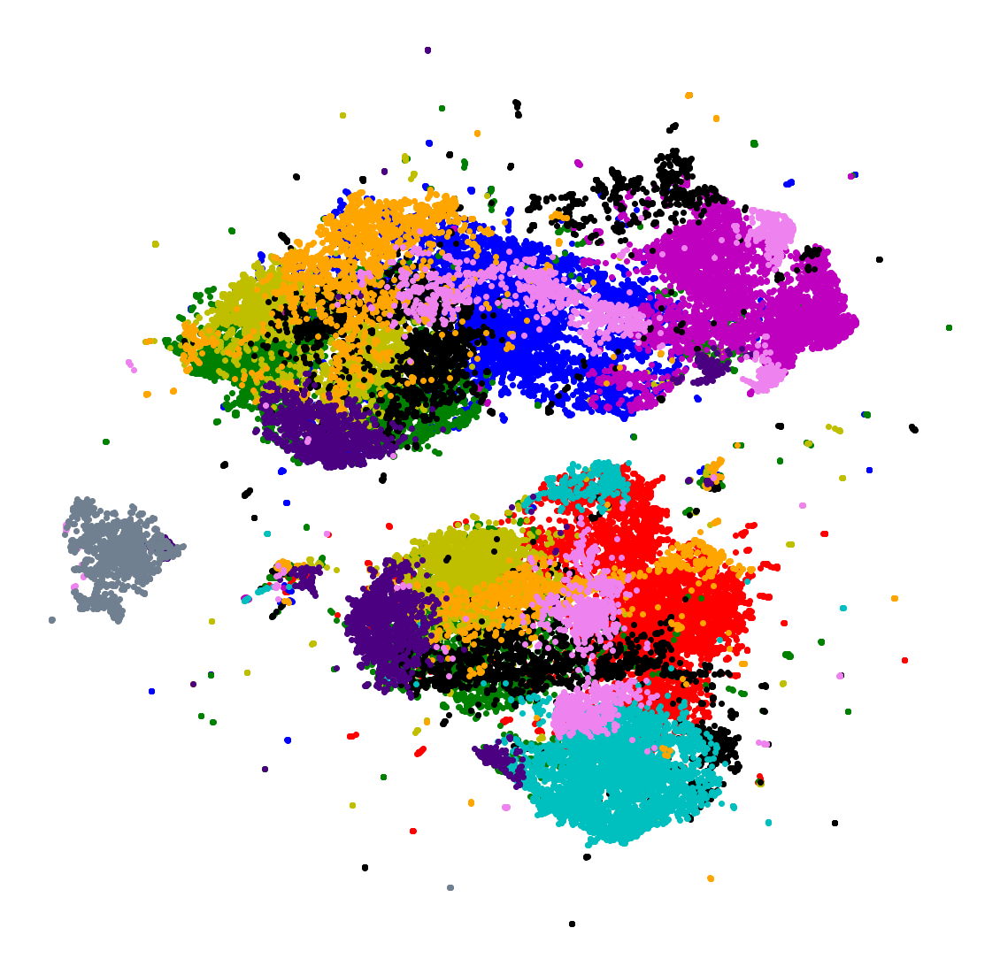

In [ ]:
plt.figure(figsize=(20,20))
colours = ["r","b","g","y","m","k","c","orange",'indigo','violet','slategray']
cluster_labels = kmeans_results_df['clusters11'].value_counts().index.tolist()
for i in range(len(cluster_labels)):
  plt.subplot(1,1,1)
  plt.scatter(
      kmeans_results_df.loc[kmeans_results_df.clusters11 == cluster_labels[i]]['umap1'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters11 == cluster_labels[i]]['umap2'].values.tolist(),
      c = colours[i]
      )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

###### Visualization with t-SNE

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future

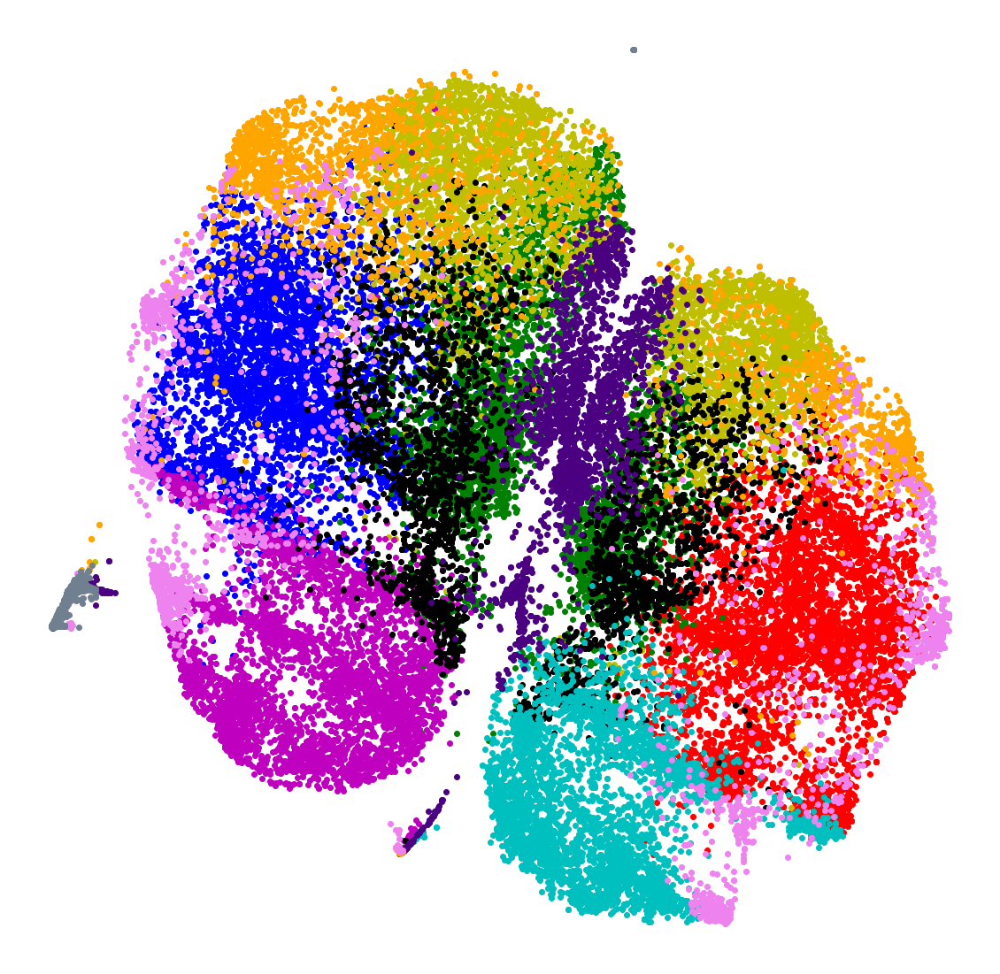

In [ ]:
plt.figure(figsize=(20,20))
colours = ["r","b","g","y","m","k","c","orange",'indigo','violet','slategray']
cluster_labels = kmeans_results_df['clusters11'].value_counts().index.tolist()
for i in range(len(cluster_labels)):
  plt.subplot(1,1,1)
  plt.scatter(
      kmeans_results_df.loc[kmeans_results_df.clusters11 == cluster_labels[i]]['tsne1'].values.tolist(),
      kmeans_results_df.loc[kmeans_results_df.clusters11 == cluster_labels[i]]['tsne2'].values.tolist(),
      c = colours[i]
      )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

And interestingly, UMAP And t-SNE are still producing clusters that the sides mirror one another.

#### Comparing Best K-means Results

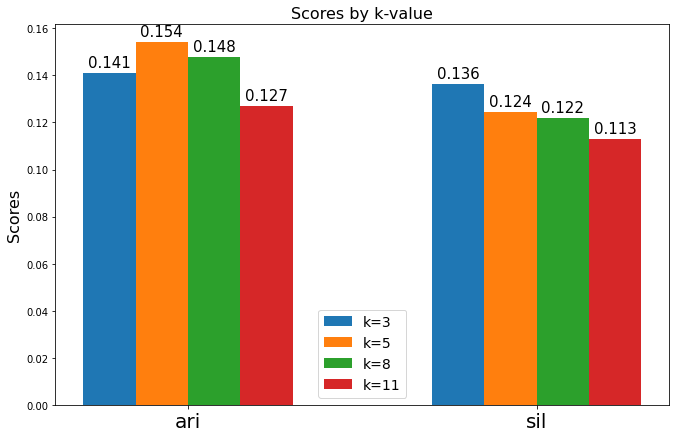

In [ ]:
labels = ['ari','sil']
kmeans3= [kmean3_ari,kmean3_sil]
kmeans5 = [kmean5_ari,kmean5_sil]
kmeans8 = [kmean8_ari,kmean8_sil]
kmeans11 = [kmean11_ari,kmean11_sil]

x = np.arange((len(labels)))
width = 0.15

fig, ax = plt.subplots(figsize=(11,7))
rects1 = ax.bar(x-width*1.5,kmeans3, width, label='k=3')
rects2 = ax.bar(x-width*.5,kmeans5, width, label='k=5')
rects3 = ax.bar(x+width*.5,kmeans8,width,label='k=8')
rects4 = ax.bar(x+width*1.5,kmeans11,width,label='k=11')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores',fontsize=16)
ax.set_title('Scores by k-value',fontsize=16)
ax.set_xticks(x)
ax.set_xticklabels(labels,fontsize=20)
ax.legend()

def autolabel(rects):
  for rect in rects:
    height = rect.get_height()
    ax.annotate('{}'.format(round(height,3)),
                xy=(rect.get_x() + rect.get_width() /2,height),
                xytext = (0,3), # 3 points vertical offset
                fontsize=15,
                textcoords = 'offset points',
                ha='center',va='bottom')

autolabel(rects1)
autolabel(rects2)
autolabel(rects3)
autolabel(rects4)
plt.legend(['k=3','k=5','k=8','k=11'],fontsize=14)

plt.show()

##### Best K-Means Model

Considering we are putting more weight on the Silhouette score for these models, as described above during the exploratory data analysis, the best model is the model that uses 3 clusters.

In [ ]:
kmeans_bestari = kmean3_ari
kmeans_bestsil = kmean3_sil

### DBSCAN

#### Finding ARIs and Silhouette Scores for Values of 'eps' and 'min_samples'

In [ ]:
etas = [.01,.05,.1,.2,.5,1.0,1.5,2.0,3.0]
minpts = np.arange(1,10,1)
eta_list = []
minpt_list = []
aris_db = []
sils_db = []
for eta in etas:
  for minpt in minpts:
    print('-'*40)
    print('eta: {}'.format(eta))
    print('minpt: {}'.format(minpt))
    print('-'*20)
    clusters = DBSCAN(eps = eta, min_samples = minpt).fit_predict(X)
    ari = metrics.adjusted_rand_score(y,clusters)
    sil = metrics.silhouette_score(X,clusters)
    eta_list.append(eta)
    minpt_list.append(minpt)
    aris_db.append(ari)
    sils_db.append(sil)
    print('ARI: {}\nSil: {}'.format(ari,sil))    

----------------------------------------
eta: 0.01
minpt: 1
--------------------
ARI: 0.00014268492158637703
Sil: 0.29818203608185373
----------------------------------------
eta: 0.01
minpt: 2
--------------------
ARI: 0.0006069082748713732
Sil: -0.21759229967490162
----------------------------------------
eta: 0.01
minpt: 3
--------------------
ARI: -0.0001305432915836421
Sil: -0.49436936822980815
----------------------------------------
eta: 0.01
minpt: 4
--------------------
ARI: 0.00030895076266832774
Sil: -0.5472848843934875
----------------------------------------
eta: 0.01
minpt: 5
--------------------
ARI: 0.00026788707349434886
Sil: -0.5127346446775995
----------------------------------------
eta: 0.01
minpt: 6
--------------------
ARI: 0.00014031342288194597
Sil: -0.4548195749155024
----------------------------------------
eta: 0.01
minpt: 7
--------------------
ARI: 5.884255474974422e-05
Sil: -0.3518747031909557
----------------------------------------
eta: 0.01
minpt: 8
--

##### Saving Results as Local Variables

In [ ]:
eta_list = [0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.2,
 0.2,
 0.2,
 0.2,
 0.2,
 0.2,
 0.2,
 0.2,
 0.2,
 0.5,
 0.5,
 0.5,
 0.5,
 0.5,
 0.5,
 0.5,
 0.5,
 0.5,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.5,
 1.5,
 1.5,
 1.5,
 1.5,
 1.5,
 1.5,
 1.5,
 1.5,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0]

In [ ]:
minpt_list = [1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9]

In [ ]:
aris_db = [0.00014268492158637703,
 0.0006069082748713732,
 -0.0001305432915836421,
 0.00030895076266832774,
 0.00026788707349434886,
 0.00014031342288194597,
 5.884255474974422e-05,
 3.90989026780098e-05,
 2.420728026812864e-05,
 0.00014544202453231628,
 0.000510038248631634,
 -0.00021993207453858466,
 0.00028520065430319506,
 0.0002717733621751357,
 0.00013746060237835466,
 5.562890612817511e-05,
 5.061808398466272e-05,
 3.534858849619212e-05,
 0.00014751667799323153,
 0.00046520054076660286,
 -0.00033889977804025314,
 0.00019024451225610855,
 0.00025468559198412545,
 0.0001326437267966967,
 5.562890612817511e-05,
 5.061808398466272e-05,
 3.534858849619212e-05,
 0.00015141733030400495,
 0.000761459520054197,
 -0.0003548787923719765,
 0.00016238366117738302,
 0.0002574706779506009,
 0.0001317204891917467,
 5.562890612817511e-05,
 5.061808398466272e-05,
 3.534858849619212e-05,
 0.0002666657205101786,
 0.0021504756448239653,
 0.0004251678197596139,
 0.0007145432782765431,
 0.0006175005657005057,
 0.00044563748035142853,
 0.0002462451786952529,
 0.00014968412443431387,
 8.01990221010348e-05,
 0.021189934534914894,
 0.031355765018840645,
 0.034667239443121584,
 0.03753869448145166,
 0.03961078620404319,
 0.039953498738032854,
 0.03948606648827492,
 0.039053734796501975,
 0.03826802689160891,
 0.0028178776223341407,
 0.004154911966173317,
 0.005157820254289255,
 0.006008413033148531,
 0.00674543444736264,
 0.007345256529766954,
 0.007751078361767551,
 0.008123344678692865,
 0.00868559969981917,
 0.003470268337779223,
 0.0035945524469285276,
 0.003689204676667635,
 0.0037736964062279753,
 0.003822408214650336,
 0.003872506681931222,
 0.00388085213325702,
 0.003918647833522373,
 0.0039292766908902085,
 -0.0001155927357125966,
 -0.00011522043780167032,
 -0.00011502171704994063,
 -0.00011080191945743754,
 -0.00011161836873745347,
 -0.00011569594097650353,
 -0.0001156657282395727,
 -0.00011454448845360485,
 -0.00010991916446535014]

In [ ]:
sils_db = [0.29818203608185373,
 -0.21759229967490162,
 -0.49436936822980815,
 -0.5472848843934875,
 -0.5127346446775995,
 -0.4548195749155024,
 -0.3518747031909557,
 -0.3034653861013176,
 -0.22339237345825624,
 0.3012444492197878,
 -0.2121314388167416,
 -0.49178677639925283,
 -0.5475379229472851,
 -0.5121971652928274,
 -0.45452431328659204,
 -0.3535786639908497,
 -0.3071654921239447,
 -0.23281753621969045,
 0.3043525051711076,
 -0.20642558769722436,
 -0.4887890242465898,
 -0.5463338553136489,
 -0.5137911893784334,
 -0.456991862839535,
 -0.3535786639908497,
 -0.3071654921239447,
 -0.23281753621969045,
 0.30977466309452295,
 -0.1957680222009671,
 -0.4828123148946911,
 -0.5446001175743443,
 -0.5186638964995388,
 -0.46154654697972836,
 -0.3535786639908497,
 -0.3071654921239447,
 -0.23281753621969045,
 0.31343822593865905,
 -0.16062276282610866,
 -0.45470552603574454,
 -0.5395859947754558,
 -0.5352349716046757,
 -0.5019439624319636,
 -0.43348611744542687,
 -0.39102011356019123,
 -0.3380129260776732,
 -0.11845652565384385,
 -0.2967093536607079,
 -0.42404136437309775,
 -0.4675022884475286,
 -0.4600548397423646,
 -0.4505589550526587,
 -0.4388903754875594,
 -0.4235899414085654,
 -0.39611928509405925,
 -0.3943745163725353,
 -0.35204092311826013,
 -0.3086793493420015,
 -0.27412759721049906,
 -0.22012292648452778,
 -0.15424884997039667,
 -0.10763041977214327,
 -0.06237779571715533,
 -0.034849298951669334,
 -0.2609151861034009,
 -0.15054623676137993,
 -0.08472184076774407,
 -0.016709758087478103,
 0.01544140849009384,
 0.04411622597065272,
 0.05478420425969289,
 0.04824046507759007,
 0.05444818937980653,
 0.10698223604025259,
 0.15716507160138654,
 0.22816185712295067,
 0.2326888259626578,
 0.23112562116522237,
 0.2213470460175163,
 0.2204927951210885,
 0.2258591397394368,
 0.2266550622575228]

In [ ]:
dbscan_results_df = pd.DataFrame({'eps':eta_list,'minpts':minpt_list,'aris':aris_db,'sils':sils_db})
dbscan_results_df

,eps,minpts,aris,sils
0,0.01,1,0.000143,0.298182
1,0.01,2,0.000607,-0.217592
2,0.01,3,-0.000131,-0.494369
3,0.01,4,0.000309,-0.547285
4,0.01,5,0.000268,-0.512735
...,...,...,...,...
76,3.00,5,-0.000112,0.231126
77,3.00,6,-0.000116,0.221347
78,3.00,7,-0.000116,0.220493
79,3.00,8,-0.000115,0.225859


#### Visualizing the results of Search for DBSCAN Hyperparameters

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future

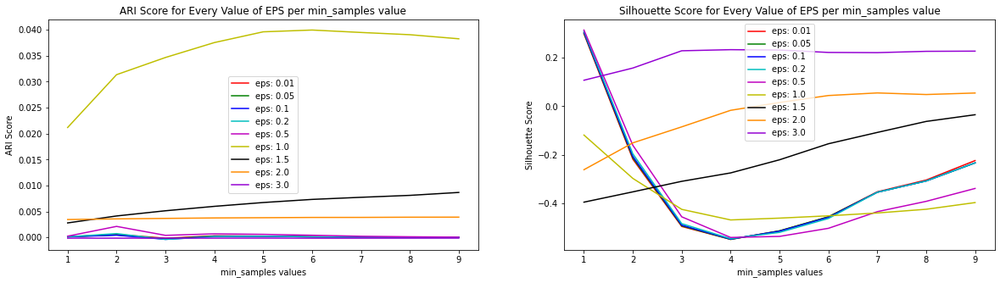

In [ ]:
colours = ['r','g','b','c','m','y','k','darkorange','darkviolet']
plt.figure(figsize=(20,5))
plt.subplot(1,2,1)
for i in range(len(etas)):
  plt.subplot(1,2,1)
  plt.plot(
      dbscan_results_df.loc[dbscan_results_df['eps'] == etas[i],'minpts'].values.tolist(),
      dbscan_results_df.loc[dbscan_results_df['eps'] == etas[i],'aris'].values.tolist(),
      color = colours[i],
      label = 'eps: {}'.format(etas[i]))
plt.xlabel('min_samples values')
plt.ylabel('ARI Score')
plt.title('ARI Score for Every Value of EPS per min_samples value')
plt.legend()
plt.subplot(1,2,2)
for i in range(len(etas)):
  plt.subplot(1,2,2)
  plt.plot(
      dbscan_results_df.loc[dbscan_results_df['eps'] == etas[i],'minpts'].values.tolist(),
      dbscan_results_df.loc[dbscan_results_df['eps'] == etas[i],'sils'].values.tolist(),
      color = colours[i],
      label = 'eps: {}'.format(etas[i]))
plt.xlabel('min_samples values')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Every Value of EPS per min_samples value')
plt.legend()
plt.show()

The ARI is pathetically low. The silhouette score is clearly much higher at lower min_samples values but it doess appear to go up as min_samples values gets larger. We'll investigate further.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future

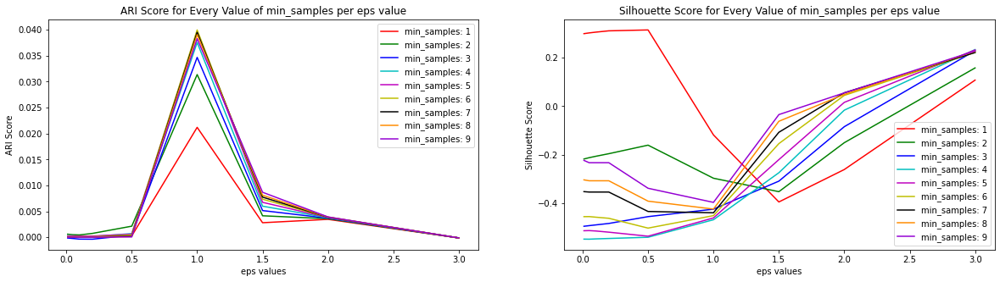

In [ ]:
colours = ['r','g','b','c','m','y','k','darkorange','darkviolet']
plt.figure(figsize=(20,5))
plt.subplot(1,2,1)
for i in range(len(minpts)):
  plt.subplot(1,2,1)
  plt.plot(
      dbscan_results_df.loc[dbscan_results_df['minpts'] == minpts[i],'eps'].values.tolist(),
      dbscan_results_df.loc[dbscan_results_df['minpts'] == minpts[i],'aris'].values.tolist(),
      color = colours[i],
      label = 'min_samples: {}'.format(minpts[i]))
plt.xlabel('eps values')
plt.ylabel('ARI Score')
plt.title('ARI Score for Every Value of min_samples per eps value')
plt.legend()
plt.subplot(1,2,2)
for i in range(len(minpts)):
  plt.subplot(1,2,2)
  plt.plot(
      dbscan_results_df.loc[dbscan_results_df['minpts'] == minpts[i],'eps'].values.tolist(),
      dbscan_results_df.loc[dbscan_results_df['minpts'] == minpts[i],'sils'].values.tolist(),
      color = colours[i],
      label = 'min_samples: {}'.format(minpts[i]))
plt.xlabel('eps values')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Every Value of min_samples per eps value')
plt.legend()
plt.show()

WOW! It appears that while the ARI spikes at really ONLY eps=1, and it's still pitifully low, the Silhouette score goes up significantly at higher levels of the eps value. We'll investigate further as well. 

In [ ]:
dbscan_results_df.loc[dbscan_results_df.sils == max(dbscan_results_df['sils'])]

,eps,minpts,aris,sils
36,0.5,1,0.000267,0.313438


The highest silhouette score is at this value. 

In [ ]:
best_dbscan_sils = dbscan_results_df.loc[dbscan_results_df.sils > .2].sort_values(by='sils',ascending=False)

In [ ]:
best_dbscan_sils

,eps,minpts,aris,sils
36,0.50,1,0.000267,0.313438
27,0.20,1,0.000151,0.309775
18,0.10,1,0.000148,0.304353
9,0.05,1,0.000145,0.301244
0,0.01,1,0.000143,0.298182
75,3.00,4,-0.000111,0.232689
76,3.00,5,-0.000112,0.231126
74,3.00,3,-0.000115,0.228162
80,3.00,9,-0.000110,0.226655
79,3.00,8,-0.000115,0.225859


In [ ]:
best_eps = []
best_minpts = []
for i in range(len(best_dbscan_sils)):
  best_eps.append(best_dbscan_sils['eps'].values[i])
  best_minpts.append(best_dbscan_sils['minpts'].values[i])

These results do seem promising, let's look at the number of clusters they produced 

#### Finding Number of Clusters

In [ ]:
cluster_number = []
sils_best = []
for i in range(len(best_dbscan_sils)):
  dbscan_best2 = DBSCAN(eps= best_eps[i],min_samples= best_minpts[i])
  clusters_best2 = dbscan_best2.fit_predict(X)
  sil = metrics.silhouette_score(X,clusters_best2)
  sils_best.append(sil)
  cluster_number.append(len(np.unique(clusters_best2)))
  print('Iteration {} of {}'.format(i+1,len(best_dbscan_sils)))
  print('-'*40)
  print('Silhouette Score: {}\nNumber of Clusters: {}'.format(sil,len(np.unique(clusters_best2))))

Iteration 1 of 12
----------------------------------------
Silhouette Score: 0.31343822593865905
Number of Clusters: 33545
Iteration 2 of 12
----------------------------------------
Silhouette Score: 0.30977466309452295
Number of Clusters: 34659
Iteration 3 of 12
----------------------------------------
Silhouette Score: 0.3043525051711076
Number of Clusters: 34853
Iteration 4 of 12
----------------------------------------
Silhouette Score: 0.3012444492197878
Number of Clusters: 34952
Iteration 5 of 12
----------------------------------------
Silhouette Score: 0.29818203608185373
Number of Clusters: 35042
Iteration 6 of 12
----------------------------------------
Silhouette Score: 0.2326888259626578
Number of Clusters: 5
Iteration 7 of 12
----------------------------------------
Silhouette Score: 0.23112562116522237
Number of Clusters: 5
Iteration 8 of 12
----------------------------------------
Silhouette Score: 0.22816185712295067
Number of Clusters: 7
Iteration 9 of 12
-------------

Looks like the clusters numbers start unreasonably hight and go down to more reasonable numbers at higher values of eps and min_pts. 

##### Saving Results to Local Variables 

In [ ]:
cluster_number = [33545, 34659, 34853, 34952, 35042, 5, 5, 7, 5, 7, 7, 8]

In [ ]:
sils_best = [0.31343822593865905,
 0.30977466309452295,
 0.3043525051711076,
 0.3012444492197878,
 0.29818203608185373,
 0.2326888259626578,
 0.23112562116522237,
 0.22816185712295067,
 0.2266550622575228,
 0.2258591397394368,
 0.2213470460175163,
 0.2204927951210885]

In [ ]:
best_eps = [0.5, 0.2, 0.1, 0.05, 0.01, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0]

In [ ]:
best_minpts = [1, 1, 1, 1, 1, 4, 5, 3, 9, 8, 6, 7]

#### Fine Tuning Search for HyperParameters

It'd be interesting to search higher values of eps and min_pts to see if we can get the Silhouette score to go up even more. 

##### For Loop to check all possible combinations of eps and min_pt values 

Next step involves examining eps values of 3.0 and higher, combined with any values of minpts that are 3 or higher in order to get a normal level of cluster values.

In [ ]:
etas2 = [3.0,3.5,4.0,4.5,5.0,6.0]
minpts2 = np.arange(3,13,1)
eta_list2 = []
minpt_list2 = []
aris_db2 = []
sils_db2 = []
cluster_number2 = []
for eta in etas2:
  for minpt in minpts2:
    print('-'*40)
    print('eta: {}'.format(eta))
    print('minpt: {}'.format(minpt))
    print('-'*20)
    clusters2 = DBSCAN(eps = eta, min_samples = minpt).fit_predict(X)
    ari2 = metrics.adjusted_rand_score(y,clusters2)
    sil2 = metrics.silhouette_score(X,clusters2)
    eta_list2.append(eta)
    minpt_list2.append(minpt)
    aris_db2.append(ari2)
    sils_db2.append(sil2)
    cluster_number2.append(len(np.unique(clusters2)))
    print('ARI: {}\nSil: {}\nNumber of Clusters:{}'.format(ari2,sil2,len(np.unique(clusters2))))    

----------------------------------------
eta: 3.0
minpt: 3
--------------------
ARI: -0.00011502171704994063
Sil: 0.22816185712295067
Number of Clusters:7
----------------------------------------
eta: 3.0
minpt: 4
--------------------
ARI: -0.00011080191945743754
Sil: 0.2326888259626578
Number of Clusters:5
----------------------------------------
eta: 3.0
minpt: 5
--------------------
ARI: -0.00011161836873745347
Sil: 0.23112562116522237
Number of Clusters:5
----------------------------------------
eta: 3.0
minpt: 6
--------------------
ARI: -0.00011569594097650353
Sil: 0.2213470460175163
Number of Clusters:7
----------------------------------------
eta: 3.0
minpt: 7
--------------------
ARI: -0.0001156657282395727
Sil: 0.2204927951210885
Number of Clusters:8
----------------------------------------
eta: 3.0
minpt: 8
--------------------
ARI: -0.00011454448845360485
Sil: 0.2258591397394368
Number of Clusters:7
----------------------------------------
eta: 3.0
minpt: 9
----------------

##### Saving Results to Local Variables

In [ ]:
aris_db2 = [-0.00011502171704994063,
 -0.00011080191945743754,
 -0.00011161836873745347,
 -0.00011569594097650353,
 -0.0001156657282395727,
 -0.00011454448845360485,
 -0.00010991916446535014,
 -0.0001159396474874432,
 -0.00011585567480447282,
 -0.0001160838101572972,
 -9.588253371154996e-05,
 -9.609112097437773e-05,
 -9.64940160353677e-05,
 -9.64940160353677e-05,
 -9.717740420620919e-05,
 -9.733856212102155e-05,
 -9.761187879337279e-05,
 -9.788839557355173e-05,
 -9.363891298912058e-05,
 -9.363891298912058e-05,
 -6.910264169055489e-05,
 -6.910264169055489e-05,
 -6.910264169055489e-05,
 -6.910264169055489e-05,
 -6.910264169055489e-05,
 -6.910264169055489e-05,
 -6.910264169055489e-05,
 -6.910264169055489e-05,
 -6.910264169055489e-05,
 -6.238708419545613e-05,
 -6.45314247281119e-05,
 -6.45314247281119e-05,
 -6.45314247281119e-05,
 -6.45314247281119e-05,
 -6.45314247281119e-05,
 -6.45314247281119e-05,
 -6.45314247281119e-05,
 -6.45314247281119e-05,
 -6.45314247281119e-05,
 -6.45314247281119e-05,
 -6.983195368926672e-05,
 -6.983195368926672e-05,
 -6.983195368926672e-05,
 -6.983195368926672e-05,
 -6.983195368926672e-05,
 -6.983195368926672e-05,
 -6.983195368926672e-05,
 -6.983195368926672e-05,
 -6.983195368926672e-05,
 -6.983195368926672e-05,
 -6.700200293274178e-05,
 -6.700200293274178e-05,
 -6.700200293274178e-05,
 -6.700200293274178e-05,
 -6.700200293274178e-05,
 -6.700200293274178e-05,
 -6.700200293274178e-05,
 -6.700200293274178e-05,
 -6.700200293274178e-05,
 -6.700200293274178e-05]

In [ ]:
sils_db2 = [0.22816185712295067,
 0.2326888259626578,
 0.23112562116522237,
 0.2213470460175163,
 0.2204927951210885,
 0.2258591397394368,
 0.2266550622575228,
 0.2249840385615069,
 0.22343577269897288,
 0.22289558566269077,
 0.23905767332770012,
 0.23875239689250513,
 0.23841987629266276,
 0.23841987629266276,
 0.2371478932923886,
 0.2368224091595282,
 0.2361148153152018,
 0.23567736984016013,
 0.2357062832892184,
 0.2357062832892184,
 0.5274019624800823,
 0.5274019624800823,
 0.5274019624800823,
 0.5274019624800823,
 0.5274019624800823,
 0.5274019624800823,
 0.5274019624800823,
 0.5274019624800823,
 0.5274019624800823,
 0.515762445727015,
 0.5306744608207846,
 0.5306744608207846,
 0.5306744608207846,
 0.5306744608207846,
 0.5306744608207846,
 0.5306744608207846,
 0.5306744608207846,
 0.5306744608207846,
 0.5306744608207846,
 0.5306744608207846,
 0.5883131597370316,
 0.5883131597370316,
 0.5883131597370316,
 0.5883131597370316,
 0.5883131597370316,
 0.5883131597370316,
 0.5883131597370316,
 0.5883131597370316,
 0.5883131597370316,
 0.5883131597370316,
 0.6047974605499178,
 0.6047974605499178,
 0.6047974605499178,
 0.6047974605499178,
 0.6047974605499178,
 0.6047974605499178,
 0.6047974605499178,
 0.6047974605499178,
 0.6047974605499178,
 0.6047974605499178]

In [ ]:
eta_list2 = [3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.5,
 3.5,
 3.5,
 3.5,
 3.5,
 3.5,
 3.5,
 3.5,
 3.5,
 3.5,
 4.0,
 4.0,
 4.0,
 4.0,
 4.0,
 4.0,
 4.0,
 4.0,
 4.0,
 4.0,
 4.5,
 4.5,
 4.5,
 4.5,
 4.5,
 4.5,
 4.5,
 4.5,
 4.5,
 4.5,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 6.0,
 6.0,
 6.0,
 6.0,
 6.0,
 6.0,
 6.0,
 6.0,
 6.0,
 6.0]

In [ ]:
minpt_list2 = [3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12]

In [ ]:
cluster_number2 = [7,
 5,
 5,
 7,
 8,
 7,
 5,
 5,
 6,
 6,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3]

In [ ]:
dbscan_results_df2 = pd.DataFrame({'eps':eta_list2,'minpts':minpt_list2,'aris_db2':aris_db2,'sils_db2':sils_db2,'number of clusters':cluster_number2})

#### Visualizing Results of Tuned Search for DBSCAN Hyperparameters

We basically do not care about ARI anymore. We are going for higher silhouette score.

In [ ]:
dbscan_results_df2.head()

,eps,minpts,aris_db2,sils_db2,number of clusters
0,3.0,3,-0.000115,0.228162,7
1,3.0,4,-0.000111,0.232689,5
2,3.0,5,-0.000112,0.231126,5
3,3.0,6,-0.000116,0.221347,7
4,3.0,7,-0.000116,0.220493,8


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future

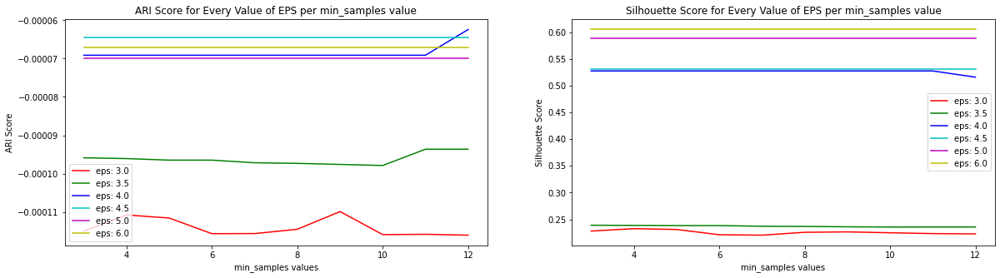

In [ ]:
colours = ['r','g','b','c','m','y','k','darkorange','darkviolet']
plt.figure(figsize=(20,5))
plt.subplot(1,2,1)
for i in range(len(etas2)):
  plt.subplot(1,2,1)
  plt.plot(
      dbscan_results_df2.loc[dbscan_results_df2['eps'] == etas2[i],'minpts'].values.tolist(),
      dbscan_results_df2.loc[dbscan_results_df2['eps'] == etas2[i],'aris_db2'].values.tolist(),
      color = colours[i],
      label = 'eps: {}'.format(etas2[i]))
plt.xlabel('min_samples values')
plt.ylabel('ARI Score')
plt.title('ARI Score for Every Value of EPS per min_samples value')
plt.legend()
plt.subplot(1,2,2)
for i in range(len(etas2)):
  plt.subplot(1,2,2)
  plt.plot(
      dbscan_results_df2.loc[dbscan_results_df2['eps'] == etas2[i],'minpts'].values.tolist(),
      dbscan_results_df2.loc[dbscan_results_df2['eps'] == etas2[i],'sils_db2'].values.tolist(),
      color = colours[i],
      label = 'eps: {}'.format(etas2[i]))
plt.xlabel('min_samples values')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Every Value of EPS per min_samples value')
plt.legend()
plt.show()

In [ ]:
len(minpts2)

10

In [ ]:
len(colours)

9

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future

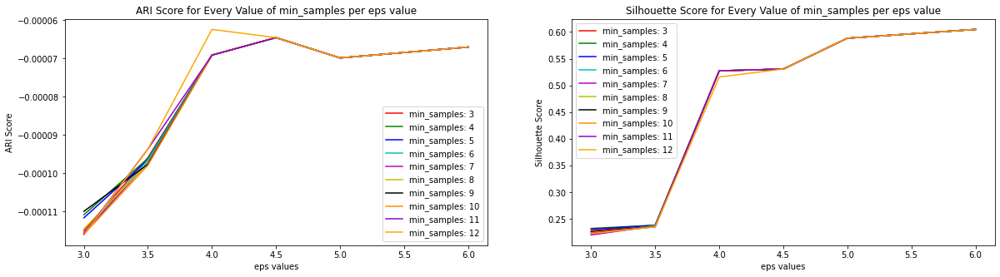

In [ ]:
colours = ['r','g','b','c','m','y','k','darkorange','darkviolet','orange']
plt.figure(figsize=(20,5))
plt.subplot(1,2,1)
for i in range(len(minpts2)):
  plt.subplot(1,2,1)
  plt.plot(
      dbscan_results_df2.loc[dbscan_results_df2['minpts'] == minpts2[i],'eps'].values.tolist(),
      dbscan_results_df2.loc[dbscan_results_df2['minpts'] == minpts2[i],'aris_db2'].values.tolist(),
      color = colours[i],
      label = 'min_samples: {}'.format(minpts2[i]))
plt.xlabel('eps values')
plt.ylabel('ARI Score')
plt.title('ARI Score for Every Value of min_samples per eps value')
plt.legend()
plt.subplot(1,2,2)
for i in range(len(minpts2)):
  plt.subplot(1,2,2)
  plt.plot(
      dbscan_results_df2.loc[dbscan_results_df2['minpts'] == minpts2[i],'eps'].values.tolist(),
      dbscan_results_df2.loc[dbscan_results_df2['minpts'] == minpts2[i],'sils_db2'].values.tolist(),
      color = colours[i],
      label = 'min_samples: {}'.format(minpts2[i]))
plt.xlabel('eps values')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Every Value of min_samples per eps value')
plt.legend()
plt.show()

Wow, it does appear that the silhouette score goes up significantly as eps values rise! It does not appear that min_pts affect the Silhouette score as much. 

In [ ]:
dbscan_results_df2.loc[dbscan_results_df2.sils_db2 > .5]['number of clusters'].value_counts()

3    40
Name: number of clusters, dtype: int64

All of the DBSCAN models with highest silhouette scores all have a cluster number of 3. This may be an attractice number of clusters, we will visualize and see.

In [ ]:
dbscan_results_df2.loc[dbscan_results_df2.sils_db2 < .5].sort_values(by='sils_db2',ascending=False)

,eps,minpts,aris_db2,sils_db2,number of clusters
10,3.5,3,-0.000096,0.239058,5
11,3.5,4,-0.000096,0.238752,5
13,3.5,6,-0.000096,0.238420,5
12,3.5,5,-0.000096,0.238420,5
14,3.5,7,-0.000097,0.237148,5
15,3.5,8,-0.000097,0.236822,5
16,3.5,9,-0.000098,0.236115,5
18,3.5,11,-0.000094,0.235706,5
19,3.5,12,-0.000094,0.235706,5
17,3.5,10,-0.000098,0.235677,5


The next most successful number of clusters is 5

#### Visualizations of Clusters

We'll visualize the results for some of the models with the highest silhouette scores. 

In [ ]:
pca = PCA(2).fit_transform(X)

In [ ]:
umap = UMAP(n_neighbors=3,
                    min_dist=0.3,
                    metric='correlation').fit_transform(X)

/usr/local/lib/python3.6/dist-packages/umap/spectral.py:253: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  "WARNING: spectral initialisation failed! The eigenvector solver\n"


In [ ]:
vis_db = pd.DataFrame({'pca_results1':pca[:,0],'pca_results2':pca[:,1]})
vis_db['umap1'] = umap[:,0]
vis_db['umap2'] = umap[:,1]

##### eps = 6.0, min_samples = 3

In [ ]:
dbscan_for_vis = DBSCAN(eps=6.0,min_samples=3)
clusters_for_vis = dbscan_for_vis.fit_predict(X)
vis_db['cluster_preds'] = clusters_for_vis

In [ ]:
dbscan_ari1 = metrics.adjusted_rand_score(y,clusters_for_vis)
dbscan_sil1 = metrics.silhouette_score(X,clusters_for_vis,metric='euclidean')
cluster_no1 = len(np.unique(clusters_for_vis))
print('ARI Score: {}\nSilhouette: {}\nNumber of Clusters: {}'.format(dbscan_ari1,dbscan_sil1,cluster_no1))

ARI Score: -6.700200293274178e-05
Silhouette: 0.6047974605499178
Number of Clusters: 3


Let's look at the sizes of the clusters here.

In [ ]:
vis_db['cluster_preds'].value_counts().sort_index()

-1        1
 0    42155
 1      149
Name: cluster_preds, dtype: int64

In [ ]:
dominant_cluster_perc1 = 100* vis_db['cluster_preds'].value_counts().sort_index().values.max() / vis_db['cluster_preds'].value_counts().sort_index().values.sum()
dominant_cluster_perc1

99.64543198203522

Oh dear. It's now clear why the ARI is so abysmal. This visualization will be largely one color. 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """


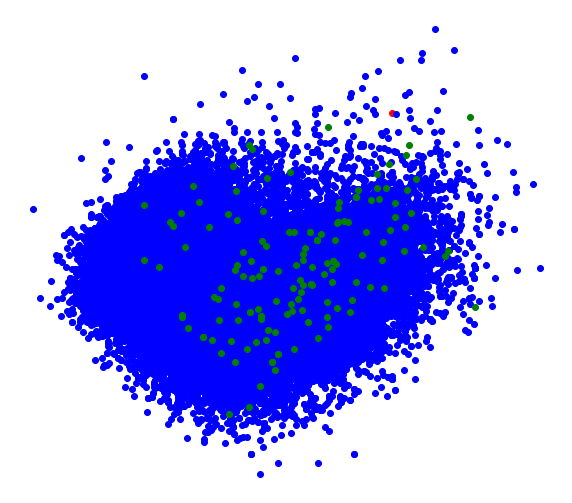

In [ ]:
plt.figure(figsize=(10,9))
colours = ["r","b","g"]
cluster_labels = [-1,0,1]
for i in range(len(cluster_labels)):
  plt.subplot(1,1,1)
  plt.scatter(
      vis_db.loc[vis_db.cluster_preds == cluster_labels[i]]['pca_results1'].values.tolist(),
      vis_db.loc[vis_db.cluster_preds == cluster_labels[i]]['pca_results2'].values.tolist(),
      c = colours[i]
      )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """


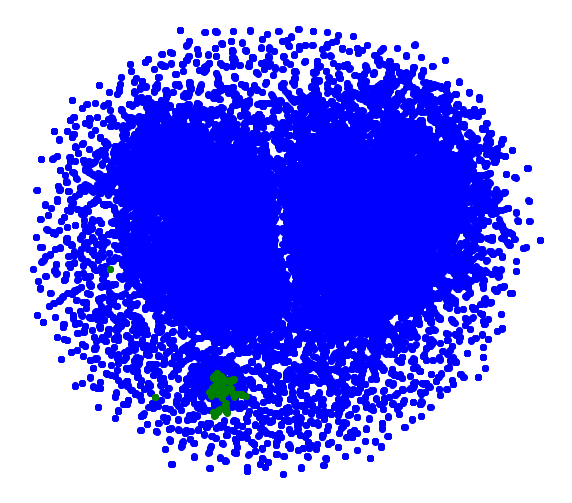

In [ ]:
plt.figure(figsize=(10,9))
colours = ["r","b","g"]
cluster_labels = [-1,0,1]
for i in range(len(cluster_labels)):
  plt.subplot(1,1,1)
  plt.scatter(
      vis_db.loc[vis_db.cluster_preds == cluster_labels[i]]['umap1'].values.tolist(),
      vis_db.loc[vis_db.cluster_preds == cluster_labels[i]]['umap2'].values.tolist(),
      c = colours[i]
      )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

##### eps = 3.0, minpts = 3

In [ ]:
dbscan_for_vis2 = DBSCAN(eps=3.0,min_samples=3)
clusters_for_vis2 = dbscan_for_vis2.fit_predict(X)

In [ ]:
cluster_no2=len(np.unique(clusters_for_vis2))
dbscan_ari2 = metrics.adjusted_rand_score(y,clusters_for_vis2)
dbscan_sil2 = metrics.silhouette_score(X,clusters_for_vis2,metric='euclidean')
print('ARI Score: {}\nSilhouette: {}\nNumber of Clusters: {}'.format(dbscan_ari2,dbscan_sil2,cluster_no2))

ARI Score: -0.00011502171704994063
Silhouette: 0.22816185712295067
Number of Clusters: 7


In [ ]:
vis_db['cluster_preds2']=clusters_for_vis2

In [ ]:
vis_db['cluster_preds2'].value_counts().sort_index()

-1       91
 0    40405
 1     1193
 2      478
 3      132
 4        3
 5        3
Name: cluster_preds2, dtype: int64

In [ ]:
dominant_cluster_perc2 = 100* vis_db['cluster_preds2'].value_counts().sort_index().values.max() / vis_db['cluster_preds2'].value_counts().sort_index().values.sum()
dominant_cluster_perc2

95.50880510577946

Same thing here, this visualization will be largely the same color.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """


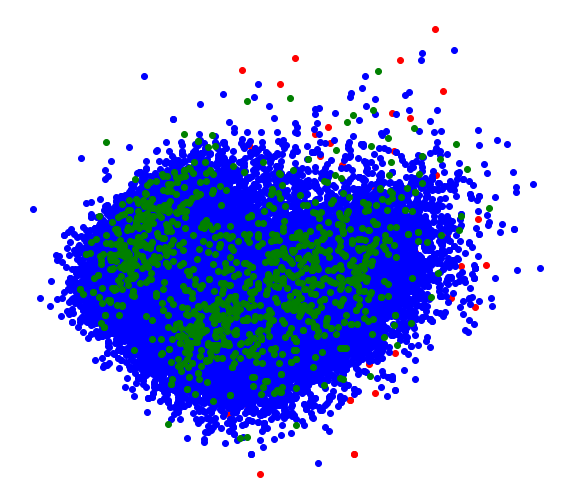

In [ ]:
plt.figure(figsize=(10,9))
colours = ["r","b","g","y","m","k","c"]
cluster_labels2 = [-1,0,1,2,3,4]
for i in range(len(cluster_labels)):
  plt.subplot(1,1,1)
  plt.scatter(
      vis_db.loc[vis_db.cluster_preds2 == cluster_labels2[i]]['pca_results1'].values.tolist(),
      vis_db.loc[vis_db.cluster_preds2 == cluster_labels2[i]]['pca_results2'].values.tolist(),
      c = colours[i]
      )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """


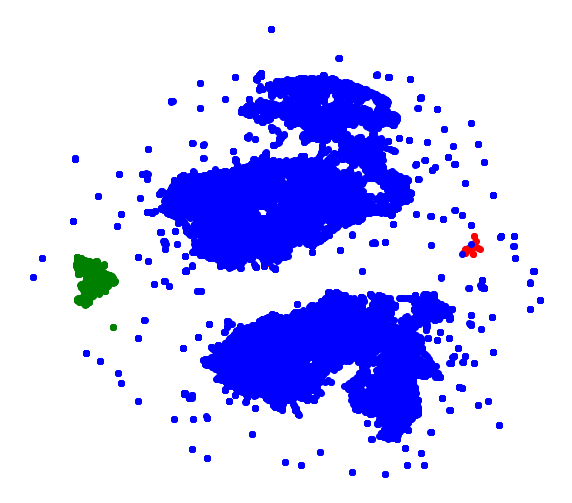

In [ ]:
plt.figure(figsize=(10,9))
colours = ["r","b","g","y","m","k","c"]
cluster_labels2 = [-1,0,1,2,3,4]
for i in range(len(cluster_labels)):
  plt.subplot(1,1,1)
  plt.scatter(
      vis_db.loc[vis_db.cluster_preds2 == cluster_labels2[i]]['umap1'].values.tolist(),
      vis_db.loc[vis_db.cluster_preds2 == cluster_labels2[i]]['umap2'].values.tolist(),
      c = colours[i]
      )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

##### eps = 0.5, minpts = 1

In [ ]:
dbscan_for_vis3 = DBSCAN(eps=0.5,min_samples=1)
clusters_for_vis3 = dbscan_for_vis3.fit_predict(X)

In [ ]:
cluster_no3 = len(np.unique(clusters_for_vis3))

33545

here, there are many many clusters. Too many in fact. 

In [ ]:
dbscan_ari3 = metrics.adjusted_rand_score(y,clusters_for_vis3)
dbscan_sil3 = metrics.silhouette_score(X,clusters_for_vis3,metric='euclidean')
cluster_no3 = len(np.unique(clusters_for_vis3))
print('ARI Score: {}\nSilhouette: {}\nNumber of Clusters: {}'.format(dbscan_ari3,dbscan_sil3,cluster_no3))

ARI Score: 0.0002666657205101786
Silhouette: 0.31343822593865905


In [ ]:
vis_db['cluster_preds3'] = clusters_for_vis3

In [ ]:
dominant_cluster_perc3 = 100* vis_db['cluster_preds3'].value_counts().sort_index().values.max() / vis_db['cluster_preds3'].value_counts().sort_index().values.sum()
dominant_cluster_perc3

0.1110979789622976

It is problematic that that largest cluster contains .11% of the data. We will not attempt to visualize this as this would take more colors than matplotlib has on hand.

#### Comparing "Best" DBSCAN Results

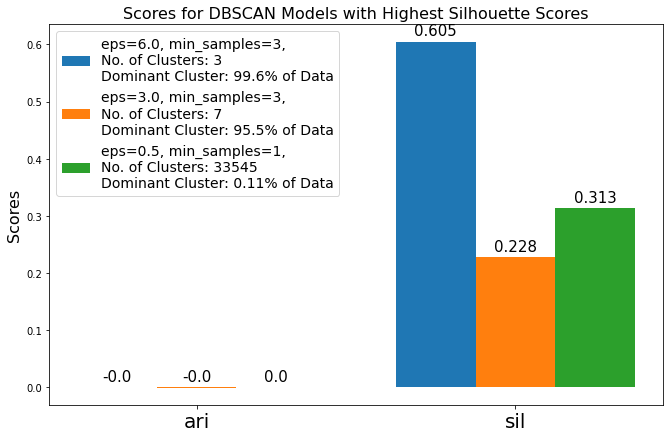

In [ ]:
labels = ['ari','sil']
dbscan1= [dbscan_ari1,dbscan_sil1]
dbscan2 = [dbscan_ari2,dbscan_sil2]
dbscan3 = [dbscan_ari3,dbscan_sil3]

x = np.arange((len(labels)))
width = 0.25

fig, ax = plt.subplots(figsize=(11,7))
rects1 = ax.bar(x-width,dbscan1, width, label='eps=6.0, min_samples=3,\nNo. of Clusters: {}'.format(cluster_no1))
rects2 = ax.bar(x,dbscan2, width, label='eps=3.0, min_samples=3,\nNo. of Clusters: {}'.format(cluster_no2))
rects3 = ax.bar(x+width,dbscan3, width, label='eps=0.5, min_samples=1,\nNo. of Clusters: {}'.format(cluster_no3))

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores',fontsize=16)
ax.set_title('Scores for DBSCAN Models with Highest Silhouette Scores',fontsize=16)
ax.set_xticks(x)
ax.set_xticklabels(labels,fontsize=20)
ax.legend()

def autolabel(rects):
  for rect in rects:
    height = rect.get_height()
    ax.annotate('{}'.format(round(height,3)),
                xy=(rect.get_x() + rect.get_width() /2,height),
                xytext = (0,3), # 3 points vertical offset
                fontsize=15,
                textcoords = 'offset points',
                ha='center',va='bottom')

autolabel(rects1)
autolabel(rects2)
autolabel(rects3)
plt.legend(['eps=6.0, min_samples=3,\nNo. of Clusters: {}\nDominant Cluster: {}% of Data'.format(cluster_no1,round(dominant_cluster_perc1,1)),
            'eps=3.0, min_samples=3,\nNo. of Clusters: {}\nDominant Cluster: {}% of Data'.format(cluster_no2,round(dominant_cluster_perc2,1)),
            'eps=0.5, min_samples=1,\nNo. of Clusters: {}\nDominant Cluster: {}% of Data'.format(cluster_no3,round(dominant_cluster_perc3,2))],
           fontsize=14)

plt.show()

Although the Silhouette scores are deceivingly high, when we examine the number of clusters and the size of the dominant cluster, it's clear that none of these results are viable for modeling out data. 

##### 'Best' DBSCAN Model

It's almost humorous to pick a best model here. Considering none of the models produced by DBSCAN are viable for this data, I will refrain from using the DBSCAN models in the final analysis.

### Hierarchical Clustering

In [ ]:
agg_results_df= pd.DataFrame({})

In [ ]:
agg_results_df['pca1'] = pca[:,0]
agg_results_df['pca2'] = pca[:,1]
agg_results_df['umap1'] = umap[:,0]
agg_results_df['umap2'] = umap[:,1]
agg_results_df['tsne1'] = tsne_results[:,0]
agg_results_df['tsne2'] = tsne_results[:,1]
agg_results_df['pca3_1'] = pca3[:,0]
agg_results_df['pca3_2'] = pca3[:,1]
agg_results_df['pca3_3'] = pca3[:,2]

#### Dendrograms

We'll examine some dendrograms, of only half the data as it is a large dataset, to determine an appropriate amount of clusters. 

In [ ]:
X_1,X_2,y_1,y_2 = train_test_split(X,y,test_size=0.5,random_state=123)

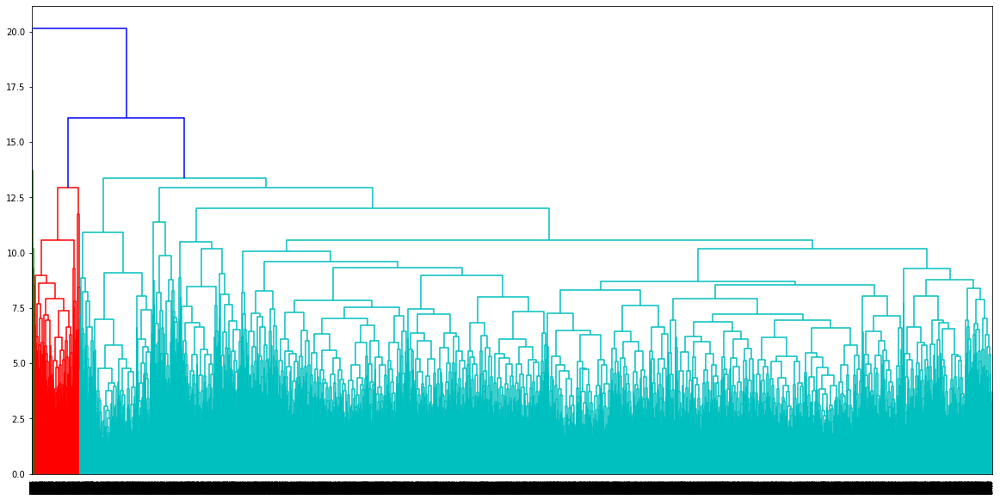

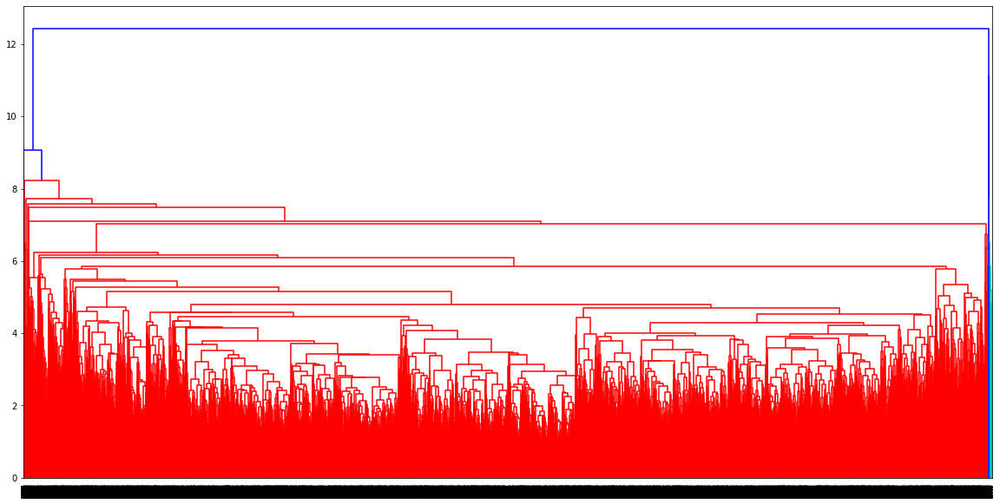

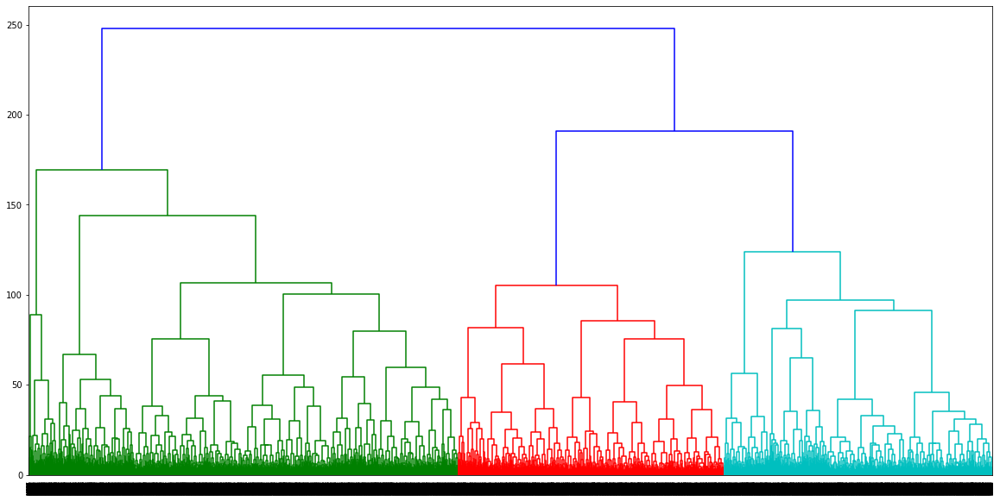

In [ ]:
# List of methods
method_list = ['complete','average','ward']

for method in method_list:
  plt.figure(figsize=(20,10))
  dendrogram(linkage(X_1,method=method))
  plt.show()

Well that truly gave us very little useful information, and was very computationally expensive. We won't deign to use that again, but we'll attempt agglomerative clustering with n_clusters = 3 which is what the data suggets

#### Agglomerative Cluster with 'ward' different n_clusters=3

In [ ]:
agg = AgglomerativeClustering(n_clusters=3,linkage='ward',affinity='euclidean')
agg_clusters3 = agg.fit_predict(X)

In [ ]:
agg_ari = metrics.adjusted_rand_score(y,agg_clusters3)
agg_sil = metrics.silhouette_score(X,agg_clusters3,metric='euclidean')
print('ARI Score: {}\nSilhouette: {}'.format(agg_ari,agg_sil))

ARI Score: 0.13106867246694628
Silhouette: 0.0996589326209417


In [ ]:
best_agg_ari = 0.13106867246694628
best_agg_sil = 0.0996589326209417

In [ ]:
agg_results_df['agg_clusters3'] = agg_clusters3

In [ ]:
agg_results_df.agg_clusters3.value_counts().sort_index()

0    15452
1    18959
2     7894
Name: agg_clusters3, dtype: int64

#### Visualization of Clusters 

##### Visualization with PCA

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """


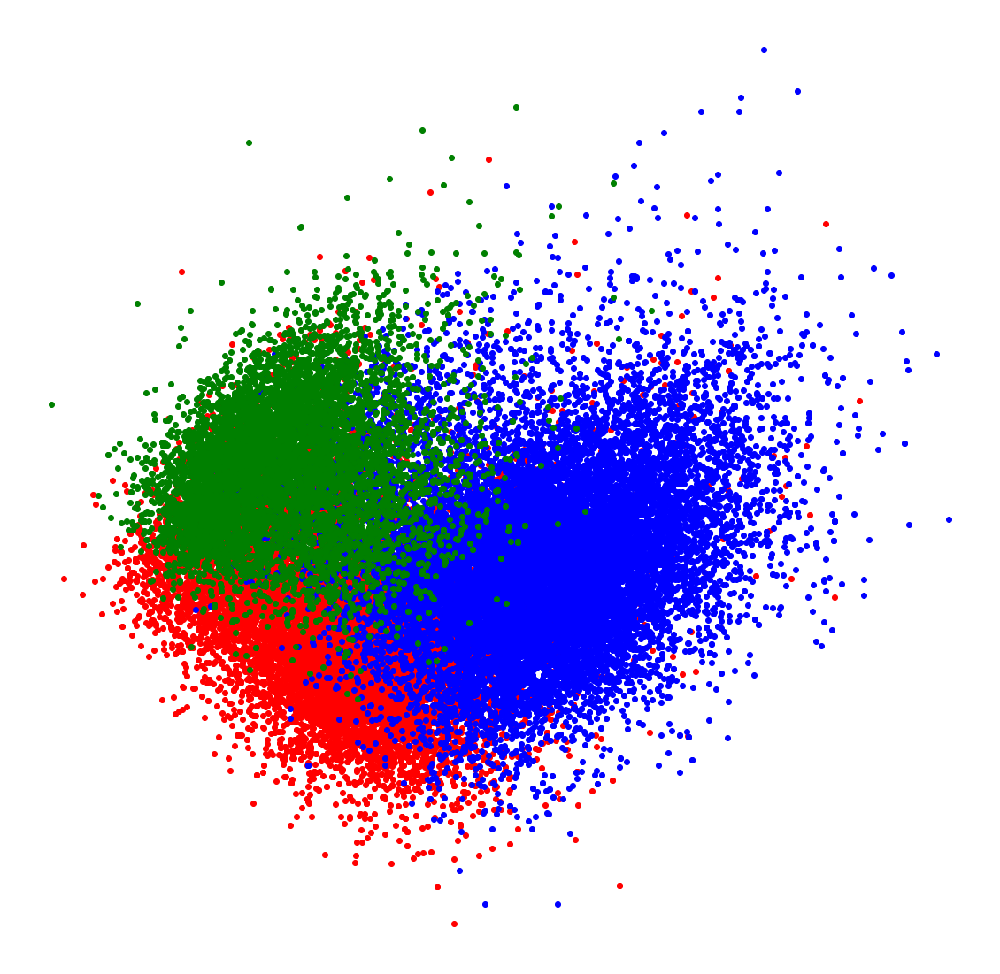

In [ ]:
plt.figure(figsize=(20,20))
colours = ["r","b","g","y","m","k","c","orange"]
cluster_labels = agg_results_df['agg_clusters3'].value_counts().sort_index().index.tolist()
for i in range(len(cluster_labels)):
  plt.subplot(1,1,1)
  plt.scatter(
      kmeans_results_df.loc[agg_results_df.agg_clusters3 == cluster_labels[i]]['pca1'].values.tolist(),
      kmeans_results_df.loc[agg_results_df.agg_clusters3 == cluster_labels[i]]['pca2'].values.tolist(),
      c = colours[i]
      )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

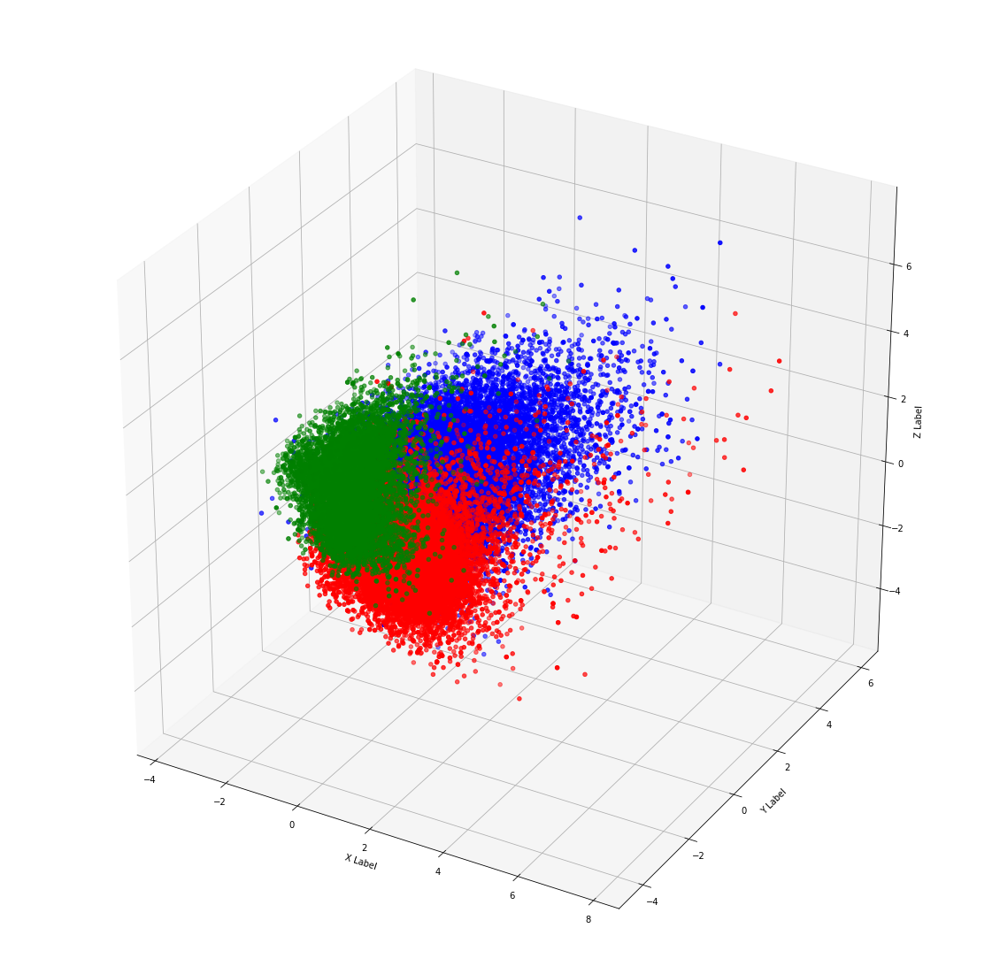

In [ ]:
colours = ["r","b","g","y","m","k","c","orange"]
cluster_labels = agg_results_df['agg_clusters3'].value_counts().sort_index().index.tolist()

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')

for i in range(len(cluster_labels)):
  ax.scatter(
      kmeans_results_df.loc[agg_results_df.agg_clusters3 == cluster_labels[i]]['pca3_3'].values.tolist(),
      kmeans_results_df.loc[agg_results_df.agg_clusters3 == cluster_labels[i]]['pca3_1'].values.tolist(),
      kmeans_results_df.loc[agg_results_df.agg_clusters3 == cluster_labels[i]]['pca3_2'].values.tolist(),
      c = colours[i]
  )
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
plt.show()

While this looks similar to the clusters from k-means, It does look a bit messier as well. 

##### Visualization with UMAP

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """


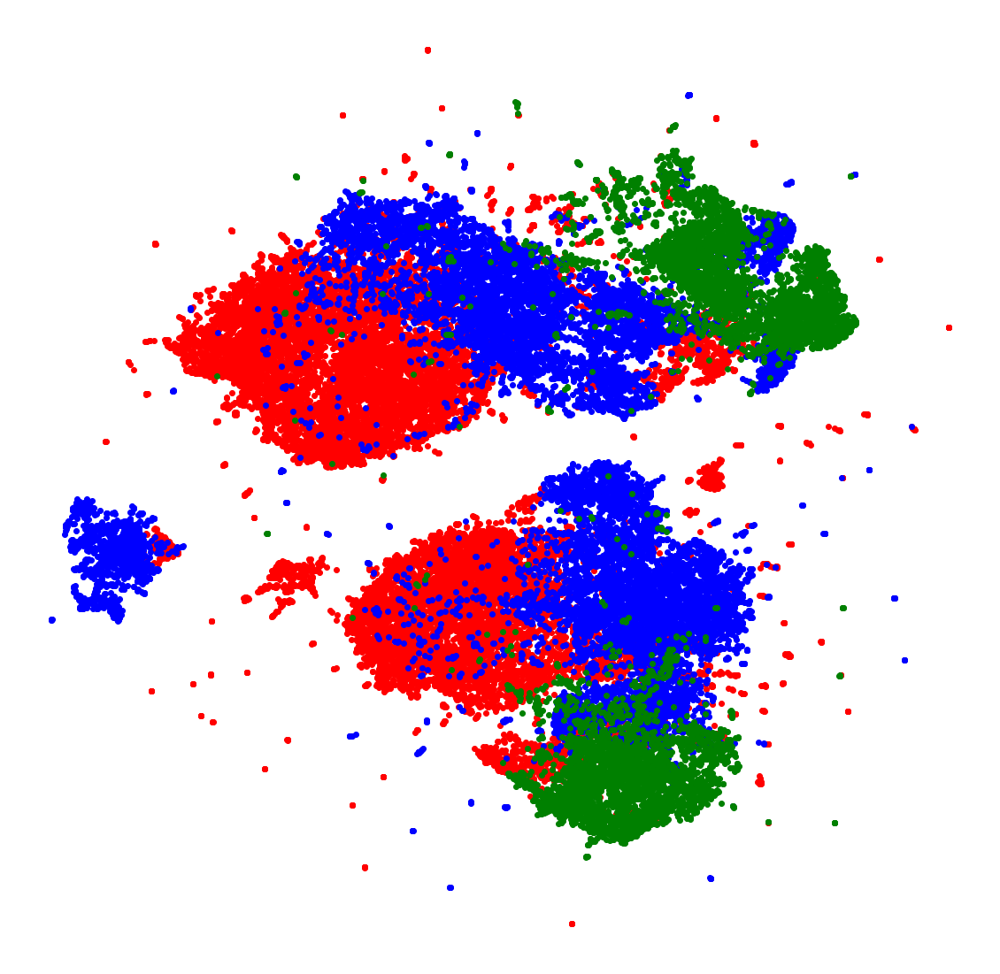

In [ ]:
plt.figure(figsize=(20,20))
colours = ["r","b","g"]
cluster_labels = agg_results_df['agg_clusters3'].value_counts().index.tolist()
for i in range(len(cluster_labels)):
  plt.subplot(1,1,1)
  plt.scatter(
      agg_results_df.loc[agg_results_df.agg_clusters3 == cluster_labels[i]]['umap1'].values.tolist(),
      agg_results_df.loc[agg_results_df.agg_clusters3 == cluster_labels[i]]['umap2'].values.tolist(),
      c = colours[i]
      )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Similar issue. All the visible clusters have colors of all three clusters predicted by the clustering model. Once again PCA is best. 

##### Visualization with t-SNE

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """


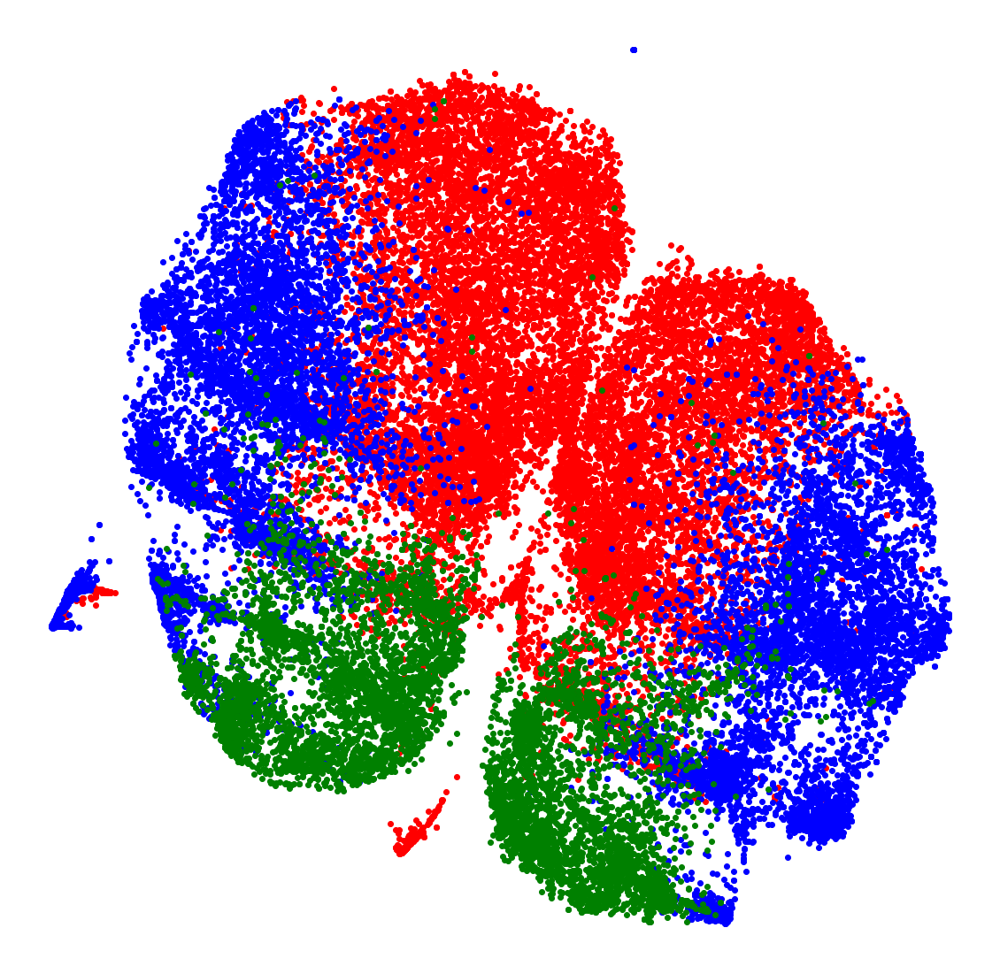

In [ ]:
plt.figure(figsize=(20,20))
colours = ["r","b","g"]
cluster_labels = agg_results_df['agg_clusters3'].value_counts().index.tolist()
for i in range(len(cluster_labels)):
  plt.subplot(1,1,1)
  plt.scatter(
      agg_results_df.loc[agg_results_df.agg_clusters3 == cluster_labels[i]]['tsne1'].values.tolist(),
      agg_results_df.loc[agg_results_df.agg_clusters3 == cluster_labels[i]]['tsne2'].values.tolist(),
      c = colours[i]
      )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Symmetrically colored clusters produced by T-SNE. 

#### Best Agglomerative Clustering Model

Considering only one model was used from Agglomerative clustering, as it was determined by dendrograms that the best model would have 3 clusters and use the 'ward' method, the 'best' model, and the one that will be comparied to others, is this one.

In [ ]:
agg_bestari = 0.13106867246694628
agg_bestsil = 0.0996589326209417

### Gaussian Mixture Model

#### Running the Initial Model

In [ ]:
gmm_results_df = pd.DataFrame({})
gmm_results_df['pca1'] = pca[:,0]
gmm_results_df['pca2'] = pca[:,1]
gmm_results_df['umap1'] = umap[:,0]
gmm_results_df['umap2'] = umap[:,1]
gmm_results_df['tsne1'] = tsne_results[:,0]
gmm_results_df['tsne2'] = tsne_results[:,1]
gmm_results_df['pca3_1'] = pca3[:,0]
gmm_results_df['pca3_2'] = pca3[:,1]
gmm_results_df['pca3_3'] = pca3[:,2]

In [ ]:
gmm3 = GaussianMixture(n_components=3,random_state=123)
gmm_clusters3 = gmm3.fit_predict(X)

In [ ]:
gmm_ari = metrics.adjusted_rand_score(y,gmm_clusters3)
gmm_sil = metrics.silhouette_score(X,gmm_clusters3,metric='euclidean')
print('ARI Score: {}\nSilhouette: {}'.format(gmm_ari,gmm_sil))

ARI Score: 0.06708779066508151
Silhouette: 0.08276154293769057


In [ ]:
gmm_results_df['gmm_clusters3'] = gmm_clusters3

In [ ]:
gmm_results_df.gmm_clusters3.value_counts()

0    23652
1    16767
2     1886
Name: gmm_clusters3, dtype: int64

#### Examining Covariance Types

In [ ]:
covar_types = ['full','tied','diag','spherical']

for covar_type in covar_types:
  # Defining the agglomerative clustering
  gmm = GaussianMixture(n_components=3, covariance_type= covar_type,random_state=123)

  # Fit model
  gmm_clusters = gmm.fit_predict(X)

  print('Covariance Type: {}'.format(covar_type))
  print('-'*20)
  print("Adjusted Rand Index of the GMM solution: {}"
      .format(metrics.adjusted_rand_score(y, gmm_clusters)))
  print("The silhoutte score of the GMM solution: {}"
      .format(metrics.silhouette_score(X, gmm_clusters, metric='euclidean')))
  print('-'*40)

Covariance Type: full
--------------------
Adjusted Rand Index of the GMM solution: 0.06708779066508151
The silhoutte score of the GMM solution: 0.08276154293769057
----------------------------------------
Covariance Type: tied
--------------------
Adjusted Rand Index of the GMM solution: 0.07067664125045858
The silhoutte score of the GMM solution: 0.11037654500894596
----------------------------------------
Covariance Type: diag
--------------------
Adjusted Rand Index of the GMM solution: 0.020314882167709054
The silhoutte score of the GMM solution: 0.07512543394406701
----------------------------------------
Covariance Type: spherical
--------------------
Adjusted Rand Index of the GMM solution: 0.13263515397071565
The silhoutte score of the GMM solution: 0.1059962473573434
----------------------------------------


WOW! Spherical was SO much better, although the highest silhouette score was on "tied"

#### Examining Covariance Types with Different Values of cluster number from K-Means Modeling

In [ ]:
covar_types = []
n_components = []
gmm_aris = []
gmm_sils = []
for covar_type in ['tied','spherical']:
  for k in [3,5,8,11]:
    # Defining the agglomerative clustering
    gmm = GaussianMixture(n_components=k, covariance_type= covar_type,random_state=123)

    # Fit model
    gmm_clusters = gmm.fit_predict(X)
    
    print('Covariance Type: {}'.format(covar_type))
    print('n_components: {}'.format(k))
    print('-'*20)
    print("Adjusted Rand Index of the GMM solution: {}"
      .format(metrics.adjusted_rand_score(y, gmm_clusters)))
    print("The silhoutte score of the GMM solution: {}"
      .format(metrics.silhouette_score(X, gmm_clusters, metric='euclidean')))
    print('-'*40)

    covar_types.append(covar_type)
    n_components.append(k)
    gmm_aris.append(metrics.adjusted_rand_score(y, gmm_clusters))
    gmm_sils.append(metrics.silhouette_score(X, gmm_clusters, metric='euclidean'))
    gmm_results_df['gmm_clusters{}_{}'.format(k,covar_type)] = gmm_clusters

Covariance Type: tied
n_components: 3
--------------------
Adjusted Rand Index of the GMM solution: 0.07067664125045858
The silhoutte score of the GMM solution: 0.11037654500894596
----------------------------------------
Covariance Type: tied
n_components: 5
--------------------
Adjusted Rand Index of the GMM solution: 0.08813149712741324
The silhoutte score of the GMM solution: 0.09541636394632307
----------------------------------------
Covariance Type: tied
n_components: 8
--------------------
Adjusted Rand Index of the GMM solution: 0.1521312617199889
The silhoutte score of the GMM solution: 0.10520359564884196
----------------------------------------
Covariance Type: tied
n_components: 11
--------------------
Adjusted Rand Index of the GMM solution: 0.06393837367165522
The silhoutte score of the GMM solution: 0.039761284036236376
----------------------------------------
Covariance Type: spherical
n_components: 3
--------------------
Adjusted Rand Index of the GMM solution: 0.1326

In [ ]:
gmm_results_df

,pca1,pca2,umap1,umap2,tsne1,tsne2,pca3_1,pca3_2,pca3_3,gmm_clusters3,gmm_clusters3_tied,gmm_clusters5_tied,gmm_clusters8_tied,gmm_clusters11_tied,gmm_clusters3_spherical,gmm_clusters5_spherical,gmm_clusters8_spherical,gmm_clusters11_spherical
0,2.024823,-0.777918,-2.755151,15.243820,0.135578,4.991942,2.024802,-0.777955,-1.164041,0,2,3,4,5,2,3,4,5
1,1.467969,1.611992,2.779926,10.720560,0.304288,0.636441,1.467973,1.611999,0.563742,0,0,2,5,6,2,3,6,6
2,0.420431,-1.838716,1.677104,16.342760,-1.981820,4.472578,0.420397,-1.838775,0.612847,0,0,1,4,4,2,2,4,4
3,0.393451,-1.328023,-5.820782,6.524902,-6.953913,-1.135191,0.393446,-1.328030,2.108242,2,0,1,1,8,2,2,5,8
4,2.577203,-0.210219,-0.644319,13.872324,0.346185,3.759283,2.577200,-0.210223,-0.936765,0,2,3,4,5,2,3,4,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42300,-0.072836,-0.280381,5.823473,15.971128,-2.887784,1.403656,-0.072825,-0.280362,0.087759,0,0,1,1,1,0,1,1,1
42301,0.037697,-0.264353,9.305611,6.635094,3.548925,-1.044123,0.037688,-0.264369,0.667908,0,0,0,0,0,0,0,0,0
42302,-1.139743,-1.572071,7.768684,15.584215,-4.920367,1.972373,-1.139735,-1.572056,1.377095,0,0,1,1,1,0,1,1,1
42303,-1.028417,-0.671238,10.713913,3.704402,4.179593,-1.349390,-1.028421,-0.671246,0.170915,1,0,0,0,0,0,0,0,0


##### Comparing Results of Gaussian Mixture Models

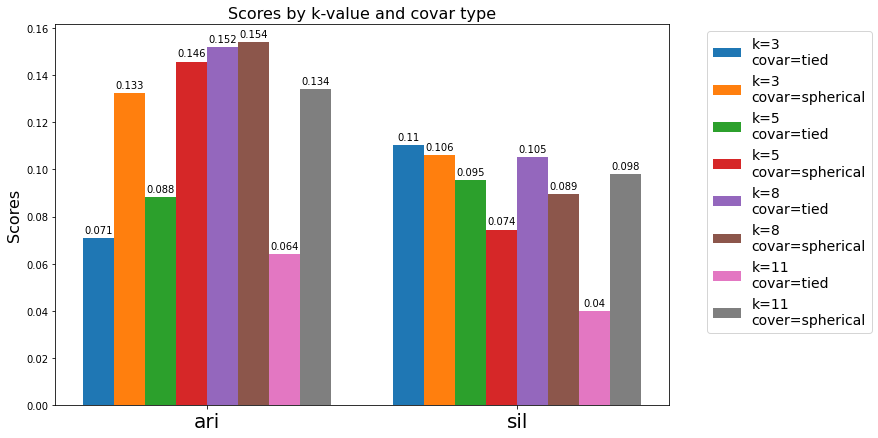

In [ ]:
labels = ['ari','sil']
gmm3tied= [0.07067664125045858,0.11037654500894596]
gmm3spher = [0.13263515397071565,0.1059962473573434]
gmm5tied = [0.08813149712741324,0.09541636394632307]
gmm5spher = [0.1458638654753302,0.07448541568902545]
gmm8tied = [0.1521312617199889,0.10520359564884196]
gmm8spher = [0.15399304662603105,0.08941213401897126]
gmm11tied = [0.06393837367165522,0.039761284036236376]
gmm11spher = [0.13421819197477797,0.09809787092379478]

x = np.arange((len(labels)))
width = 0.10

fig, ax = plt.subplots(figsize=(11,7))
rects1 = ax.bar(x-width*3.5,gmm3tied, width, label='k=3, covar=tied')
rects2 = ax.bar(x-width*2.5,gmm3spher, width, label='k=3, covar=spherical')
rects3 = ax.bar(x-width*1.5,gmm5tied,width,label='k=5, covar=tied')
rects4 = ax.bar(x-width*.5,gmm5spher,width,label='k=5, covar=spherical')
rects5 = ax.bar(x+width*.5,gmm8tied,width,label='k=8, covar=tied')
rects6 = ax.bar(x+width*1.5,gmm8spher,width,label='k=8, covar=spherical')
rects7 = ax.bar(x+width*2.5,gmm11tied,width,label='k=11, covar=tied')
rects8 = ax.bar(x+width*3.5,gmm11spher,width,label='k=11, covar=spherical')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores',fontsize=16)
ax.set_title('Scores by k-value and covar type',fontsize=16)
ax.set_xticks(x)
ax.set_xticklabels(labels,fontsize=20)
ax.legend()

def autolabel(rects):
  for rect in rects:
    height = rect.get_height()
    ax.annotate('{}'.format(round(height,3)),
                xy=(rect.get_x() + rect.get_width() /2,height),
                xytext = (0,3), # 3 points vertical offset
                fontsize=10,
                textcoords = 'offset points',
                ha='center',va='bottom')

autolabel(rects1)
autolabel(rects2)
autolabel(rects3)
autolabel(rects4)
autolabel(rects5)
autolabel(rects6)
autolabel(rects7)
autolabel(rects8)
plt.legend(['k=3\ncovar=tied','k=3\ncovar=spherical','k=5\ncovar=tied','k=5\ncovar=spherical','k=8\ncovar=tied','k=8\ncovar=spherical','k=11\ncovar=tied','k=11\ncover=spherical'],
           fontsize=14,
           bbox_to_anchor=(1.05, 1))

plt.show()

The best model according to silhouette is k=3 and covariance type = tied, but the ARI for this model is one of the lowest. We will visualize it anyways consdiering we are considering the Silhouette score moreso than the ARI. 

The best model according to ARI is k=8 and covariance type = spherical. The silhouette score of this model is reasonable but not the best. 

The best model according to both is k=8 and covariance type = tied. 

k=3 and covariance type = spherical is also a good model according to ARI and Silhouette Score.

#### Visualizations of Best GMM Models

##### Visualization of Tied 3 Cluster Solution with PCA

In [ ]:
gmm_results_df['gmm_clusters3_tied'].value_counts().sort_index()

0    20229
1    13890
2     8186
Name: gmm_clusters3_tied, dtype: int64

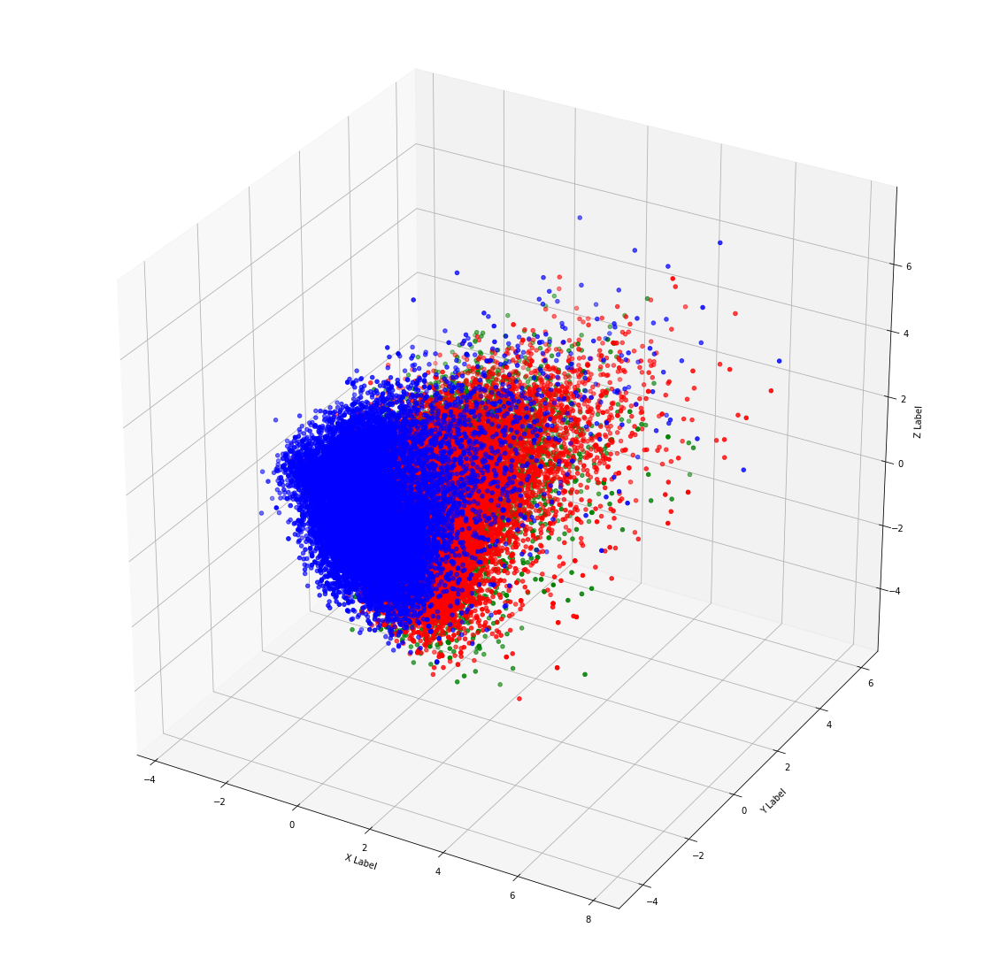

In [ ]:
colours = ["r","b","g","y","m","k","c","orange"]
cluster_labels = gmm_results_df['gmm_clusters3_tied'].value_counts().sort_index().index.tolist()

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')

for i in range(len(cluster_labels)):
  ax.scatter(
      gmm_results_df.loc[gmm_results_df.gmm_clusters3_tied == cluster_labels[i]]['pca3_3'].values.tolist(),
      gmm_results_df.loc[gmm_results_df.gmm_clusters3_tied == cluster_labels[i]]['pca3_1'].values.tolist(),
      gmm_results_df.loc[gmm_results_df.gmm_clusters3_tied == cluster_labels[i]]['pca3_2'].values.tolist(),
      c = colours[i]
  )
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
plt.show()

Rather messy! 

##### Visualization of Spherical 3 Cluster Solution with PCA

In [ ]:
gmm_results_df['gmm_clusters3_spherical'].value_counts().sort_index()

0    14745
1     9830
2    17730
Name: gmm_clusters3_spherical, dtype: int64

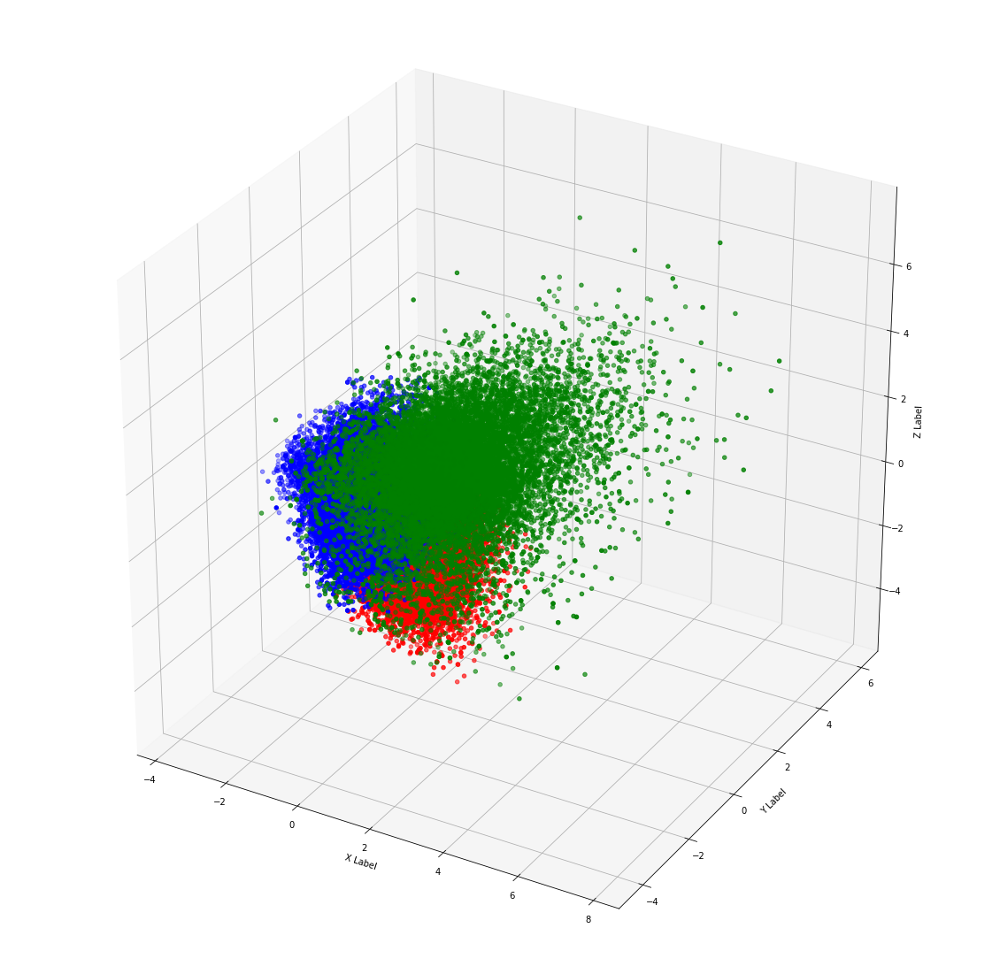

In [ ]:
colours = ["r","b","g","y","m","k","c","orange"]
cluster_labels = gmm_results_df['gmm_clusters3_spherical'].value_counts().sort_index().index.tolist()

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')

for i in range(len(cluster_labels)):
  ax.scatter(
      gmm_results_df.loc[gmm_results_df.gmm_clusters3_spherical == cluster_labels[i]]['pca3_3'].values.tolist(),
      gmm_results_df.loc[gmm_results_df.gmm_clusters3_spherical == cluster_labels[i]]['pca3_1'].values.tolist(),
      gmm_results_df.loc[gmm_results_df.gmm_clusters3_spherical == cluster_labels[i]]['pca3_2'].values.tolist(),
      c = colours[i]
  )
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
plt.show()

##### Visualization of Tied 8 Cluster Solution with PCA

In [ ]:
gmm_results_df['gmm_clusters8_tied'].value_counts().sort_index()

0    6935
1    6683
2    2832
3    3041
4    6445
5    3407
6    5502
7    7460
Name: gmm_clusters8_tied, dtype: int64

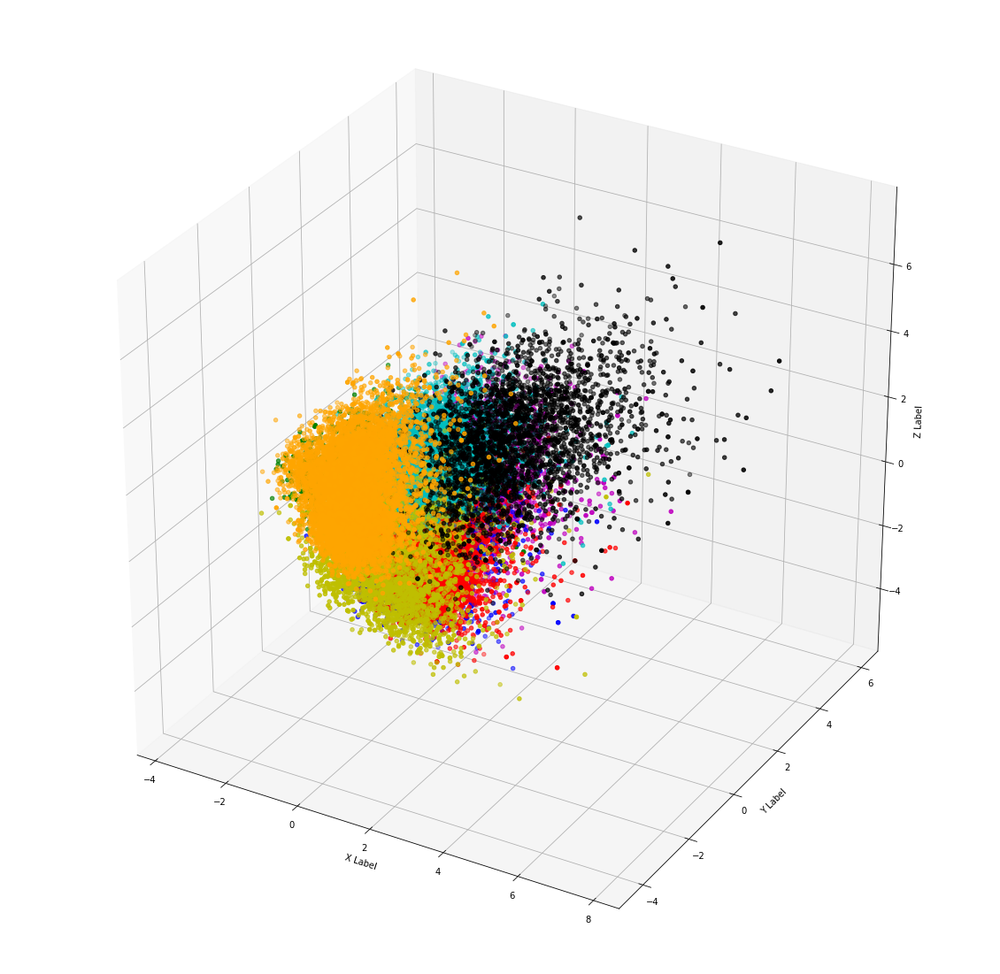

In [ ]:
colours = ["r","b","g","y","m","k","c","orange"]
cluster_labels = gmm_results_df['gmm_clusters8_tied'].value_counts().sort_index().index.tolist()

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')

for i in range(len(cluster_labels)):
  ax.scatter(
      gmm_results_df.loc[gmm_results_df.gmm_clusters8_tied == cluster_labels[i]]['pca3_3'].values.tolist(),
      gmm_results_df.loc[gmm_results_df.gmm_clusters8_tied == cluster_labels[i]]['pca3_1'].values.tolist(),
      gmm_results_df.loc[gmm_results_df.gmm_clusters8_tied == cluster_labels[i]]['pca3_2'].values.tolist(),
      c = colours[i]
  )
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
plt.show()

##### Visualization of Spherical 8 Cluster Solution with PCA

In [ ]:
gmm_results_df['gmm_clusters8_spherical'].value_counts().sort_index()

0    5642
1    5507
2    3516
3    2868
4    7432
5    4287
6    5681
7    7372
Name: gmm_clusters8_spherical, dtype: int64

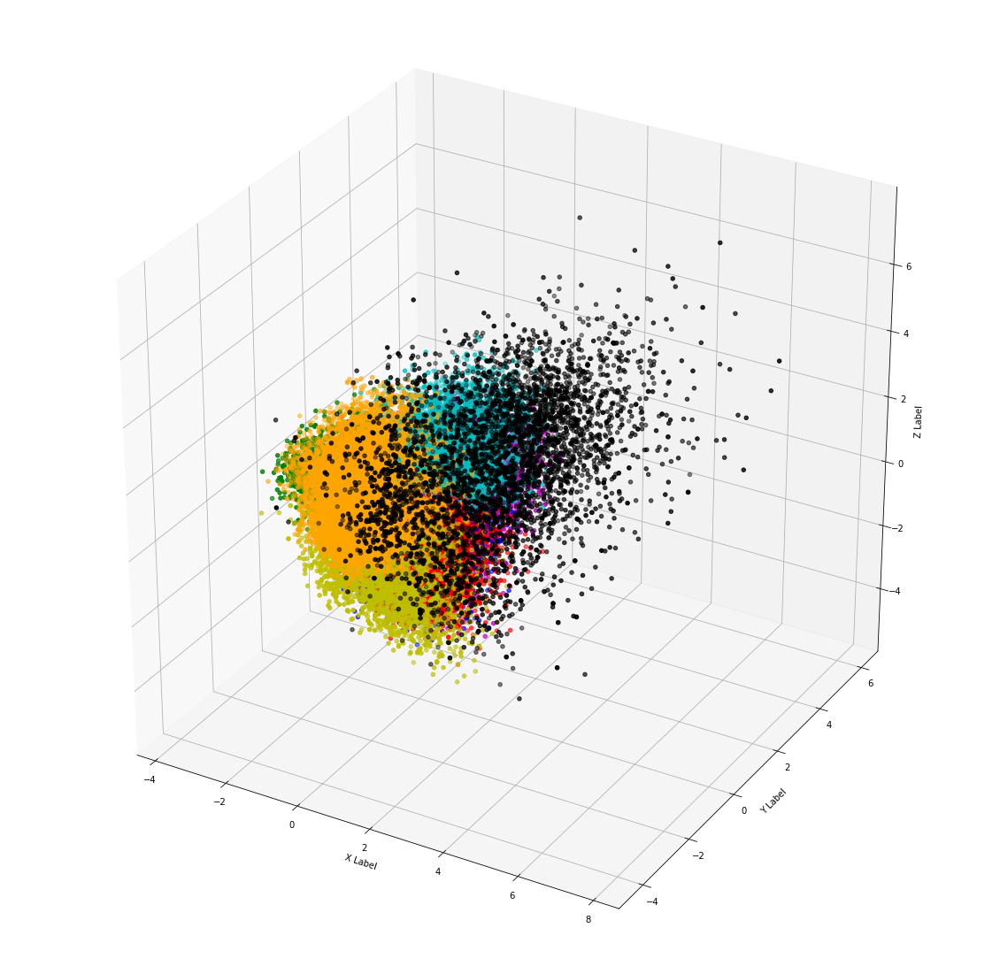

In [ ]:
colours = ["r","b","g","y","m","k","c","orange"]
cluster_labels = gmm_results_df['gmm_clusters8_spherical'].value_counts().sort_index().index.tolist()

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')

for i in range(len(cluster_labels)):
  ax.scatter(
      gmm_results_df.loc[gmm_results_df.gmm_clusters8_spherical == cluster_labels[i]]['pca3_3'].values.tolist(),
      gmm_results_df.loc[gmm_results_df.gmm_clusters8_spherical == cluster_labels[i]]['pca3_1'].values.tolist(),
      gmm_results_df.loc[gmm_results_df.gmm_clusters8_spherical == cluster_labels[i]]['pca3_2'].values.tolist(),
      c = colours[i]
  )
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
plt.show()

All of these visualiations are a bit messier than K-means.

#### Best Gaussian Mixture Model

The best model with respect to both a high ARI and a high Silhouette score is the model that uses 8 clusters with a tied covariance type. We'll use this model for comparison with other models.

In [ ]:
gmm_bestari = 0.1521312617199889
gmm_bestsil = 0.10520359564884196

## Model Comparisons

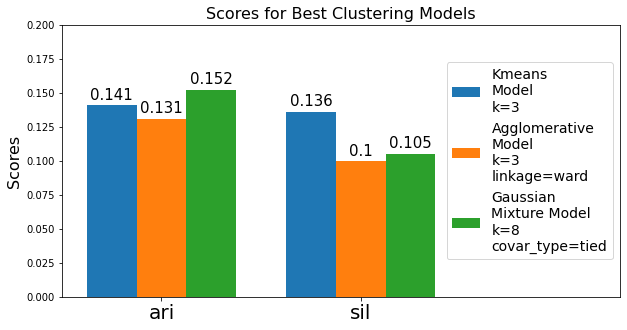

In [ ]:
labels = ['ari','sil']
kmeans_model = [kmeans_bestari,kmeans_bestsil]
agg_model = [agg_bestari,agg_bestsil]
gmm_model = [gmm_bestari,gmm_bestsil]

x = np.arange(len(labels)) 
width = .25

fig,ax = plt.subplots(figsize=(10,5))
rects1 = ax.bar(x-width,kmeans_model,width,label='K means Model\nk=3')
rects2 = ax.bar(x,agg_model,width,label='Agglomerative Model\nk=3, linkage=ward')
rects3 = ax.bar(x+width,gmm_model,width,label='Gaussian Mixture Model\nk=8, covar_type=tied')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores',fontsize=16)
ax.set_title('Scores for Best Clustering Models',fontsize=16)
ax.set_xticks(x)
ax.set_xticklabels(labels,fontsize=20)
ax.set_ylim(0,.2)
ax.set_xlim(-.5,2.3)
ax.legend()

def autolabel(rects):
  for rect in rects:
    height = rect.get_height()
    ax.annotate('{}'.format(round(height,3)),
                xy=(rect.get_x() + rect.get_width() /2,height),
                xytext = (0,3), # 3 points vertical offset
                fontsize=15,
                textcoords = 'offset points',
                ha='center',va='bottom')

autolabel(rects1)
autolabel(rects2)
autolabel(rects3)
plt.legend(['Kmeans\nModel\nk=3','Agglomerative\nModel\nk=3\nlinkage=ward','Gaussian\nMixture Model\nk=8\ncovar_type=tied'],
           fontsize=14,
           loc='center right'
)

plt.show()

The best model according to the Silhouette score is the KMeans model with 3 clusters. While it is not the best ARI score, all the ARI scores are quite poor, mostly because genre is actually not a good way to group songs based on their characteristics, and it is not always the most important indicator for why a person may like a song. 

It may have been more valuable to include genre in the features in fact, and not consider an ARI score at all. 

The Kmeans model also had the cleanest clusters when visualised in 3-D, as reduced by PCA. 

## Statistics of Clusters for K-Means Model with 3 Clusters

### Initial Examination and Pre-processing before Analysis

In [ ]:
analysis_df = pd.concat([music_df,kmeans_results_df['clusters3']],axis=1)
analysis_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42305 entries, 0 to 42304
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   danceability      42305 non-null  float64
 1   energy            42305 non-null  float64
 2   key               42305 non-null  int64  
 3   loudness          42305 non-null  float64
 4   mode              42305 non-null  int64  
 5   speechiness       42305 non-null  float64
 6   acousticness      42305 non-null  float64
 7   instrumentalness  42305 non-null  float64
 8   liveness          42305 non-null  float64
 9   valence           42305 non-null  float64
 10  tempo             42305 non-null  float64
 11  type              42305 non-null  object 
 12  id                42305 non-null  object 
 13  uri               42305 non-null  object 
 14  track_href        42305 non-null  object 
 15  analysis_url      42305 non-null  object 
 16  duration_ms       42305 non-null  int64 

#### Label Encoding the Genre Back to Strings

In [ ]:
genre_list_df

,genre name,genre code
0,Dark Trap,0
1,Emo,1
2,Hiphop,2
3,Pop,3
4,Rap,4
5,RnB,5
6,Trap Metal,6
7,Underground Rap,7
8,dnb,8
9,hardstyle,9


In [ ]:
codes = genre_list_df['genre code'].values.tolist()
genres = genre_list_df['genre name'].values.tolist()
codes = genre_list_df['genre code'].values.tolist()
genres = genre_list_df['genre name'].values.tolist()
for i in range(len(genre_list_df)):
  analysis_df.loc[analysis_df.genre == codes[i],'genre'] = genres[i]

### Statistics of Each Cluster

In [ ]:
analysis_df.loc[analysis_df.clusters3 == 0].describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed: 0,clusters3
count,15313.000000,15313.000000,15313.000000,15313.000000,15313.000000,15313.000000,15313.000000,15313.000000,15313.000000,15313.000000,15313.000000,15313.000000,15313.000000,9175.000000,15313.0
mean,0.541659,0.872565,5.212042,-4.154564,0.524652,0.136895,0.039506,0.131230,0.275713,0.330749,152.826801,219647.681708,3.979233,14525.332861,0.0
std,0.135077,0.100628,3.642319,1.938665,0.499408,0.124625,0.073303,0.241986,0.197590,0.208236,20.852315,56920.952472,0.248217,4873.573327,0.0
min,0.065100,0.407000,0.000000,-13.006000,0.000000,0.023900,0.000001,0.000000,0.015300,0.019900,61.309000,48667.000000,1.000000,4.000000,0.0
25%,0.453000,0.815000,1.000000,-5.403000,0.000000,0.049400,0.001730,0.000002,0.116000,0.163000,139.995000,185200.000000,4.000000,12603.000000,0.0
50%,0.535000,0.900000,5.000000,-4.150000,1.000000,0.081400,0.009210,0.001720,0.225000,0.295000,150.010000,216562.000000,4.000000,15180.000000,0.0
75%,0.632000,0.951000,8.000000,-2.906000,1.000000,0.187000,0.041000,0.129000,0.367000,0.470000,170.861000,251429.000000,4.000000,18445.500000,0.0
max,0.940000,1.000000,11.000000,3.148000,1.000000,0.946000,0.780000,0.989000,0.981000,0.970000,220.216000,632625.000000,5.000000,20999.000000,0.0


In [ ]:
analysis_df.loc[analysis_df.clusters3 == 1].describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed: 0,clusters3
count,15039.000000,15039.000000,15039.000000,15039.000000,15039.000000,15039.000000,15039.000000,15039.000000,15039.000000,15039.000000,15039.000000,15039.000000,15039.000000,690.000000,15039.0
mean,0.733793,0.588252,5.121218,-7.918500,0.585079,0.194889,0.212967,0.042614,0.164783,0.444493,150.161716,191593.100871,3.967684,5461.507246,1.0
std,0.135079,0.150165,3.727341,2.733607,0.492725,0.142746,0.227830,0.154415,0.118258,0.234372,29.434715,59163.726104,0.320457,5754.420993,0.0
min,0.097900,0.000243,0.000000,-33.357000,0.000000,0.022700,0.000003,0.000000,0.012100,0.023900,57.967000,25600.000000,1.000000,7.000000,1.0
25%,0.657500,0.490000,1.000000,-9.343500,0.000000,0.067400,0.034600,0.000000,0.097300,0.252000,127.449500,148278.000000,4.000000,1233.250000,1.0
50%,0.755000,0.593000,5.000000,-7.515000,1.000000,0.165000,0.128000,0.000000,0.118000,0.433000,146.886000,185746.000000,4.000000,2450.500000,1.0
75%,0.833000,0.693000,8.000000,-6.064000,1.000000,0.296000,0.321000,0.000389,0.190000,0.625000,173.063500,227600.500000,4.000000,11743.000000,1.0
max,0.988000,0.998000,11.000000,-0.073000,1.000000,0.944000,0.988000,0.989000,0.965000,0.980000,220.290000,636213.000000,5.000000,20659.000000,1.0


In [ ]:
analysis_df.loc[analysis_df.clusters3 == 2].describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed: 0,clusters3
count,11953.000000,11953.000000,11953.000000,11953.000000,11953.000000,11953.000000,11953.000000,11953.000000,11953.000000,11953.000000,11953.000000,11953.000000,11953.000000,10915.000000,11953.0
mean,0.645727,0.840786,5.886221,-7.597706,0.536434,0.062745,0.021776,0.780049,0.197144,0.280906,137.235095,365435.125073,3.970217,7404.355566,2.0
std,0.130369,0.135660,3.566556,2.370754,0.498692,0.032823,0.065439,0.179751,0.182446,0.226967,14.650148,100837.208690,0.215954,4782.881179,0.0
min,0.075300,0.045300,0.000000,-26.172000,0.000000,0.024400,0.000001,0.000000,0.010700,0.018700,71.994000,57434.000000,1.000000,0.000000,2.0
25%,0.553000,0.766000,2.000000,-8.917000,0.000000,0.044300,0.000256,0.746000,0.090400,0.095400,126.040000,291124.000000,4.000000,3612.500000,2.0
50%,0.649000,0.881000,6.000000,-7.269000,1.000000,0.053900,0.001490,0.841000,0.113000,0.216000,134.897000,378407.000000,4.000000,6720.000000,2.0
75%,0.756000,0.947000,9.000000,-5.968000,1.000000,0.068800,0.009590,0.891000,0.239000,0.406000,142.990000,438425.000000,4.000000,10491.500000,2.0
max,0.959000,1.000000,11.000000,-0.883000,1.000000,0.445000,0.774000,0.989000,0.988000,0.988000,220.052000,913052.000000,5.000000,20990.000000,2.0


#### Visualization of Statistics of Each Cluster for each Measure

In [ ]:
measures = analysis_df.describe().iloc[:,:12].columns.tolist()
clusters = analysis_df.clusters3.value_counts().index.tolist()
means = []
medians = []
maxes = []
mins = []
stds = []
clusters_for_df = []
measures_for_df = []
for i in range(len(clusters)):
  for j in range(len(measures)):
    measures_for_df.append(measures[j])
    clusters_for_df.append(clusters[i])
    mean = analysis_df.loc[analysis_df.clusters3 == clusters[i]].describe().loc['mean',measures[j]]
    means.append(mean)
    median = analysis_df.loc[analysis_df.clusters3 == clusters[i]].describe().loc['50%',measures[j]]
    medians.append(median)
    max = analysis_df.loc[analysis_df.clusters3 == clusters[i]].describe().loc['max',measures[j]]
    maxes.append(max)
    min = analysis_df.loc[analysis_df.clusters3 == clusters[i]].describe().loc['min',measures[j]]
    mins.append(min)
    std = analysis_df.loc[analysis_df.clusters3 == clusters[i]].describe().loc['std',measures[j]]
    stds.append(std)
clusters3_stats_df = pd.DataFrame({'cluster':clusters_for_df,'measure':measures_for_df,'mean':means,'median':medians,'max':maxes,'min':mins,'std':stds})

In [ ]:
clusters3_stats_df.head(12)

,cluster,measure,mean,median,max,min,std
0,0,danceability,0.541659,0.53500,0.940,0.065100,0.135077
1,0,energy,0.872565,0.90000,1.000,0.407000,0.100628
2,0,key,5.212042,5.00000,11.000,0.000000,3.642319
3,0,loudness,-4.154564,-4.15000,3.148,-13.006000,1.938665
4,0,mode,0.524652,1.00000,1.000,0.000000,0.499408
5,0,speechiness,0.136895,0.08140,0.946,0.023900,0.124625
6,0,acousticness,0.039506,0.00921,0.780,0.000001,0.073303
7,0,instrumentalness,0.131230,0.00172,0.989,0.000000,0.241986
8,0,liveness,0.275713,0.22500,0.981,0.015300,0.197590
9,0,valence,0.330749,0.29500,0.970,0.019900,0.208236


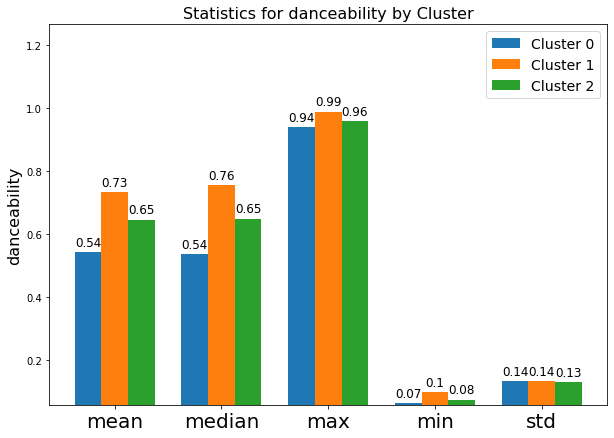

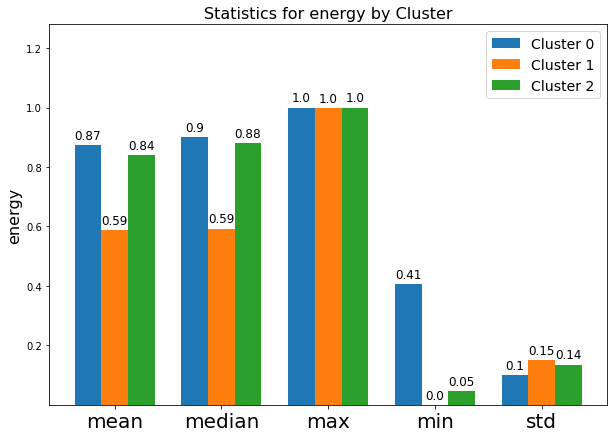

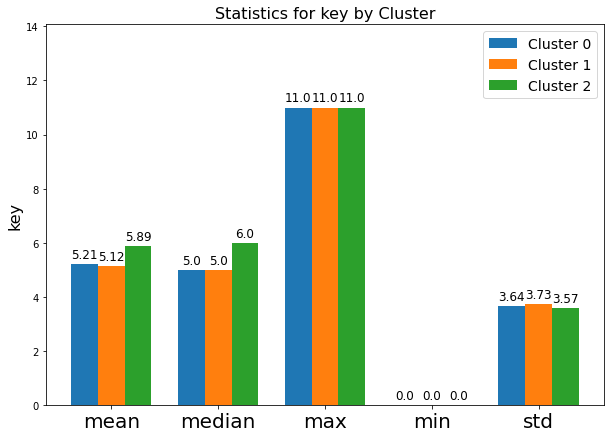

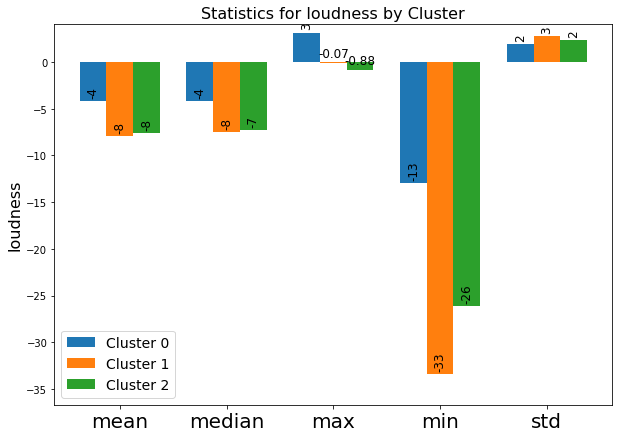

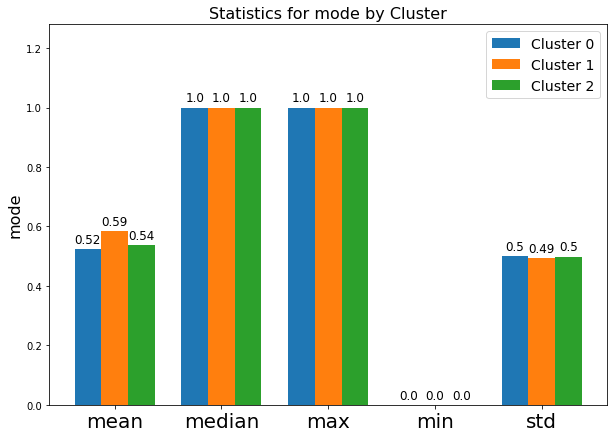

...

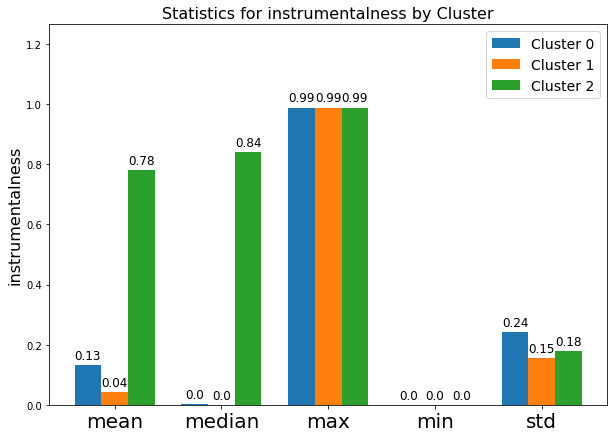

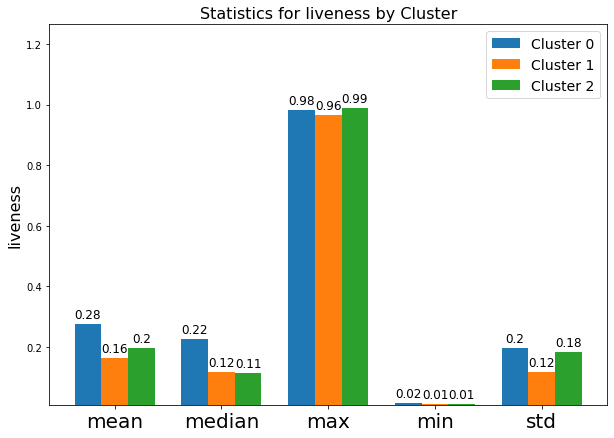

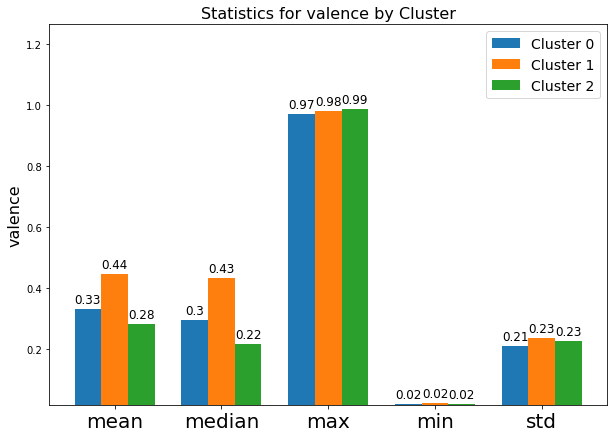

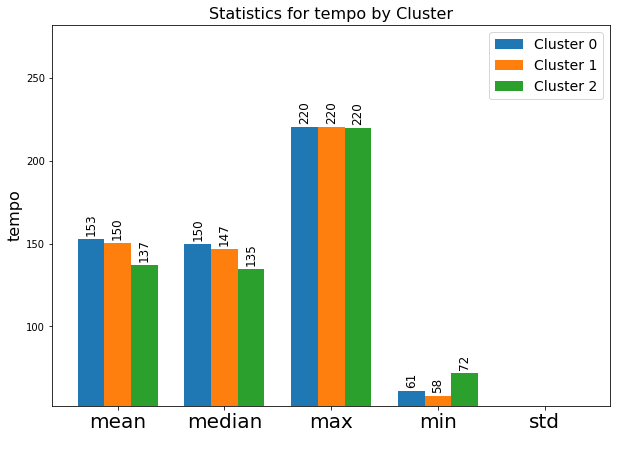

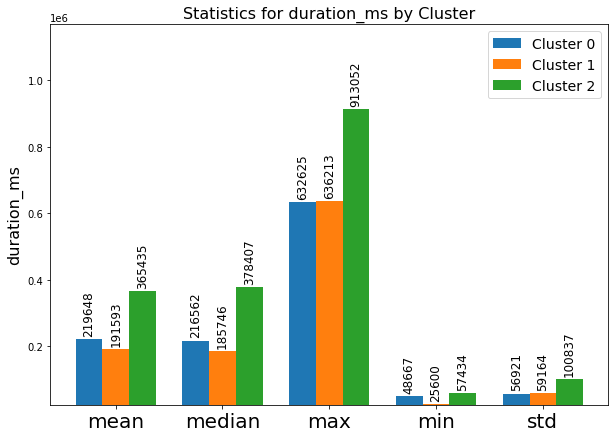

In [ ]:
for i in range(len(measures)):
  labels = ['mean','median','max','min','std']
  cluster0stats = clusters3_stats_df.loc[clusters3_stats_df.cluster ==0].loc[clusters3_stats_df.measure == measures[i]].iloc[:,2:].values.tolist()[0]
  cluster1stats = clusters3_stats_df.loc[clusters3_stats_df.cluster ==1].loc[clusters3_stats_df.measure == measures[i]].iloc[:,2:].values.tolist()[0]
  cluster2stats = clusters3_stats_df.loc[clusters3_stats_df.cluster ==2].loc[clusters3_stats_df.measure == measures[i]].iloc[:,2:].values.tolist()[0]

  x = np.arange(len(labels))
  width = .25
  ymax = clusters3_stats_df.loc[clusters3_stats_df.measure == measures[i]]['max'].max()
  ymin = clusters3_stats_df.loc[clusters3_stats_df.measure == measures[i]]['min'].min()

  fig, ax = plt.subplots(figsize=(10,7))
  rects1 = ax.bar(x-width,cluster0stats,width,label='Cluster 0')
  rects2 = ax.bar(x,cluster1stats,width,label='Cluster 1')
  rects3 = ax.bar(x+width,cluster2stats,width,label='Cluster 2')

  # Add some text for labels, title and custom x-axis tick labels, etc.
  ax.set_ylabel(measures[i],fontsize=16)
  ax.set_title('Statistics for {} by Cluster'.format(measures[i]),fontsize=16)
  ax.set_xticks(x)
  ax.set_ylim((ymin-abs(ymin)*.1),(ymax+ymax*.28))
  ax.set_xticklabels(labels,fontsize=20)
  ax.legend()

  def autolabel(rects):
    for rect in rects:
      height = rect.get_height()
      if abs(height) < 1.1 or measures[i] == 'key':
        ax.annotate('{}'.format(round(height,2)),
                    xy=(rect.get_x() + rect.get_width() /2,height),
                    xytext = (0,3), # 3 points vertical offset
                    fontsize=12,
                    textcoords = 'offset points',
                    ha='center',va='bottom',
                    )
      else:
        ax.annotate('{}'.format(int(round(height,0))),
                    xy=(rect.get_x() + rect.get_width() /2,height),
                    xytext = (0,3), # 3 points vertical offset
                    fontsize=12,
                    textcoords = 'offset points',
                    ha='center',va='bottom',
                    rotation=90
                    )


  autolabel(rects1)
  autolabel(rects2)
  autolabel(rects3)
  plt.legend(['Cluster 0', 'Cluster 1', 'Cluster 2'],
            fontsize=14
  )

  plt.show()

##### Important Insights of Each Feature

It appears these 3 clusters vary the most in the following:

DANCEABILITY:
- Cluster 0 has the lowest mean danceability while cluster 1 has the highest mean danceability

ENERGY:
- Cluster 1 has the lowest mean energy, while cluster 0 has the highest mean energy as well as the highest minimum energy.
- All three clusters have the same maximum energy

KEY:
- There is NOT a great deal of variability in key between the clusters

LOUDNESS: 
- The only noteable variety here is that Cluster 0 tends to be much louder than Cluster 1 and 2, while Cluster 1 has the lowest minimum, meaning it encompasses very soft songs

MODE: 
- There is little to no variability here

SPEECHINESS:
- Cluster 2 has the lowest max for speechiness, suggesting it encompasses less speechy songs than Clusters 0 and 1

ACOUSTICNESS:
- Cluster 1 has a higher mean and a higher max, suggesting that Cluster 1 accounts for much of the acoustic songs, alhtough there is a wider variety in acousticness so this is not the only definition of this cluster

INSTRUMENTALNESS: 
- Cluster 2 has a significantly higher mean of instrumentalness, indicating Cluster 2 may account for much of the instrumental songs

LIVENESS:
- There is not a great deal of variability here

VALENCE:
- There is not a great deal of variability here, except that Cluster 1 has a higher mean than both Cluster 0 and Cluster 2, which are comparable

TEMPO:
- There is not a great deal of variablility here, though the tempo of Cluster 3 seems to be the lowest

DURATION_MS:
- Cluster 2 encompasses songs that are MUCH longer than Cluster 0 and 1

#### Comparing Clusters with Standardized Measures

To compare the statistics of clusters in one plot, its important to scale the statistics to be between 0 and 1. We'll do this by dividing every aspect by the maximum of the category to create relative measures. A little extra processing of the loudness is necessary considering decibels can be negative.

In [ ]:
for i in range(len(measures)):
  analysis_df['rel_{}'.format(measures[i])] = (analysis_df[measures[i]] / analysis_df[measures[i]].max())

In [ ]:
analysis_df.describe().iloc[:,-12:]

,rel_danceability,rel_energy,rel_key,rel_loudness,rel_mode,rel_speechiness,rel_acousticness,rel_instrumentalness,rel_liveness,rel_valence,rel_tempo,rel_duration_ms
count,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000
mean,0.647130,0.762516,0.488204,-2.053825,0.549462,0.144356,0.097328,0.286196,0.216679,0.361438,0.669454,0.274755
std,0.158519,0.183823,0.333286,0.934296,0.497553,0.133370,0.172901,0.374915,0.177708,0.236033,0.108242,0.112762
min,0.065891,0.000243,0.000000,-10.596252,0.000000,0.023996,0.000001,0.000000,0.010830,0.018927,0.263139,0.028038
25%,0.530364,0.632000,0.090909,-2.592440,0.000000,0.051903,0.001751,0.000000,0.100810,0.162955,0.589818,0.196966
50%,0.653846,0.803000,0.545455,-1.980305,1.000000,0.079810,0.016599,0.006006,0.136640,0.325911,0.658101,0.246163
75%,0.775304,0.923000,0.818182,-1.433609,1.000000,0.204017,0.108300,0.730030,0.297571,0.528340,0.732961,0.329809
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
# Just need to fix loudness considered that had negative values
analysis_df['rel_loudness'] = analysis_df['loudness'] + abs(analysis_df.loudness.min())
analysis_df['rel_loudness'] = analysis_df['rel_loudness'] / analysis_df['rel_loudness'].max()

In [ ]:
analysis_df.describe().iloc[:,-12:]

,rel_danceability,rel_energy,rel_key,rel_loudness,rel_mode,rel_speechiness,rel_acousticness,rel_instrumentalness,rel_liveness,rel_valence,rel_tempo,rel_duration_ms
count,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000
mean,0.647130,0.762516,0.488204,0.736654,0.549462,0.144356,0.097328,0.286196,0.216679,0.361438,0.669454,0.274755
std,0.158519,0.183823,0.333286,0.080569,0.497553,0.133370,0.172901,0.374915,0.177708,0.236033,0.108242,0.112762
min,0.065891,0.000243,0.000000,0.000000,0.000000,0.023996,0.000001,0.000000,0.010830,0.018927,0.263139,0.028038
25%,0.530364,0.632000,0.090909,0.690207,0.000000,0.051903,0.001751,0.000000,0.100810,0.162955,0.589818,0.196966
50%,0.653846,0.803000,0.545455,0.742994,1.000000,0.079810,0.016599,0.006006,0.136640,0.325911,0.658101,0.246163
75%,0.775304,0.923000,0.818182,0.790138,1.000000,0.204017,0.108300,0.730030,0.297571,0.528340,0.732961,0.329809
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
rel_stats0 = analysis_df.loc[analysis_df.clusters3 == 0].describe().iloc[:,-12:]
relstats1 = analysis_df.loc[analysis_df.clusters3 == 1].describe().iloc[:,-12:]
relstats2 = analysis_df.loc[analysis_df.clusters3 == 2].describe().iloc[:,-12:]

In [ ]:
rel_measures = analysis_df.describe().iloc[:,-12:].columns.tolist()

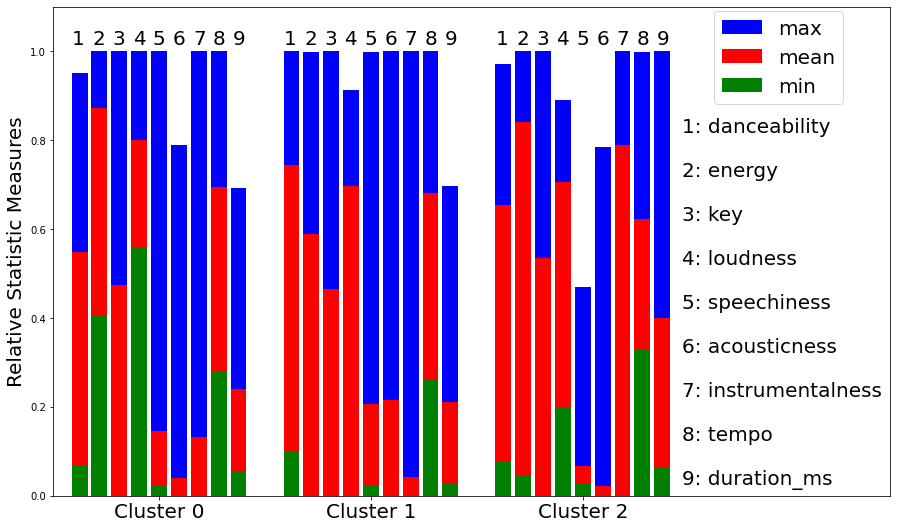

In [ ]:
labels = ['Cluster 0','Cluster 1','Cluster 2']

# means
danceabilitymeans = [rel_stats0.iloc[1,0],relstats1.iloc[1,0],relstats2.iloc[1,0]]
energymeans = [rel_stats0.iloc[1,1],relstats1.iloc[1,1],relstats2.iloc[1,1]]
keymeans = [rel_stats0.iloc[1,2],relstats1.iloc[1,2],relstats2.iloc[1,2]]
loudmeans = [rel_stats0.iloc[1,3],relstats1.iloc[1,3],relstats2.iloc[1,3]]
speechmeans = [rel_stats0.iloc[1,5],relstats1.iloc[1,5],relstats2.iloc[1,5]]
acousticmeans = [rel_stats0.iloc[1,6],relstats1.iloc[1,6],relstats2.iloc[1,6]]
instrummeans = [rel_stats0.iloc[1,7],relstats1.iloc[1,7],relstats2.iloc[1,7]]
tempomeans = [rel_stats0.iloc[1,10],relstats1.iloc[1,10],relstats2.iloc[1,10]]
durationmeans = [rel_stats0.iloc[1,11],relstats1.iloc[1,11],relstats2.iloc[1,11]]

# maxes
danceabilitymaxes = [rel_stats0.iloc[7,0],relstats1.iloc[7,0],relstats2.iloc[7,0]]
energymaxes = [rel_stats0.iloc[7,1],relstats1.iloc[7,1],relstats2.iloc[7,1]]
keymaxes = [rel_stats0.iloc[7,2],relstats1.iloc[7,2],relstats2.iloc[7,2]]
loudmaxes = [rel_stats0.iloc[7,3],relstats1.iloc[7,3],relstats2.iloc[7,3]]
speechmaxes = [rel_stats0.iloc[7,5],relstats1.iloc[7,5],relstats2.iloc[7,5]]
acousticmaxes = [rel_stats0.iloc[7,6],relstats1.iloc[7,6],relstats2.iloc[7,6]]
instrummaxes = [rel_stats0.iloc[7,7],relstats1.iloc[7,7],relstats2.iloc[7,7]]
tempomaxes = [rel_stats0.iloc[7,10],relstats1.iloc[7,10],relstats2.iloc[7,10]]
durationmaxes = [rel_stats0.iloc[7,11],relstats1.iloc[7,11],relstats2.iloc[7,11]]

# mins
danceabilitymins = [rel_stats0.iloc[3,0],relstats1.iloc[3,0],relstats2.iloc[3,0]]
energymins = [rel_stats0.iloc[3,1],relstats1.iloc[3,1],relstats2.iloc[3,1]]
keymins = [rel_stats0.iloc[3,2],relstats1.iloc[3,2],relstats2.iloc[3,2]]
loudmins = [rel_stats0.iloc[3,3],relstats1.iloc[3,3],relstats2.iloc[3,3]]
speechmins = [rel_stats0.iloc[3,5],relstats1.iloc[3,5],relstats2.iloc[3,5]]
acousticmins = [rel_stats0.iloc[3,6],relstats1.iloc[3,6],relstats2.iloc[3,6]]
instrummins = [rel_stats0.iloc[3,7],relstats1.iloc[3,7],relstats2.iloc[3,7]]
tempomins = [rel_stats0.iloc[3,10],relstats1.iloc[3,10],relstats2.iloc[3,10]]
durationmins = [rel_stats0.iloc[3,11],relstats1.iloc[3,11],relstats2.iloc[3,11]]

x = np.arange(len(labels))
width = .075

fig, ax = plt.subplots(figsize=(15,9))

max1 = ax.bar(x-width*5,danceabilitymaxes,width,color='b')
mean1 = ax.bar(x-width*5,danceabilitymeans,width,color='r')
min1 = ax.bar(x-width*5,danceabilitymins,width,color='g')

max2 = ax.bar(x-width*3.75,energymaxes,width,color='b')
mean2 = ax.bar(x-width*3.75,energymeans,width,color='r')
min2 = ax.bar(x-width*3.75,energymins,width,color='g')

max3 = ax.bar(x-width*2.5,keymaxes,width,color='b')
mean3 = ax.bar(x-width*2.5,keymeans,width,color='r')
min3 = ax.bar(x-width*2.5,keymins,width,color='g')

max4 = ax.bar(x-width*1.25,loudmaxes,width,color='b')
mean4 = ax.bar(x-width*1.25,loudmeans,width,color='r')
min4 = ax.bar(x-width*1.25,loudmins,width,color='g')

max5 = ax.bar(x,speechmaxes,width,color='b')
mean5 = ax.bar(x,speechmeans,width,color='r')
min5 = ax.bar(x,speechmins,width,color='g')

max6 = ax.bar(x+width*1.25,acousticmaxes,width,color='b')
mean6 = ax.bar(x+width*1.25,acousticmeans,width,color='r')
min6 = ax.bar(x+width*1.25,acousticmins,width,color='g')

max7 = ax.bar(x+width*2.5,instrummaxes,width,color='b')
mean7 = ax.bar(x+width*2.5,instrummeans,width,color='r')
min7 = ax.bar(x+width*2.5,instrummins,width,color='g')

max8 = ax.bar(x+width*3.75,tempomaxes,width,color='b')
mean8 = ax.bar(x+width*3.75,tempomeans,width,color='r')
min8 = ax.bar(x+width*3.75,tempomins,width,color='g')

max9 = ax.bar(x+width*5,durationmaxes,width,color='b')
mean9 = ax.bar(x+width*5,durationmeans,width,color='r')
min9 = ax.bar(x+width*5,durationmins,width,color='g')

bar_labels = np.arange(1,10).tolist()

for i in range(1,10):
  ax.annotate(
      '{}'.format(i),
      xy=(-.38 + (.095*(i-1)),1),
      xytext= (0,3),
      textcoords='offset points',
      fontsize=20,
      ha='center',va='bottom'
      )
  
for i in range(1,10):
  ax.annotate(
      '{}'.format(i),
      xy=(.62 + (.095*(i-1)),1),
      xytext= (0,3),
      textcoords='offset points',
      fontsize=20,
      ha='center',va='bottom'
      )

for i in range(1,10):
  ax.annotate(
      '{}'.format(i),
      xy=(1.62 + (.095*(i-1)),1),
      xytext= (0,3),
      textcoords='offset points',
      fontsize=20,
      ha='center',va='bottom'
      )

ax.set_ylabel('Relative Statistic Measures',fontsize=20)
ax.set_xticks(x)
ax.set_xticklabels(labels,fontsize=20)
ax.set_ylim(0,1.1)
ax.set_xlim(-0.5,3.45)
leg1 = ax.legend(['max','mean','min'],fontsize=20, loc=(.79,.8))

ax.text(
    2.47,.025,
    '1: {}\n\n2: {}\n\n3: {}\n\n4: {}\n\n5: {}\n\n6: {}\n\n7: {}\n\n8: {}\n\n9: {}'.format(measures[0],measures[1],measures[2],measures[3],measures[5],measures[6],measures[7],measures[10],measures[11]),
    color='black',
    fontsize=20
)

plt.show()

#### Genre and Clusters

In [ ]:
len(analysis_df.loc[analysis_df.clusters3 == 0].loc[analysis_df.genre == 'Dark Trap'])

1239

In [ ]:
len(analysis_df.loc[analysis_df.clusters3 == 0])

15313

In [ ]:
genres = analysis_df.genre.value_counts().sort_index().index.tolist()

In [ ]:
cluster_genres_df = pd.DataFrame({})
cluster_genres = []
cluster_no = []
percentages = []
clusters = [0,1,2]
for i in range(len(clusters)):
  for j in range(len(genres)):
    percentage = 100 * len(analysis_df.loc[analysis_df.clusters3 == i].loc[analysis_df.genre == genres[j]]) / len(analysis_df.loc[analysis_df.clusters3 == i])
    percentages.append(percentage)
    cluster_genres.append(genres[j])
    cluster_no.append(clusters[i])
cluster_genres_df['cluster'] = cluster_no
cluster_genres_df['genre'] = cluster_genres
cluster_genres_df['percentage'] = percentages

In [ ]:
cluster_genres_df.sort_values(by=['cluster','percentage'])

,cluster,genre,percentage
12,0,techno,0.091426
10,0,psytrance,0.372233
3,0,Pop,1.332201
4,0,Rap,1.652191
11,0,techhouse,2.683994
5,0,RnB,2.729707
2,0,Hiphop,4.786782
6,0,Trap Metal,6.602233
7,0,Underground Rap,6.765493
0,0,Dark Trap,8.091164


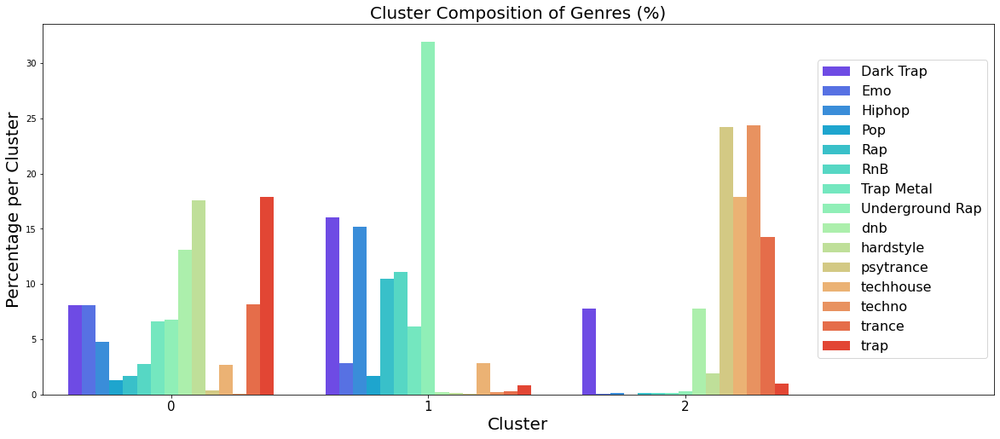

In [ ]:
plt.figure(figsize=(20,8))
sns.barplot(hue=cluster_genres_df['genre'],y=cluster_genres_df['percentage'],x=cluster_genres_df['cluster'],palette='rainbow')
plt.xticks(fontsize=15)
plt.xlabel('Cluster',fontsize=20)
plt.ylabel('Percentage per Cluster',fontsize=20)
plt.legend(fontsize=16,loc='center right')
plt.xlim(-0.5,3.2)
plt.title('Cluster Composition of Genres (%)',fontsize=20)
plt.show()

In [ ]:
plt.figure(figsize=(12,8))
sns.barplot(x=cluster_genres_df['genre'],y=cluster_genres_df['percentage'],hue=cluster_genres_df['cluster'])
plt.xticks(rotation=45,fontsize=12)
plt.xlabel('Genre',fontsize=20)
plt.ylabel('Percentage per Cluster',fontsize=20)
plt.legend(fontsize=20)
plt.show()

In [ ]:
# percentages of music in database
genre_percentages = []
for i in range(len(genres)):
  genre_percentage = 100 * len(analysis_df.loc[analysis_df.genre == genres[i]])/analysis_df.shape[0]
  genre_percentages.append(genre_percentage)
genre_percentages_df = pd.DataFrame({'genre':genres,'percentage_of_data':genre_percentages})

In [ ]:
genre_percentages_df

,genre,percentage_of_data
0,Dark Trap,10.821416
1,Emo,3.971162
2,Hiphop,7.157546
3,Pop,1.089706
4,Rap,4.368278
5,RnB,4.961588
6,Trap Metal,4.623567
7,Underground Rap,13.887247
8,dnb,7.010992
9,hardstyle,6.940078


In [ ]:
genres0 = []
genres1 = []
genres2 = []
for i in range(len(genres)):
  genre0 = 100* analysis_df.loc[analysis_df.genre == genres[i],'clusters3'].value_counts().sort_index().values[0] / len(analysis_df.loc[analysis_df.genre == genres[i]])
  genre1 = 100* analysis_df.loc[analysis_df.genre == genres[i],'clusters3'].value_counts().sort_index().values[1] / len(analysis_df.loc[analysis_df.genre == genres[i]])
  genre2 = 100* analysis_df.loc[analysis_df.genre == genres[i],'clusters3'].value_counts().sort_index().values[2] / len(analysis_df.loc[analysis_df.genre == genres[i]])
  genres0.append(genre0)
  genres1.append(genre1)
  genres2.append(genre2)
genre_percentages_df['cluster0'] = genres0
genre_percentages_df['cluster1'] = genres1
genre_percentages_df['cluster2'] = genres2

In [ ]:
genre_percentages_df.sort_values(by='percentage_of_data',ascending=False)

,genre,percentage_of_data,cluster0,cluster1,cluster2
7,Underground Rap,13.887247,17.634043,81.804255,0.561702
0,Dark Trap,10.821416,27.064220,52.621232,20.314548
2,Hiphop,7.157546,24.207398,75.330251,0.462351
13,trance,7.088997,41.647216,1.567189,56.785595
14,trap,7.060631,91.831269,4.151322,4.017409
11,techhouse,7.032266,13.815126,14.453782,71.731092
8,dnb,7.010992,67.768038,1.011463,31.220499
10,psytrance,6.999173,1.925025,0.236407,97.838568
12,techno,6.987354,0.473613,1.116373,98.410014
9,hardstyle,6.940078,91.655313,0.647139,7.697548


In [ ]:
len(genre_percentages_df)

15

In [ ]:
genre_percentages_df.genre.values.tolist() * 3

['Dark Trap',
 'Emo',
 'Hiphop',
 'Pop',
 'Rap',
 'RnB',
 'Trap Metal',
 'Underground Rap',
 'dnb',
 'hardstyle',
 'psytrance',
 'techhouse',
 'techno',
 'trance',
 'trap']

In [ ]:
genre_for_vis = genre_percentages_df.genre.values.tolist() * 3
data = genre_percentages_df.cluster0.values.tolist() + genre_percentages_df.cluster1.values.tolist() + genre_percentages_df.cluster1.values.tolist()
cluster = ['Cluster0'] * len(genre_percentages_df) + ['Cluster1'] *len(genre_percentages_df) + ['Cluster2']*len(genre_percentages_df)
vis_db = pd.DataFrame({'genre':genre_for_vis,'cluster_percentage':data,'cluster':cluster})
vis_db

,genre,cluster_percentage,cluster
0,Dark Trap,27.064220,Cluster0
1,Emo,74.047619,Cluster0
2,Hiphop,24.207398,Cluster0
3,Pop,44.251627,Cluster0
4,Rap,13.690476,Cluster0
5,RnB,19.914245,Cluster0
6,Trap Metal,51.687117,Cluster0
7,Underground Rap,17.634043,Cluster0
8,dnb,67.768038,Cluster0
9,hardstyle,91.655313,Cluster0


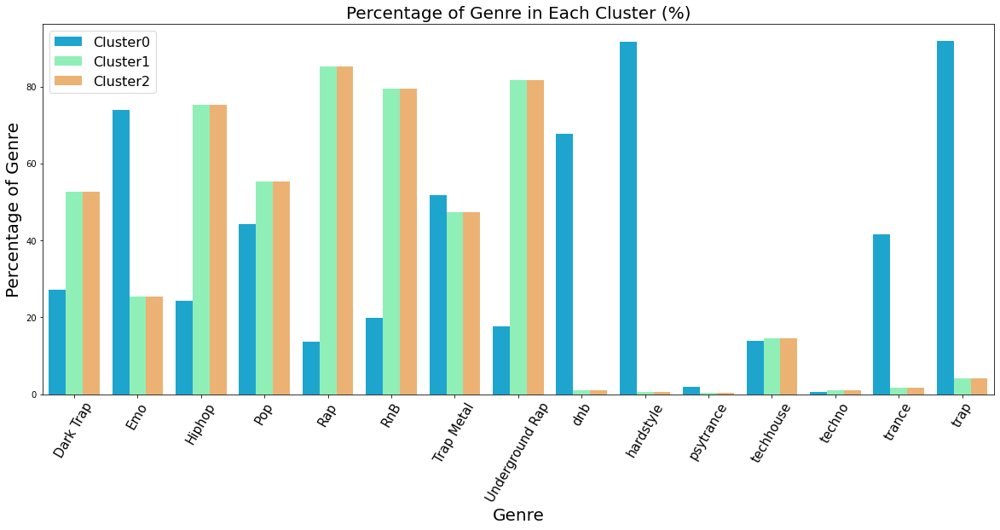

In [ ]:
plt.figure(figsize=(20,8))
sns.barplot(x = vis_db['genre'],y=vis_db['cluster_percentage'],hue=vis_db['cluster'],palette='rainbow')
plt.xticks(fontsize=15)
plt.xlabel('Genre',fontsize=20)
plt.xticks(rotation=60)
plt.ylabel('Percentage of Genre',fontsize=20)
plt.legend(fontsize=16)
plt.title('Percentage of Genre in Each Cluster (%)',fontsize=20)
plt.show()

##### Important Insights Regarding Genres in the Dataset

It's clear that there is very little Pop, Emo, Rap, and RnB in this data set, while there is proportionally MUCH larger songs of the genre Underground Rap, Dark Trap, HipHop, trance, and trap.

While I cannot say with certainty whethere these percentages represent a random sampling of the music available on spotify, it is possible that this inbalance in 'target classes' (although we did not necessarily use them as targets), affects the clustering. 

- **Underground Rap** is by far mostly clustered into Cluster 1, with a distant second of Cluster 0
- **Dark Trap** is largerly in Cluster 1, but with decent representation in Clusters 0 and 2
- **Hiphop** is largely in cluster 1, with a distant runner up in Cluster 0
- **trance** is mostly in Cluster 2, with a very close second in Cluster 0.
- **trap** is largely in Cluser 0, with little representation in other groups
- **techhouse** is mostly in Cluster 2, with equal but low representation in the other clusters
- **dnb** has just over two-thirds in Cluster 0 with the other third mostly in Cluster 2
- **psytrance** Is almost entirely in Cluster 2
- **techno** is nearly entirely in Cluster 2
- **RnB** is largely in Cluster 1, with some in Cluster 0
- **Trap Metal** is split equitably between Cluster 0 and Cluster 1, with the slight majority in Cluster 0
- **Rap** is largely in Cluster 1, with the rest in Cluster 0
- **Emo** is largely in Cluster 0, with the rest in Cluster 1
- **Pop** is split equitably between Clusters 1 and 0, with the majority being in Cluster 1

#### Important Insights of Each Cluster

CLUSTER 0 NOTABLE CHARACTERISTICS:
1. **Danceability** has the **lowest** max, mean, and min
2. **Energy** has the **highest** mean and min
3. **Key** includes a **wide variety** of different keys, and the statistics are **comparable** to the other clusters.
4. **Loudness** has the **highest** mean and max
5. **Speechiness** mean is in the **middle**, min is **comparable** to other groups, max is **comparable** to Cluster 1 but **much higher** than Cluster 2
6. **Acousticness** has a **lower** max than Cluster 1 but a **comparable** max to Cluster 2. The mean can be comparied similarly. 
7. **Instrumentalness** has a mean **in the middle** but still **much lower** than Cluster 2
8. **Tempo** max, mean, and min are quite **comparaable** between groups, indicated tempo is not considered heavily when clustering songs, and all types of songs have a **wide variety** of tempos
9. **Duration** of songs in Cluster 0 are **comparable** to Cluster 1 but max and min are **much lower** than Cluster 2

**This Clusters Main Genres Include:**
- Trap, hardstyle, and dnb are the top 3 of this cluster
- Most of the Trap is in this cluster
- Most of the Emo music is in this cluster
- Two-thirds of dnb is in this cluster
- This cluster has slightly over half of the Trap Metal
- This cluster has just under half of the Pop Music
- A decent amount of trance music is in this cluster
- This cluster has some but less of Underground Rap, Rap, Hiphop, Dark Trap, techhouse, and RnB

CLUSTER 1 NOTABLE CHARACTERISTICS:
1. **Danceability** has the **highest** mean, max, and min of any of the groups
2. **Energy** has the **lowest** mean and min of any of the Clusters
3. **Key** includes a **wide variety** of different keys, and the statistics are **comparable** to the other clusters
4. **Loudness** has the **lowest** minimum than other clusters, and a **lower** max and mean than Cluster 0, and a **comparable** max and min to Cluster 2
5. **Speechiness** has the **highest** mean than other groups, and a **comparable** max to Cluster 0, which is **higher** than Cluster 2's max, and a **comparable** min to all clusters
6. **Acousticness** has the **highest** max and mean than any cluster
7. **Instrumentalness** has the **lowest** mean than any cluster
8. **Tempo** is **comparable** between groups
9. **Duration** of songs for this cluster is the **lowest** but comparable to Cluster 0. Duration for each statistic is lower than Cluster 2

**This Clusters Main Genres Include:**
- Underground Rap, Dark Trap, and Hiphop are the top 3 of this cluster
- Most of the RnB is in this cluster
- This clsuter has just over half of the Pop music
- This cluster has less than half of the Trap Metal
- While most of the Emo music is in Cluser 0, the rest is mostly in this cluster

CLUSTER 2 NOTABLE CHARACTERISTICS:
1. **Danceability** is **comparable** to Cluster 0, and **lower**. than Cluster 1
2. **Energy** mean and min are in the **middle**
3. **Key** includes a wide variety of different keys and the statistics are **comparable** to other clusters
4. **Loudness** has a max and mean that are **lower** than Cluster 0, and **comparable** to Cluster 1. The min is much **higher** than Cluster 2 but much **lower** than Cluster 0
5. **Speechiness** has the **lowest** max and mean than any other Cluster
6. **Acousticness** has a much **lower** max and mean than Cluster 1, and the statistics are **comparable** to Cluster 0
7. **Instrumentalness** has the **highest** mean by far than any other cluster
8. **Tempo** is **comparable** to other clusters
9. **Duration** has the **highest** max, mean, and min. There are some long songs in this cluster! 

**This Clusters Main Genres Include:**
- techno, psytrance, and techhouse, with a nonnegligible amount of trance
- This cluster has one-third of the dnb music
- This cluster has some Dark Trap as well


## Conclusion

Overall the specifications in the clusters are clear, and seem appropriate.

**Cluster 0** has low danceability, high energy, very loud, medium speechiness, and generally lower instrumentalness and duration. This cluster consists of mostly Trap, but also contains most of the Emo music, and most of the dnb music, with almost half of Pop music.

**Cluster 1** has high danceability, speechiness, and acousticness, with low energy and song duration, and the quietest songs. This cluster contains most of the pop & rnb music, and consists of mostly undergroud rap, dark trap, and hip hop. 

**Cluster 2** has high instrumentalness and duration, low speechiness and  acoustincness, middle danceability, energy, and loudness. This cluster is largely made up of techno and psytrance, with quite a bit of techhouse and trance as well. 

Some limitations may include further investigating whether the data set used here represents the songs available on Spotify, as the majority of this data set consists of Underground Rap, Hiphop, Trance, Dark Trap, Trap, Techhouse, and dnb. While this may be possible that this is representative of the music available on Spotify, it'd also be interesting to get a representative sample of the music on spotify that is most listented to, which may not contain such a high percentage of these genres. 

Further employment of this data may include using some of the higher cluster number models, to more deeply differentiate between music tastes and better recommend music, although the scores of the models are lower.

Finally, if a user mostly resides within one cluster, each cluster could be analyzed and further broken down to more clusters, to further discern music tastes and better recommend music.
